In [1]:
!pip install scikit-multilearn

In [2]:
!pip install neptune-client

     |████████████████████████████████| 253 kB 805 kB/s 
     |████████████████████████████████| 67 kB 3.9 MB/s 
  Created wheel for neptune-client: filename=neptune_client-0.10.7-py2.py3-none-any.whl size=433191 sha256=2324c07ab6bd6ee29111522b79deb74eed0b37876faa4838ba3b3aaf89549d54
  Stored in directory: /root/.cache/pip/wheels/f2/33/32/bfd12f1259b6bdd55499e57469ac1e92b29b36e1516b952739
  Created wheel for strict-rfc3339: filename=strict_rfc3339-0.7-py3-none-any.whl size=18119 sha256=0461987fe4d6b0fc045403cdce468aa82a3fc41ca71f0f6e6e6e82105360a2b8
  Stored in directory: /root/.cache/pip/wheels/f3/1d/9f/2a74caecb81b8beb9a4fbe1754203d4b7cf42ef5d39e0d2311
Successfully built neptune-client strict-rfc3339


In [3]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import time
from tqdm import tqdm

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, roc_curve, auc, roc_auc_score, classification_report, mean_squared_error, confusion_matrix
from sklearn.preprocessing import label_binarize, StandardScaler, OneHotEncoder
from sklearn.feature_selection import RFECV
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score, RepeatedKFold
from sklearn.model_selection import StratifiedKFold
from keras.wrappers.scikit_learn import KerasClassifier

from skmultilearn.ensemble import MajorityVotingClassifier
from sklearn.preprocessing import LabelEncoder
from skmultilearn.cluster import FixedLabelSpaceClusterer
from skmultilearn.problem_transform import LabelPowerset, BinaryRelevance, ClassifierChain
from skmultilearn.model_selection.measures import get_combination_wise_output_matrix
from skmultilearn.model_selection import iterative_train_test_split, IterativeStratification

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

import neptune.new as neptune

plt.rcParams['font.sans-serif'] = "Helvetica"
plt.rcParams['font.family'] = "sans-serif"
plt.rcParams['font.size'] = 16
plt.rcParams['savefig.facecolor'] = 'white'

In [4]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import f1_score, precision_recall_fscore_support, accuracy_score

# Function definitions

In [5]:
def import_data(filepath):
    f = h5py.File(filepath, 'r')
    V = f['voltage'][...]
    Ca = f['calcium'][...]
    t = f['time'][...]
    labels = f['labels'][...]
    return V, Ca, t, labels


def normalize_traces(traces_a, traces_b=None):
    if traces_b == None:
        traces_a_norm = []
        for trace in traces_a:
            trace_norm = (trace - trace.min()) / (trace.max() - trace.min())
            traces_a_norm.append(trace_norm)
        traces_a_norm = np.array(traces_a_norm)
        return traces_a_norm
    else:  # if pass two sets of traces, normalize traces_b relative to traces_a
        traces_a_norm, traces_b_norm = [], []
        for trace_a, trace_b in zip(traces_a, traces_b):
            traces_a_norm.append(
                (trace_a - trace_a.min()) / (trace_a.max() - trace_a.min()))
            traces_b_norm.append(
                (trace_b - trace_a.min()) / (trace_a.max() - trace_a.min()))
        traces_a_norm = np.array(traces_a_norm)
        traces_b_norm = np.array(traces_b_norm)
        return traces_a_norm, traces_b_norm


def add_noise(X, percentage=5.0):
    std = np.nanmean(X, axis=0).std()
    noise = np.random.normal(0, std, X.shape) * percentage / 100
    X_noise = X + noise
    return X_noise

# Import data

In [6]:
#######################################################
# To get the data you should download the file from   #
# Google Drive and upload it to the working folder    #
# here in Google Colab                                #
#######################################################

data_path = "../input/ml-methods-for-identifying-ionic-channel-block/data.h5"


label_order = ['Kr', 'CaL', 'Na', 'NaL', 'to', 'Ks', 'K1']

V, Ca, t, labels = import_data(data_path)
# Separate control and drug cases
V_c = V[:, :, 0]
V_d = V[:, :, 1]
Ca_c = Ca[:, :, 0]
Ca_d = Ca[:, :, 1]


In [7]:
inner_cnt = 0
inner_cnt =+1 

In [8]:
inner_cnt

1

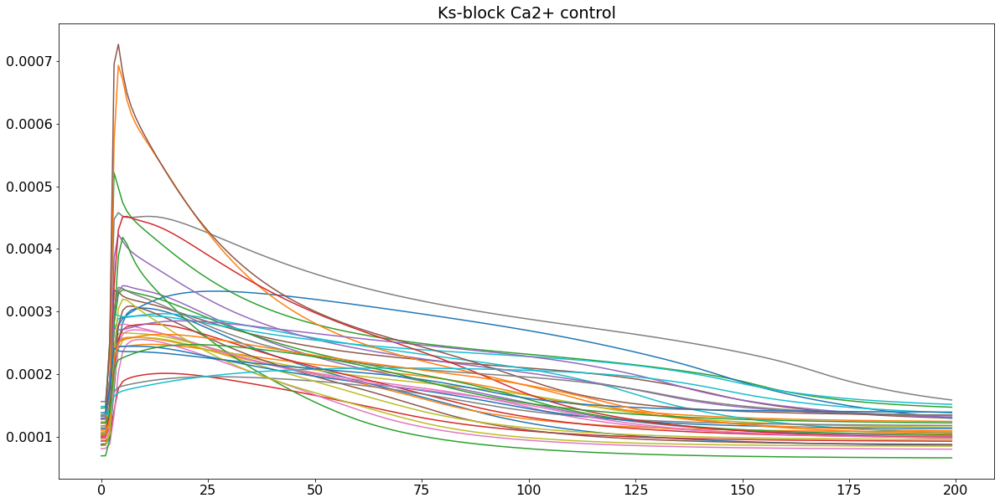

In [9]:
inner_cnt = 0
plt.figure(figsize=(20,10))
plt.title("Ks-block Ca2+ control")
for cnt,y in enumerate(labels):
    if (y == np.array([0,0,0,0,0,1,0])).all():
        plt.plot(Ca_c[cnt])
        inner_cnt =+1 
plt.savefig("Ks_control.png", dpi=100)
plt.show()

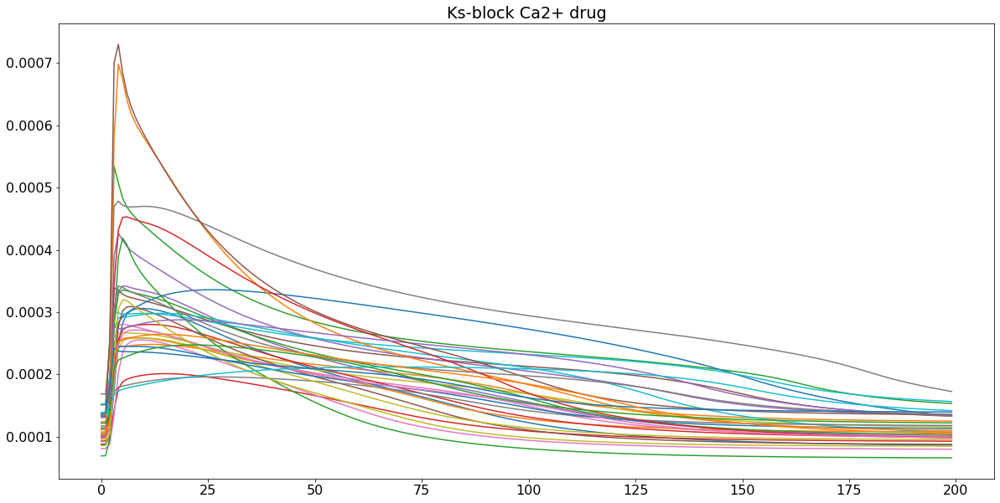

In [10]:
inner_cnt = 0
plt.figure(figsize=(20,10))
plt.title("Ks-block Ca2+ drug")
for cnt,y in enumerate(labels):
    if (y == np.array([0,0,0,0,0,1,0])).all():
        plt.plot(Ca_d[cnt])
        inner_cnt =+1 
plt.savefig("Ks_drug.png", dpi=100)
plt.show()

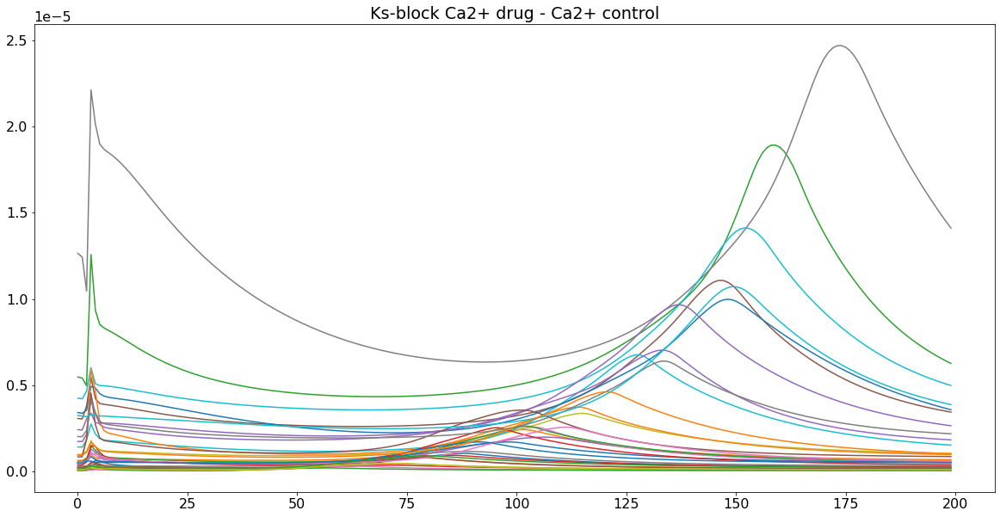

In [11]:
inner_cnt = 0
plt.figure(figsize=(20,10))
plt.title("Ks-block Ca2+ drug - Ca2+ control")
for cnt,y in enumerate(labels):
    if (y == np.array([0,0,0,0,0,1,0])).all():
        plt.plot(Ca_d[cnt]-Ca_c[cnt])
        inner_cnt =+1 
plt.savefig("Ksd-c.png", dpi=100)
plt.show()

inner_cnt = 0
plt.figure(figsize=(20,10))
for cnt,y in enumerate(labels):
    if (y == np.array([0,0,0,0,0,1,0])).all():
        plt.plot(X[cnt])
        inner_cnt =+1 
plt.savefig("Ks_d-Ks_c.png", dpi=100)
plt.show()

# Plot data

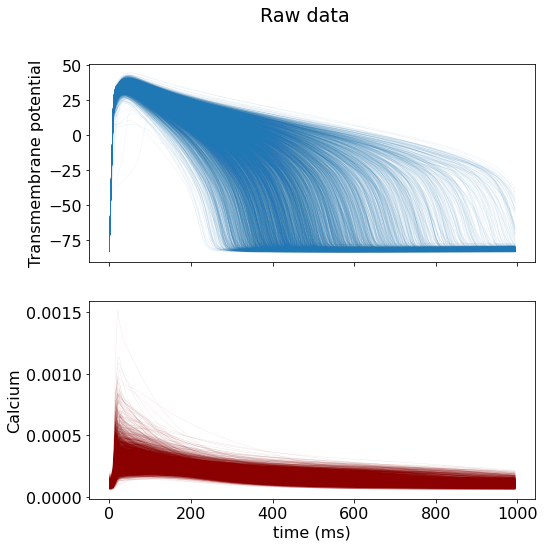

In [12]:
fig, ax = plt.subplots(2, 1, figsize=(8, 8), sharex=True)
fig.suptitle("Raw data")
for Vp, Cap in zip(V_c, Ca_c):
    ax[0].plot(t, Vp, c='tab:blue', lw=0.4, alpha=0.1)
    ax[1].plot(t, Cap, c='darkred', lw=0.4, alpha=0.1)
    ax[0].set_ylabel("Transmembrane potential")
    ax[1].set_ylabel("Calcium")
    ax[1].set_xlabel("time (ms)")
    #ax[0].set_xlabel("time (ms)")
plt.savefig("data.png", bbox_inches='tight')

# Prep data for classifier

In [13]:
# Add noise and combine V with Ca
def add_noise_and_normalize_new_axis(V_c, V_d, Ca_c, Ca_d, pct_noise=0):
    #pct_noise = 0.0
    V_c_norm, V_d_norm = normalize_traces(add_noise(V_c,pct_noise)), normalize_traces(add_noise(V_d,pct_noise))
    Ca_c_norm, Ca_d_norm = normalize_traces(add_noise(Ca_c,pct_noise)), normalize_traces(add_noise(Ca_d,pct_noise))
    V_diff = V_d_norm-V_c_norm
    Ca_diff = Ca_d_norm-Ca_c_norm
    #scaler_V = StandardScaler()
    #scaler_Ca = StandardScaler()
    #X_v = scaler_V.fit_transform(V_diff)
    #X_Ca = scaler_Ca.fit_transform(Ca_diff)
    X_Ca = Ca_diff
    X_v = V_diff
    X = np.concatenate((np.expand_dims(X_v,axis = 2),np.expand_dims(X_Ca,axis = 2)) ,axis=2)

    return X, V_d_norm, Ca_d_norm, V_c_norm, Ca_c_norm

In [14]:
# Add noise and combine V with Ca
def add_noise_and_normalize(V_c, V_d, Ca_c, Ca_d, pct_noise=0):
    #pct_noise = 0.0
    V_c_norm, V_d_norm = normalize_traces(add_noise(V_c,pct_noise)), normalize_traces(add_noise(V_d,pct_noise))
    Ca_c_norm, Ca_d_norm = normalize_traces(add_noise(Ca_c,pct_noise)), normalize_traces(add_noise(Ca_d,pct_noise))
    X = np.concatenate((V_d_norm-V_c_norm,Ca_d_norm-Ca_c_norm),axis=1)

    # Standardize data
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    return X

noise = 0
X = add_noise_and_normalize(V_c, V_d, Ca_c, Ca_d, noise) #, axis=1)
y = labels

# Split into training and testing
#ratio = 0.25 # test/total
#indices = np.arange(X_tmp.shape[0])
#X, y, X_super_test, y_super_test = iterative_train_test_split(X_tmp, y_tmp, test_size = ratio)
# X_train, X_test, y_train, y_test, idx_train, idx_test = train_test_split(X, y_sparse, indices, test_size=ratio, random_state=None)

In [15]:
from sklearn.preprocessing import LabelEncoder
def get_labels_for_all_combinations(y):
    y_all_combinations = LabelEncoder().fit_transform([''.join(str(l)) for l in y])
    return y_all_combinations

# Check list - Classifiers tested:

https://app.neptune.ai/o/SSCP/org/SSCP2021/experiments?split=tbl&dash=charts&viewId=standard-view&sortBy=%5B%22Noise%22%5D&sortFieldType=%5B%22int%22%5D&sortFieldAggregationMode=%5B%22auto%22%5D&sortDirection=%5B%22ascending%22%5D&suggestionsEnabled=true&lbViewUnpacked=true

### Noise = 0 %
- [X] NB-Binary relevance
- [X] NB-Label powerset
- [X] NB-Classifier chain
- [X] SVC-Label powerset
- [X] XGBoost - Label powerset
- [X] MLP
- [X] CNN Encoder
- [X] LSTM bidir

### Noise = 1 %
- [X] NB-Binary relevance
- [X] NB-Label powerset
- [X] NB-Classifier chain
- [X] SVC-Label powerset
- [X] XGBoost - Label powerset
- [X] MLP
- [X] CNN Encoder
- [X] LSTM bidir

### Noise = 2 %
- [X] NB-Binary relevance
- [X] NB-Label powerset
- [X] NB-Classifier chain
- [X] SVC-Label powerset
- [X] XGBoost - Label powerset
- [X] MLP
- [ ] CNN Encoder
- [ ] LSTM bidir

### Noise = 3 %
- [X] NB-Binary relevance
- [X] NB-Label powerset
- [X] NB-Classifier chain
- [X] SVC-Label powerset
- [X] XGBoost - Label powerset
- [X] MLP
- [X] CNN Encoder
- [X] LSTM bidir

### Noise = 4 %
- [X] NB-Binary relevance
- [X] NB-Label powerset
- [X] NB-Classifier chain
- [X] SVC-Label powerset
- [ ] XGBoost - Label powerset
- [X] MLP
- [X] CNN Encoder
- [ ] LSTM bidir

### Noise = 5 %
- [X] NB-Binary relevance
- [X] NB-Label powerset
- [X] NB-Classifier chain
- [X] SVC-Label powerset
- [X] XGBoost - Label powerset
- [X] MLP
- [X] CNN Encoder
- [ ] LSTM bidir

# Train and test classifier


## Naive Bayes

In [16]:
'''
clf = BinaryRelevance(classifier = GaussianNB())

start = time.time()
clf.fit(X_train, y_train)
print('training time: ',round(time.time()-start,2),'seconds')

y_hat = clf.predict(X_test).toarray().astype(int)
for i in range(7):
    print(f"Accuracy label {i}:",accuracy_score(y_test[:,i],y_hat[:,i]))
'''

'\nclf = BinaryRelevance(classifier = GaussianNB())\n\nstart = time.time()\nclf.fit(X_train, y_train)\nprint(\'training time: \',round(time.time()-start,2),\'seconds\')\n\ny_hat = clf.predict(X_test).toarray().astype(int)\nfor i in range(7):\n    print(f"Accuracy label {i}:",accuracy_score(y_test[:,i],y_hat[:,i]))\n'

## CNN

In [17]:
def encoder_model(n_input, n_output):
    X_input=tf.keras.layers.Input(shape=(n_input))
     # conv block -1
    conv1 = tf.keras.layers.Conv1D(filters=128,kernel_size=5,strides=1,padding='same')(X_input)
    conv1 = tfa.layers.InstanceNormalization()(conv1)
    conv1 = tf.keras.layers.PReLU(shared_axes=[1])(conv1)
    conv1 = tf.keras.layers.Dropout(rate=0.2)(conv1)
    conv1 = tf.keras.layers.MaxPooling1D(pool_size=2)(conv1)
    # conv block -2
    conv2 = tf.keras.layers.Conv1D(filters=256,kernel_size=11,strides=1,padding='same')(conv1)
    conv2 = tfa.layers.InstanceNormalization()(conv2)
    conv2 = tf.keras.layers.PReLU(shared_axes=[1])(conv2)
    conv2 = tf.keras.layers.Dropout(rate=0.2)(conv2)
    conv2 = tf.keras.layers.MaxPooling1D(pool_size=2)(conv2)
    # conv block -3
    conv3 = tf.keras.layers.Conv1D(filters=512,kernel_size=21,strides=1,padding='same')(conv2)
    conv3 = tfa.layers.InstanceNormalization()(conv3)
    conv3 = tf.keras.layers.PReLU(shared_axes=[1])(conv3)
    conv3 = tf.keras.layers.Dropout(rate=0.2)(conv3)
    # split for attention
    attention_data = tf.keras.layers.Lambda(lambda x: x[:,:,:])(conv3)
    attention_softmax = tf.keras.layers.Lambda(lambda x: x[:,:,:])(conv3)
    # attention mechanism
    attention_softmax = tf.keras.layers.Softmax()(attention_softmax)
    multiply_layer = tf.keras.layers.Multiply()([attention_softmax,attention_data])
    # last layer
    dense_layer = tf.keras.layers.Dense(units=512,activation='sigmoid')(multiply_layer)
    dense_layer = tfa.layers.InstanceNormalization()(dense_layer)
    # output layer
    flatten_layer = tf.keras.layers.Flatten()(dense_layer)
    output_layer = tf.keras.layers.Dense(units=n_output,activation='sigmoid')(flatten_layer)

    model = tf.keras.Model(inputs=X_input, outputs=output_layer)


    model.compile(loss=tf.keras.losses.BinaryCrossentropy(), optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
                  metrics=[tf.keras.metrics.BinaryAccuracy(name="accuracy")
                  #,tfa.metrics.F1Score(num_classes=n_output)
                  ])
    return model

In [18]:
def encoder_model_2():
    X_input=tf.keras.layers.Input(shape=(200,2))
     # conv block -1
    conv1 = tf.keras.layers.Conv1D(filters=128,kernel_size=5,strides=1,padding='same')(X_input)
    conv1 = tfa.layers.InstanceNormalization()(conv1)
    conv1 = tf.keras.layers.PReLU(shared_axes=[1])(conv1)
    conv1 = tf.keras.layers.Dropout(rate=0.2)(conv1)
    conv1 = tf.keras.layers.MaxPooling1D(pool_size=2)(conv1)
    # conv block -2
    conv2 = tf.keras.layers.Conv1D(filters=256,kernel_size=11,strides=1,padding='same')(conv1)
    conv2 = tfa.layers.InstanceNormalization()(conv2)
    conv2 = tf.keras.layers.PReLU(shared_axes=[1])(conv2)
    conv2 = tf.keras.layers.Dropout(rate=0.2)(conv2)
    conv2 = tf.keras.layers.MaxPooling1D(pool_size=2)(conv2)
    # conv block -3
    conv3 = tf.keras.layers.Conv1D(filters=512,kernel_size=21,strides=1,padding='same')(conv2)
    conv3 = tfa.layers.InstanceNormalization()(conv3)
    conv3 = tf.keras.layers.PReLU(shared_axes=[1])(conv3)
    conv3 = tf.keras.layers.Dropout(rate=0.2)(conv3)
    # split for attention
    attention_data = tf.keras.layers.Lambda(lambda x: x[:,:,:])(conv3)
    attention_softmax = tf.keras.layers.Lambda(lambda x: x[:,:,:])(conv3)
    # attention mechanism
    attention_softmax = tf.keras.layers.Softmax()(attention_softmax)
    multiply_layer = tf.keras.layers.Multiply()([attention_softmax,attention_data])
    # last layer
    dense_layer = tf.keras.layers.Dense(units=512,activation='sigmoid')(multiply_layer)
    dense_layer = tfa.layers.InstanceNormalization()(dense_layer)
    # output layer
    flatten_layer = tf.keras.layers.Flatten()(dense_layer)
    output_layer = tf.keras.layers.Dense(units=7,activation='sigmoid')(flatten_layer)

    model = tf.keras.Model(inputs=X_input, outputs=output_layer)


    model.compile(loss=tf.keras.losses.BinaryCrossentropy(), optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
                  metrics=[tf.keras.metrics.BinaryAccuracy(name="accuracy")])
    return model

In [19]:
!pip install tensorflow-addons

In [20]:
import tensorflow as tf
import tensorflow_addons as tfa

In [21]:
# Add noise and combine V with Ca
def add_noise_and_normalize_new_axis(V_c, V_d, Ca_c, Ca_d, pct_noise=0):
    #pct_noise = 0.0
    V_c_norm, V_d_norm = normalize_traces(add_noise(V_c,pct_noise)), normalize_traces(add_noise(V_d,pct_noise))
    Ca_c_norm, Ca_d_norm = normalize_traces(add_noise(Ca_c,pct_noise)), normalize_traces(add_noise(Ca_d,pct_noise))
    V_diff = V_d_norm-V_c_norm
    Ca_diff = Ca_d_norm-Ca_c_norm
    #scaler_V = StandardScaler()
    #scaler_Ca = StandardScaler()
    #X_v = scaler_V.fit_transform(V_diff)
    #X_Ca = scaler_Ca.fit_transform(Ca_diff)
    X_Ca = Ca_diff
    X_v = V_diff
    X = np.concatenate((np.expand_dims(X_v,axis = 2),np.expand_dims(X_Ca,axis = 2)) ,axis=2)

    return X, V_d_norm, Ca_d_norm, V_c_norm, Ca_c_norm

In [22]:
noise = 0

In [23]:
X_new, V_d_new, Ca_d_new, V_c_new, Ca_c_new = add_noise_and_normalize_new_axis(V_c, V_d, Ca_c, Ca_d, noise)

# Explain with Lime

In [24]:
#Define outer loop - 10-fold CV
cv_outer = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
y_transformed = get_labels_for_all_combinations(y)
# enumerate splits
outer_results = list()
class_results = np.zeros((cv_outer.get_n_splits(),len(label_order),4))
for k , (train_ix, test_ix) in enumerate(cv_outer.split(X_new,y_transformed)):
    # split data
    X_train, X_test = X_new[train_ix, :, :], X_new[test_ix, :,:]
    y_train, y_test = y[train_ix], y[test_ix]
    # configure the cross-validation procedure
    cv_inner = KFold(n_splits=3, shuffle=True, random_state=1)
    # define the model
    model = KerasClassifier(build_fn=encoder_model_2, verbose=1)
    # define search space
    parameters = {
        'epochs': [20,60,100],
        'batch_size': [20,60,100]
        #'epochs': [20],
        #'batch_size': [20]
    }
    # define search
    search = GridSearchCV(model, parameters, cv=cv_inner, refit=True)
    #search = GridSearchCV(estimator=model, param_grid=parameters)
    # execute search
    result = search.fit(X_train, y_train)
    # get the best performing model fit on the whole training set
    best_model = result.best_estimator_
    # evaluate model on the hold out dataset
    yhat = (best_model.model.predict(X_test) > 0.5) * 1
    # evaluate the model
    acc = accuracy_score(y_test, yhat) #f1_score(y_test, yhat, average='macro')
    pres, rec, f1, sup = precision_recall_fscore_support(y_test, yhat, average='macro')
    # store the result
    outer_results.append([acc, pres, rec, f1])
    # report progress
    print('>acc=%.3f, pres=%.3f, rec=%.3f, f1=%.3f, est=%.3f, cfg=%s' % (acc, pres, rec, f1, result.best_score_, result.best_params_))
    #log params to Neptune
    #finds and logs the evaluation for each outnode
    for channel in range(len(label_order)):
        curr_acc = accuracy_score(y_test[:,channel], yhat[:,channel]) #f1_score(y_test, yhat, average='macro')
        curr_pres, curr_rec, curr_f1, curr_sup = precision_recall_fscore_support(y_test[channel], yhat[channel], average='macro')
        class_results[k,channel,0] = curr_acc
        class_results[k,channel,1] = curr_pres
        class_results[k,channel,2] = curr_rec
        class_results[k,channel,3] = curr_f1
    break

Epoch 1/20
138/138 [==============================] - 9s 10ms/step - loss: 0.5830 - accuracy: 0.6516
Epoch 2/20
138/138 [==============================] - 1s 10ms/step - loss: 0.3971 - accuracy: 0.7853
Epoch 3/20
138/138 [==============================] - 1s 10ms/step - loss: 0.3363 - accuracy: 0.8234
Epoch 4/20
138/138 [==============================] - 1s 10ms/step - loss: 0.2888 - accuracy: 0.8434
Epoch 5/20
138/138 [==============================] - 1s 10ms/step - loss: 0.2487 - accuracy: 0.8731
Epoch 6/20
138/138 [==============================] - 1s 10ms/step - loss: 0.2288 - accuracy: 0.8826
Epoch 7/20
138/138 [==============================] - 2s 11ms/step - loss: 0.2298 - accuracy: 0.8853
Epoch 8/20
138/138 [==============================] - 1s 10ms/step - loss: 0.2108 - accuracy: 0.8960
Epoch 9/20
138/138 [==============================] - 1s 10ms/step - loss: 0.1990 - accuracy: 0.9026
Epoch 10/20
138/138 [==============================] - 1s 10ms/step - loss: 0.1962 - accura

In [25]:
!pip install lime

In [26]:
import lime
from lime import lime_tabular
import tensorflow as tf

In [27]:
V_c_new = V_c_new[test_ix, :]
V_d_new = V_d_new[test_ix, :]
Ca_d_new = Ca_d_new[test_ix, :]
Ca_c_new = Ca_c_new[test_ix, :]

In [28]:
import lime
from lime import lime_tabular
explainer = lime_tabular.RecurrentTabularExplainer(X_test[:100],training_labels=tf.keras.utils.to_categorical(y_test[0:10,6]), feature_names=["V","Ca"],
                                                    class_names=['open','blocked'])

In [29]:
class model_wrapper:
    # drf is the h2o distributed random forest object, the column_names is the
    # labels of the X values
    def __init__(self,model,num_class):
            
            self.model = model
            self.num_class = num_class
 
    def predict(self,input_data):        
        # If we have just 1 row of data we need to reshape it

        #input_data = input_data[:,:,0]


        # Predict with the h2o drf
        self.pred = self.model.predict(input_data)[:,self.num_class]

        
        
        return np.array([[1-self.pred,self.pred]]).T[:,:,0]

In [30]:
wrapped_mod = model_wrapper(best_model.model,num_class= 6)

In [31]:
exp = explainer.explain_instance(X_test[100:101],wrapped_mod.predict, num_features=400,num_samples=2)

In [32]:
import re

In [33]:
def average_and_rebin(array, bin_size):
    new_arr =[]
    temp_len = int(len(array)/bin_size)
    for i in range(temp_len):
        bin = []
        for j in range(bin_size):
            bin_val = array[j + (i*bin_size)]
            bin.append(bin_val)
        new_arr.append(np.repeat(np.mean(bin),bin_size))
    return np.asarray(new_arr).ravel()

[0 0 0 0 0 1 0]
[0 0 0 0 0 1 0]
[0 0 0 0 0 1 0]
[0 0 0 0 0 1 0]


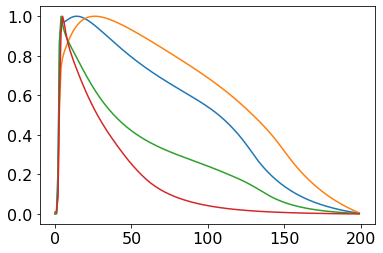

In [34]:
for cnt,y in enumerate(y_test):
    if (y == np.array([0,0,0,0,0,1,0])).all():
        print(y)
        plt.plot(Ca_d_new[cnt])
plt.show()

In [35]:
y_test == np.array([0,0,0,0,0,1,0])

array([[False,  True,  True, ...,  True, False,  True],
       [False,  True,  True, ...,  True, False,  True],
       [False,  True,  True, ...,  True, False,  True],
       ...,
       [False, False, False, ..., False,  True, False],
       [False, False, False, ..., False,  True, False],
       [False, False, False, ..., False,  True, False]])

In [36]:
lab, cnt = np.unique(y_test, axis=0, return_counts=True)

In [37]:
round(float(exp.local_pred),3)

0.997

Training exp.model
####################################
####################################
Looking at class Kr
####################################
####################################
[1 0 0 0 0 0 0]
Explainaing with model_Kr
Plotting explanation from model_Kr


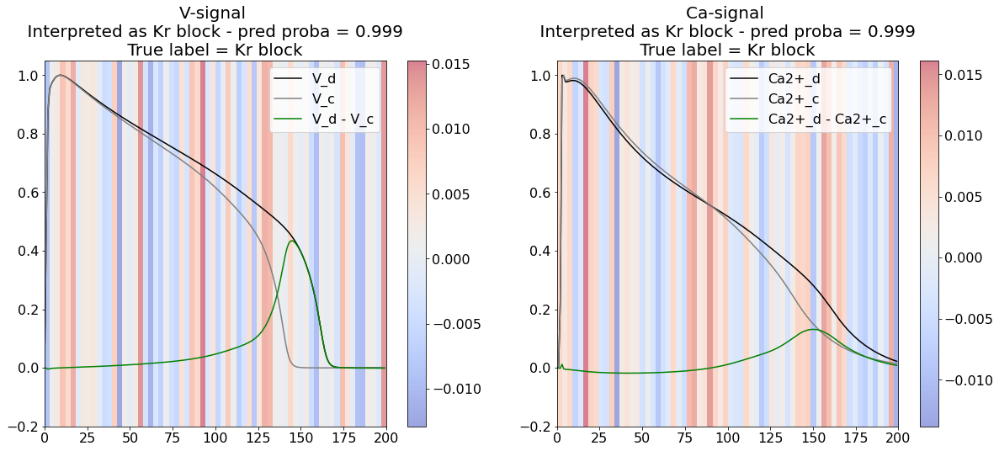

Explainaing with model_CaL
Plotting explanation from model_CaL


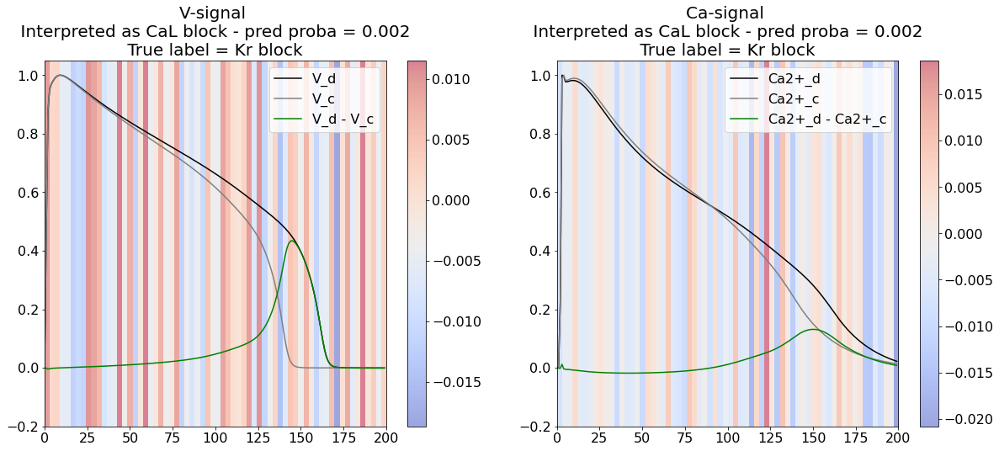

Explainaing with model_Na
Plotting explanation from model_Na


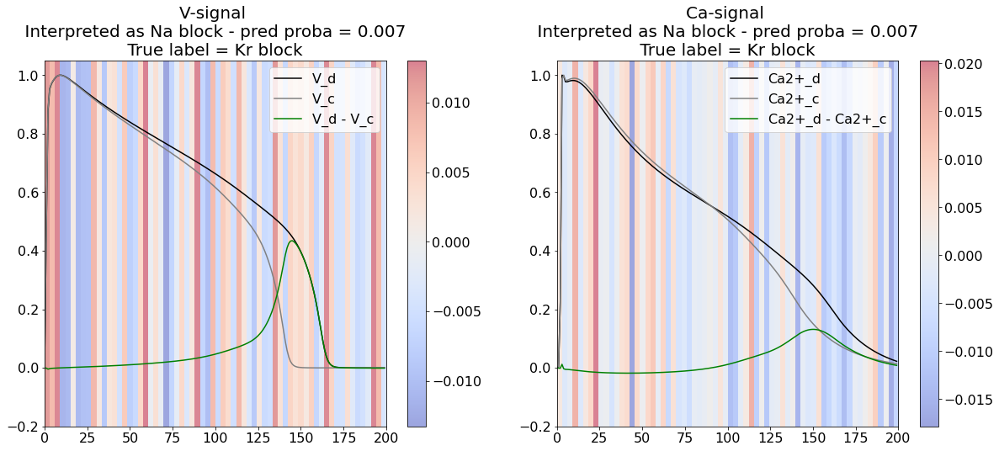

Explainaing with model_NaL
Plotting explanation from model_NaL


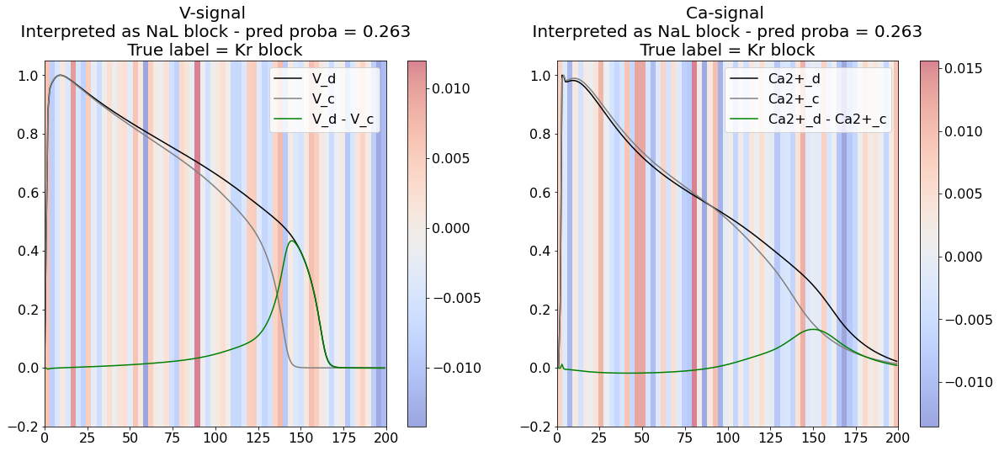

Explainaing with model_to
Plotting explanation from model_to


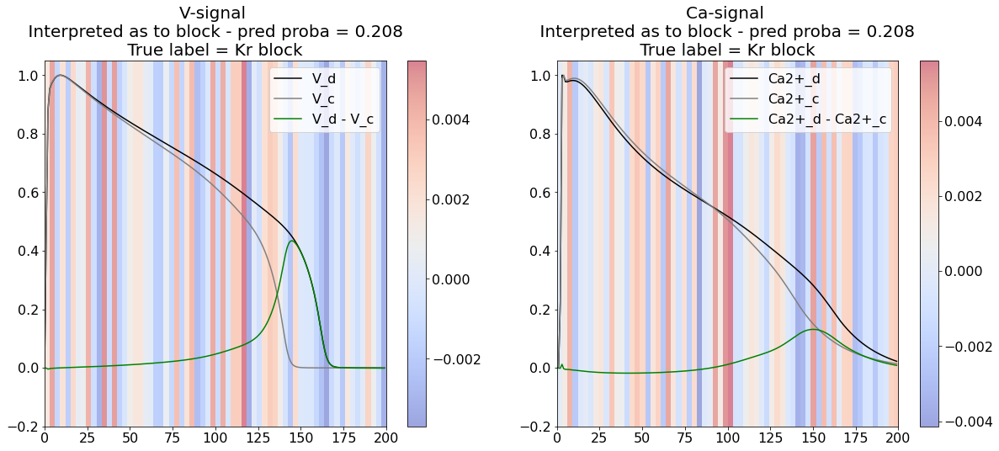

Explainaing with model_Ks
Plotting explanation from model_Ks


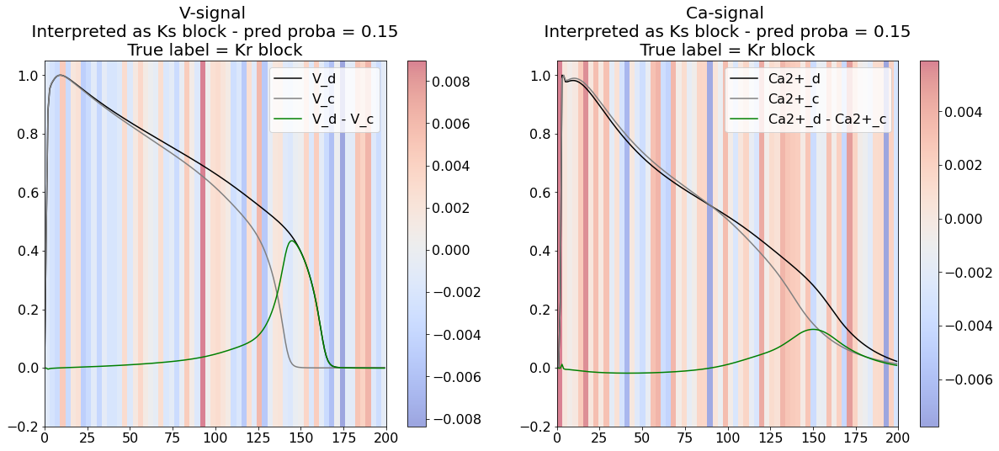

Explainaing with model_K1
Plotting explanation from model_K1


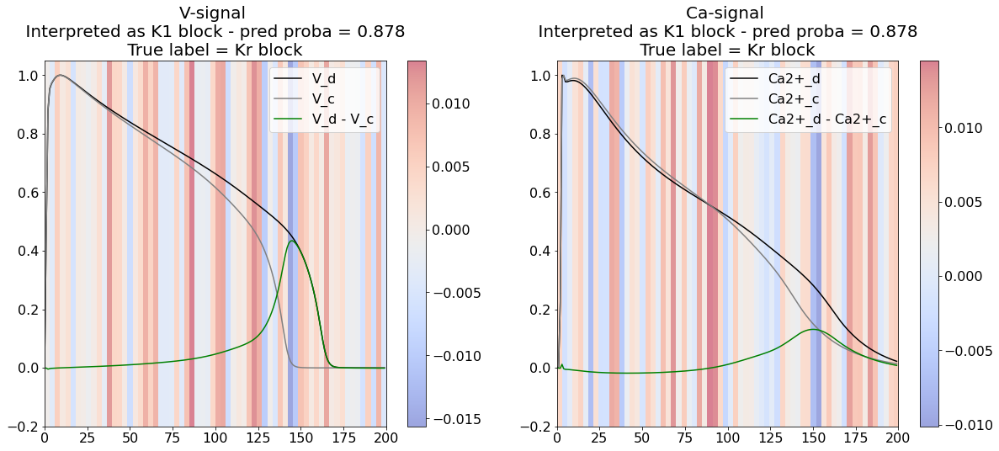

Explainaing with model_Kr
Plotting explanation from model_Kr


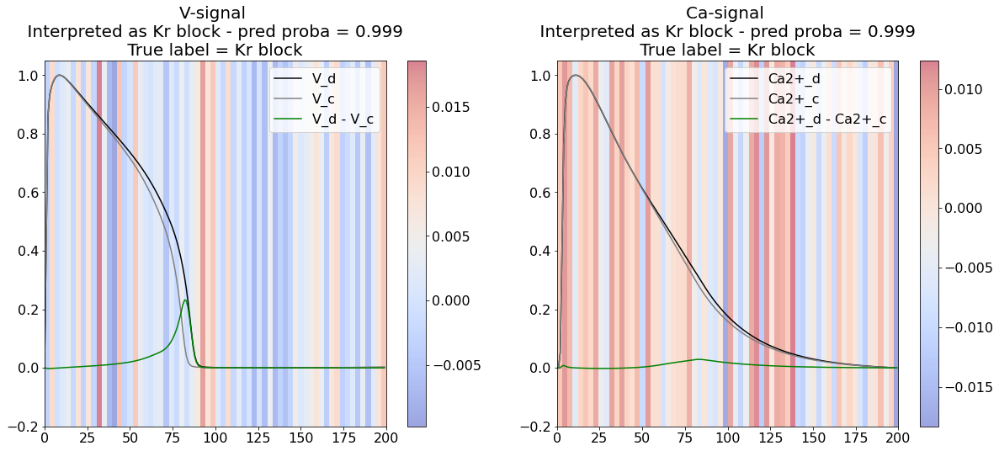

Explainaing with model_CaL
Plotting explanation from model_CaL


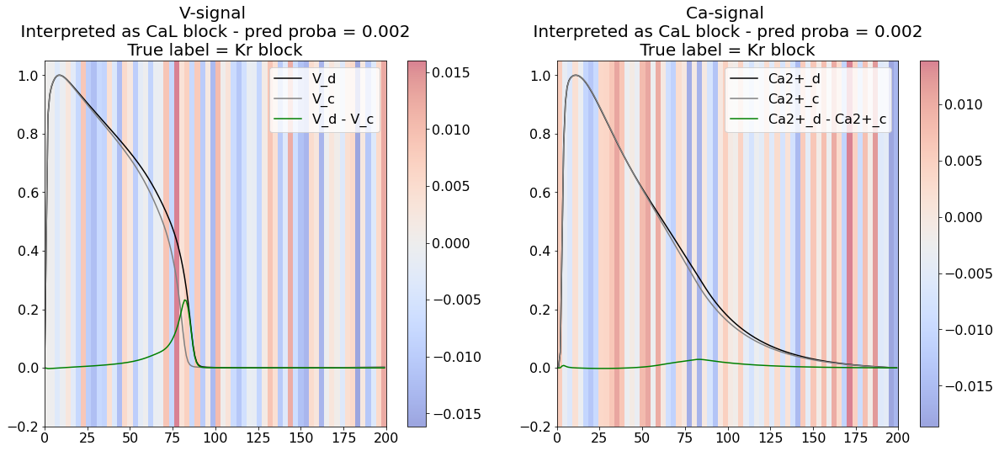

Explainaing with model_Na
Plotting explanation from model_Na


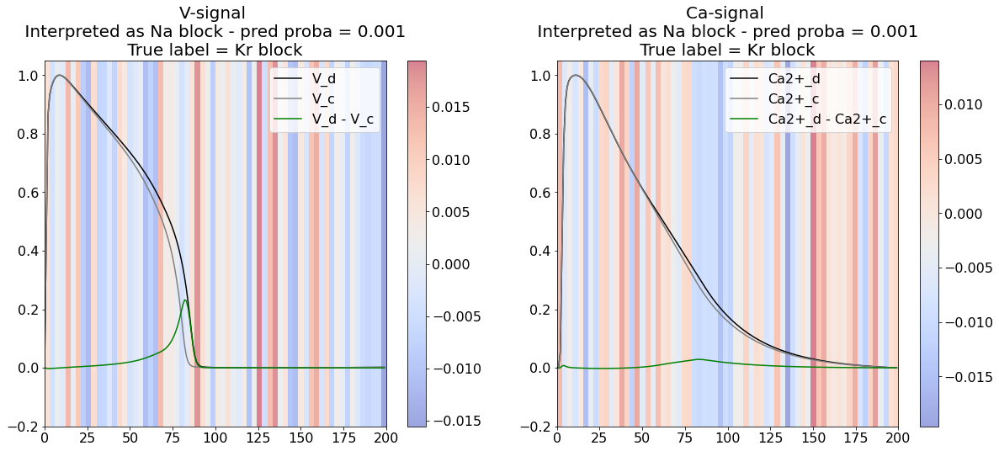

Explainaing with model_NaL
Plotting explanation from model_NaL


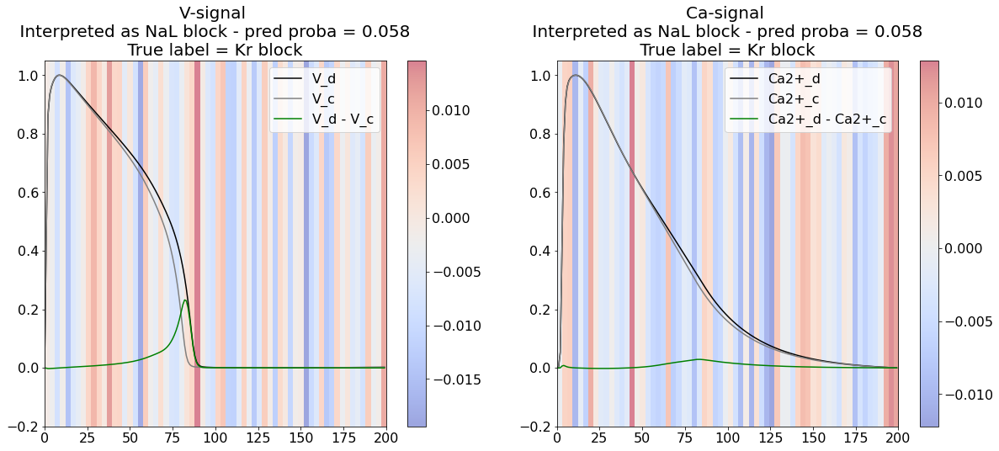

Explainaing with model_to
Plotting explanation from model_to


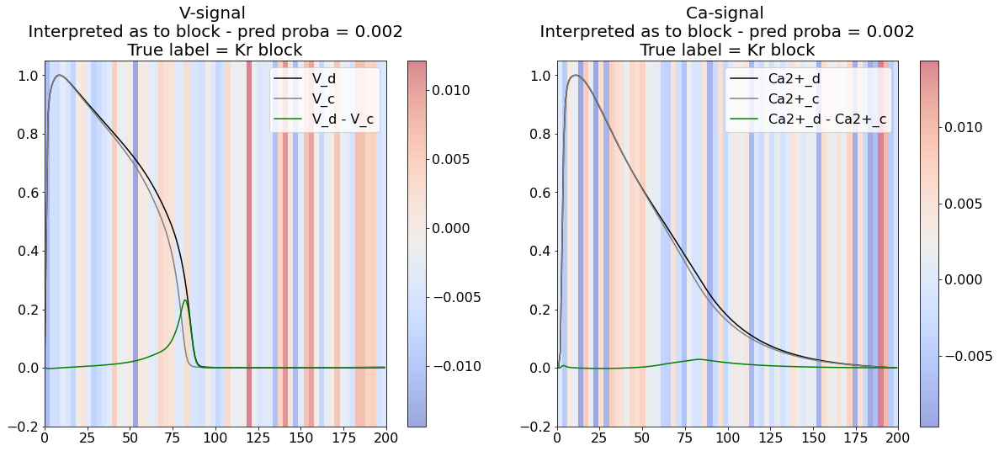

Explainaing with model_Ks
Plotting explanation from model_Ks


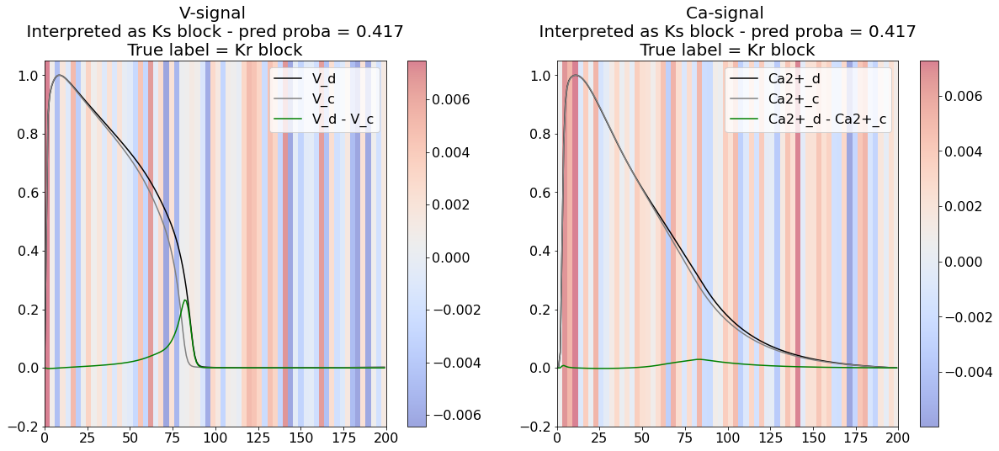

Explainaing with model_K1
Plotting explanation from model_K1


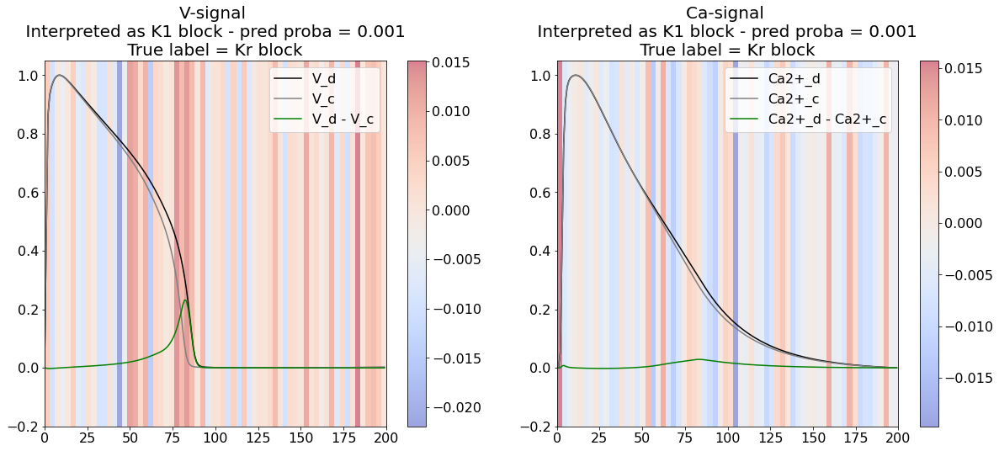

Explainaing with model_Kr
Plotting explanation from model_Kr


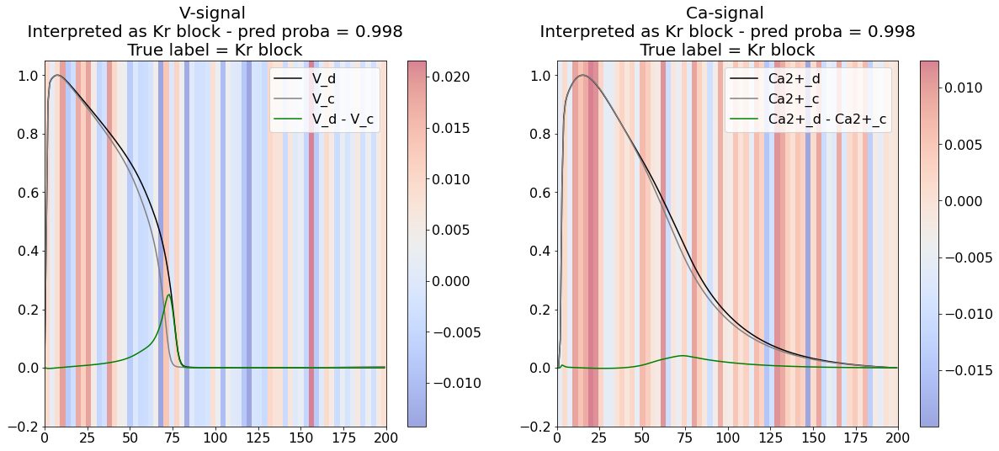

Explainaing with model_CaL
Plotting explanation from model_CaL


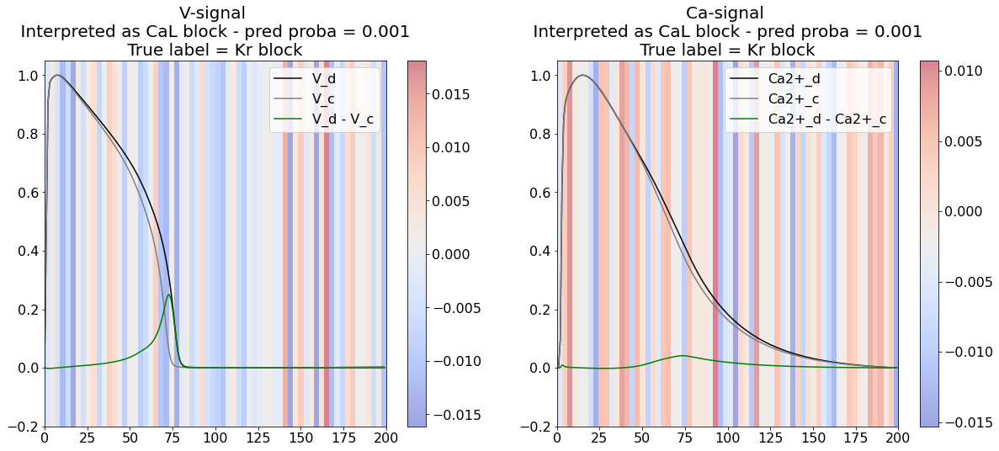

Explainaing with model_Na
Plotting explanation from model_Na


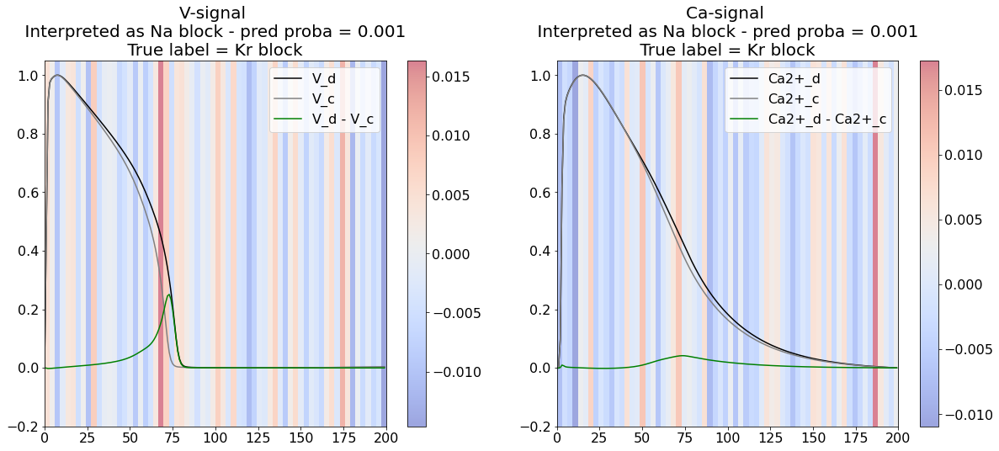

Explainaing with model_NaL
Plotting explanation from model_NaL


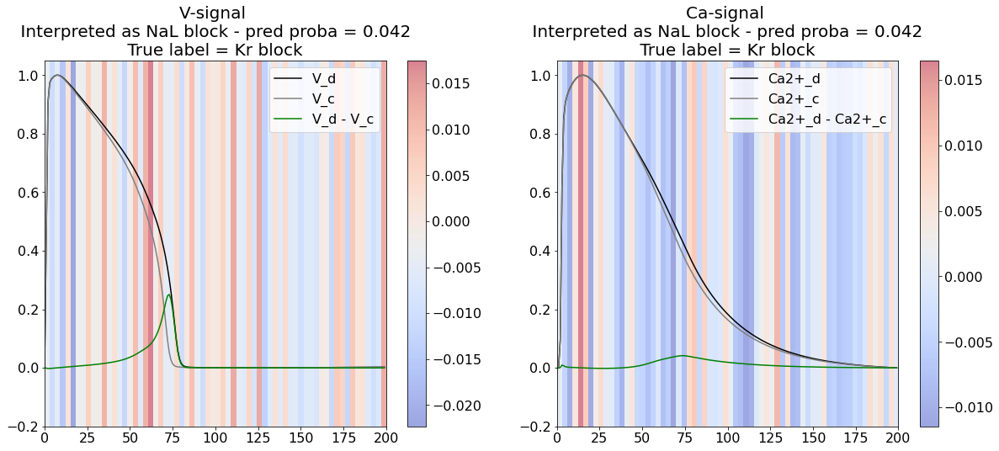

Explainaing with model_to
Plotting explanation from model_to


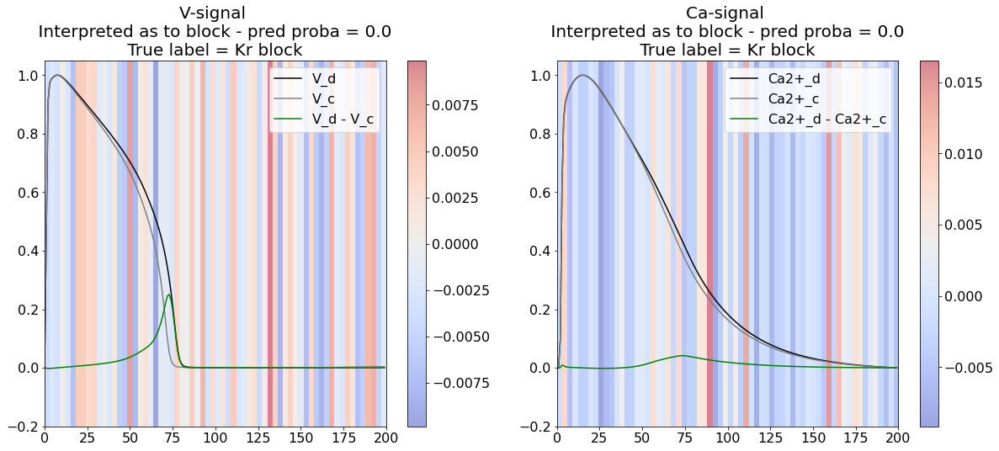

Explainaing with model_Ks
Plotting explanation from model_Ks


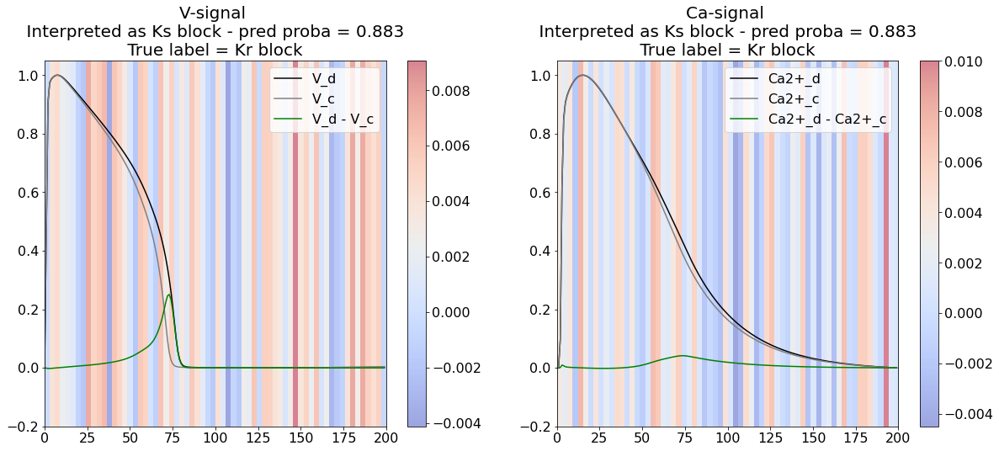

Explainaing with model_K1
Plotting explanation from model_K1


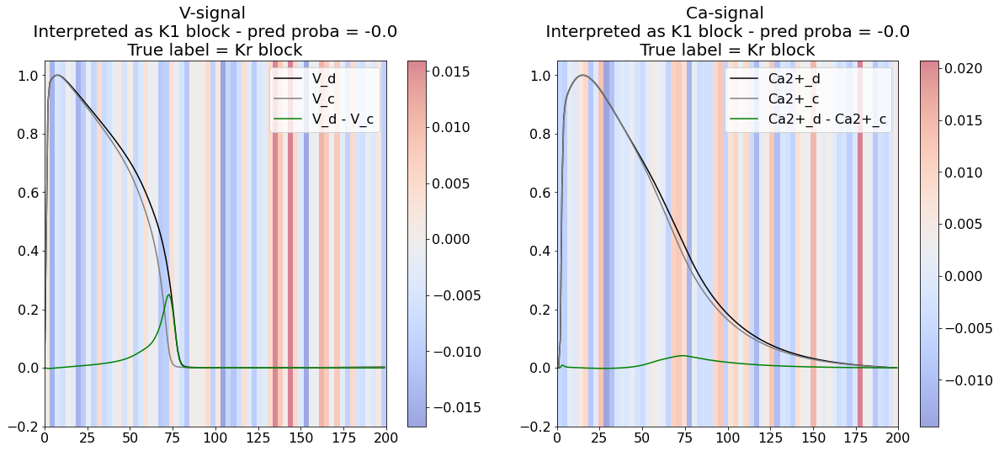

Explainaing with model_Kr
Plotting explanation from model_Kr


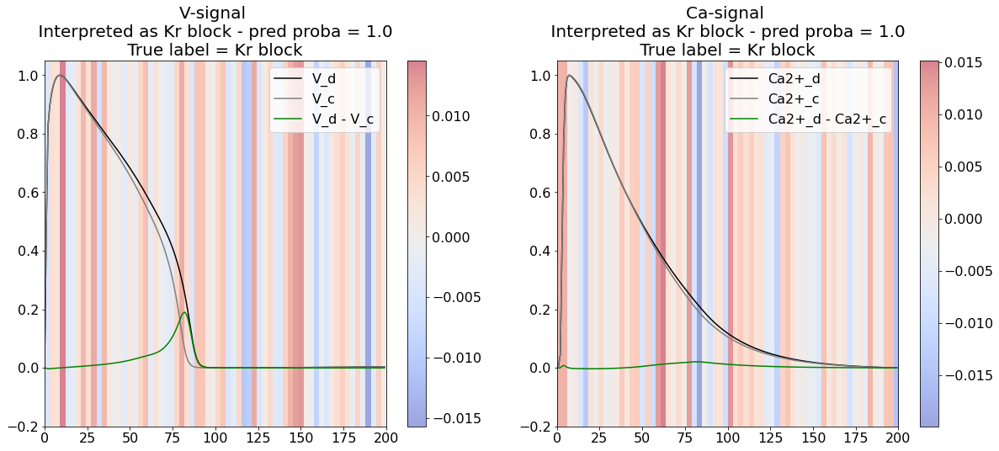

Explainaing with model_CaL
Plotting explanation from model_CaL


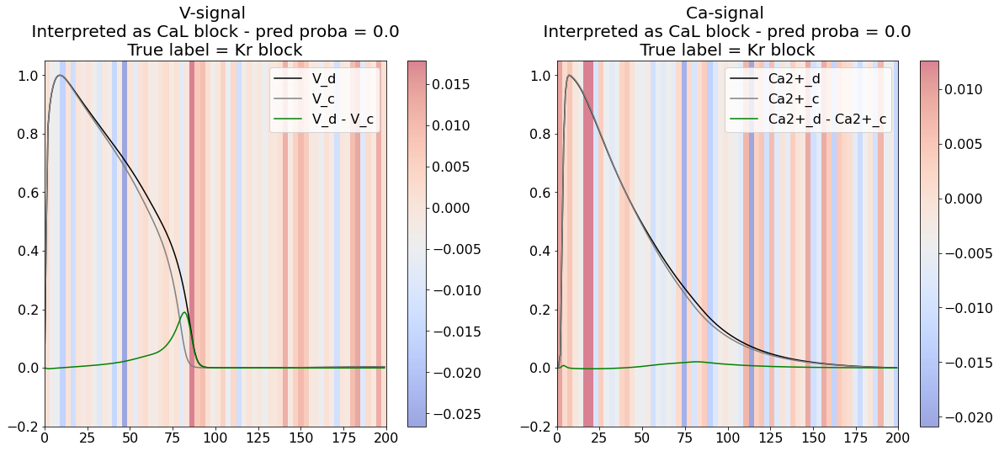

Explainaing with model_Na
Plotting explanation from model_Na


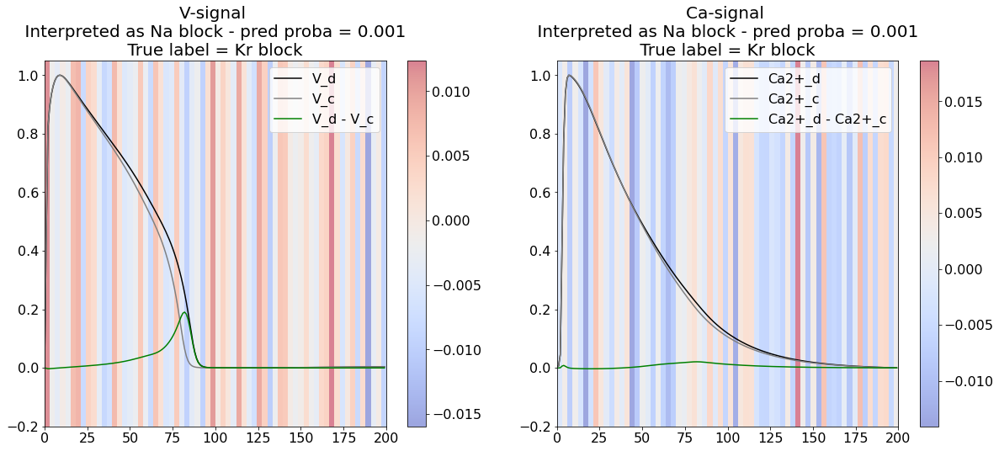

Explainaing with model_NaL
Plotting explanation from model_NaL


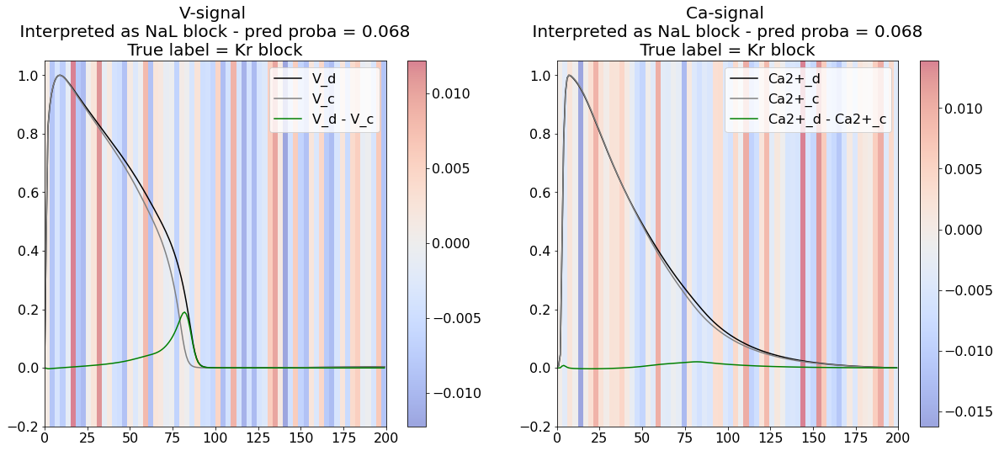

Explainaing with model_to
Plotting explanation from model_to


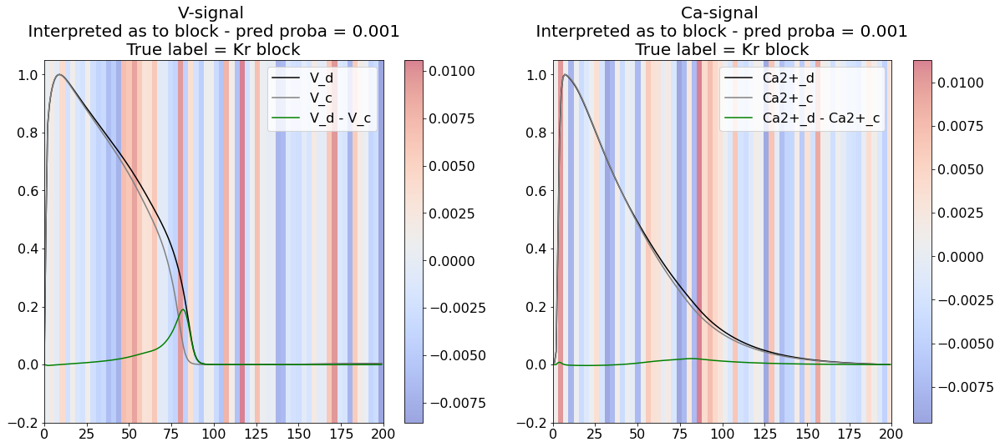

Explainaing with model_Ks
Plotting explanation from model_Ks


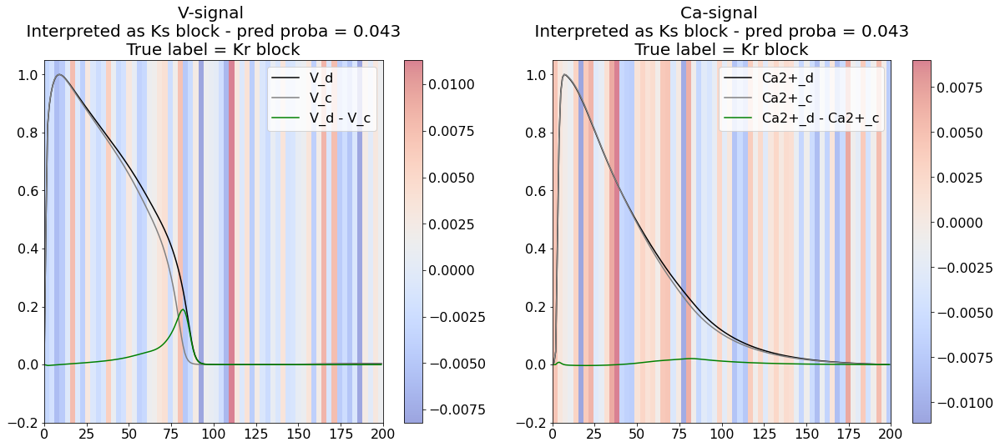

Explainaing with model_K1
Plotting explanation from model_K1


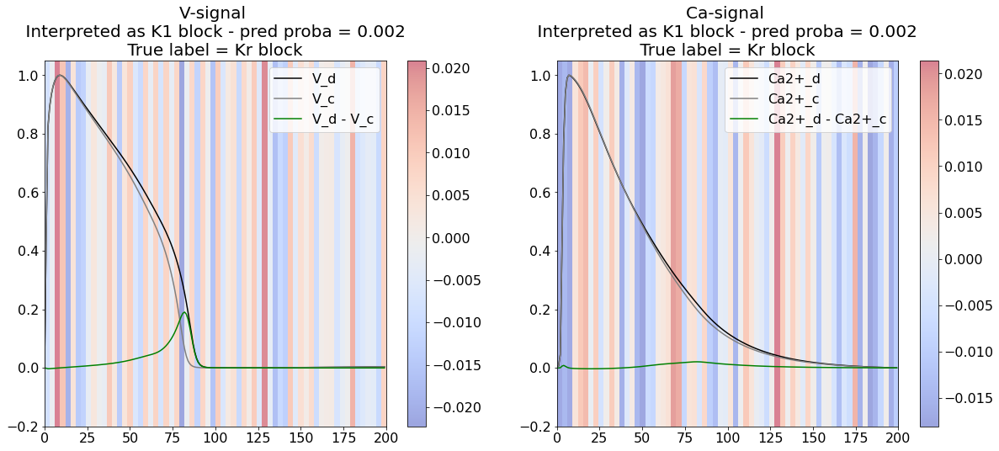

####################################
####################################
Looking at class CaL
####################################
####################################
[0 1 0 0 0 0 0]
Explainaing with model_Kr
Plotting explanation from model_Kr


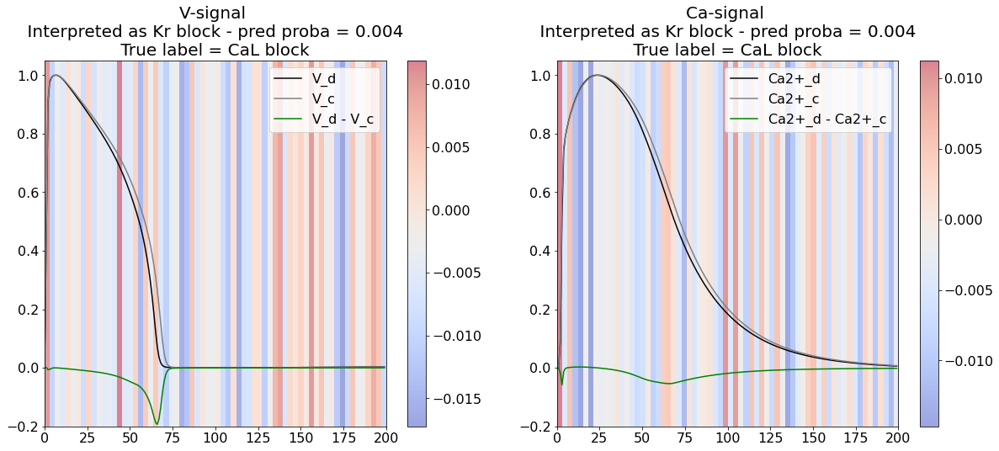

Explainaing with model_CaL
Plotting explanation from model_CaL


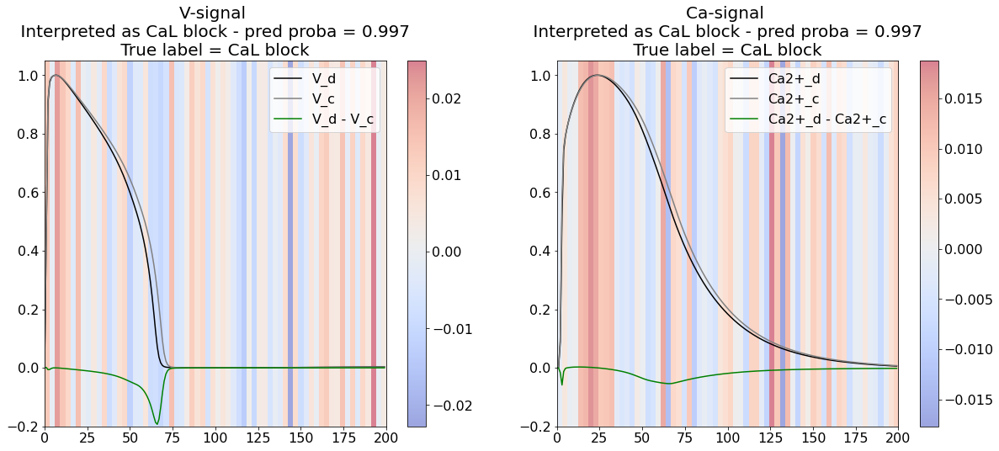

Explainaing with model_Na
Plotting explanation from model_Na


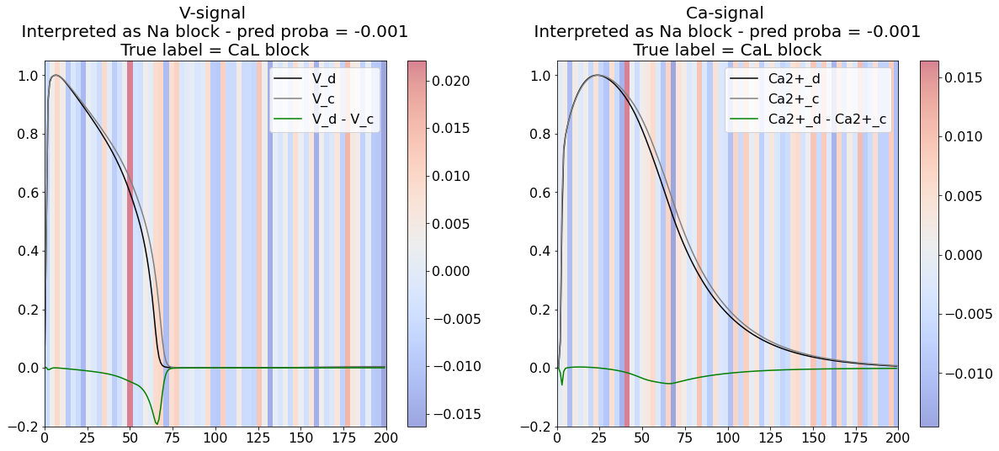

Explainaing with model_NaL
Plotting explanation from model_NaL


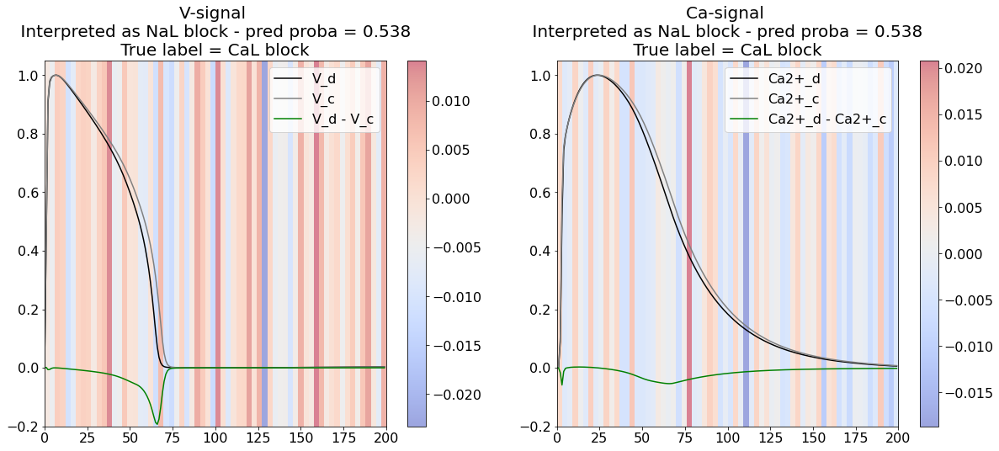

Explainaing with model_to
Plotting explanation from model_to


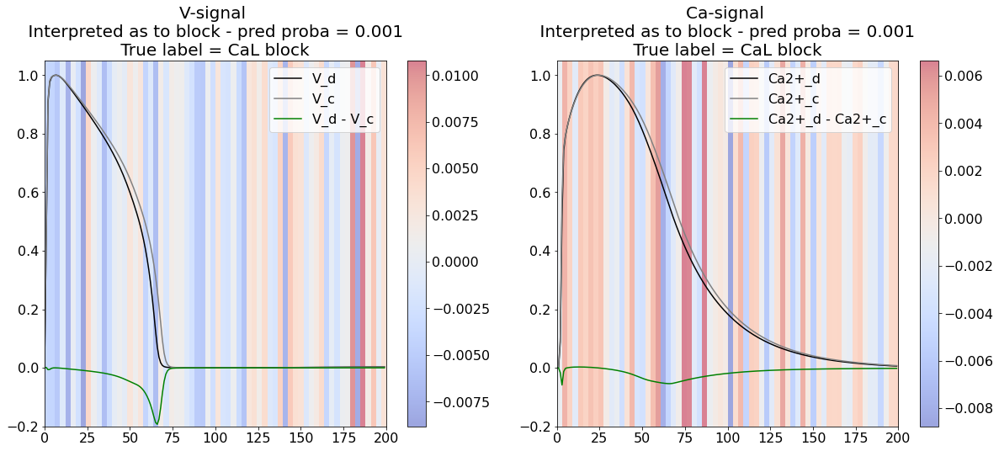

Explainaing with model_Ks
Plotting explanation from model_Ks


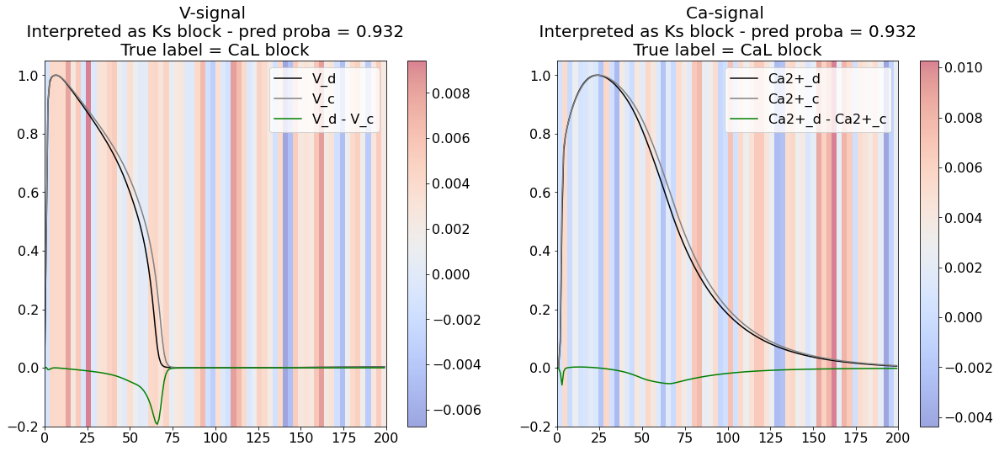

Explainaing with model_K1
Plotting explanation from model_K1


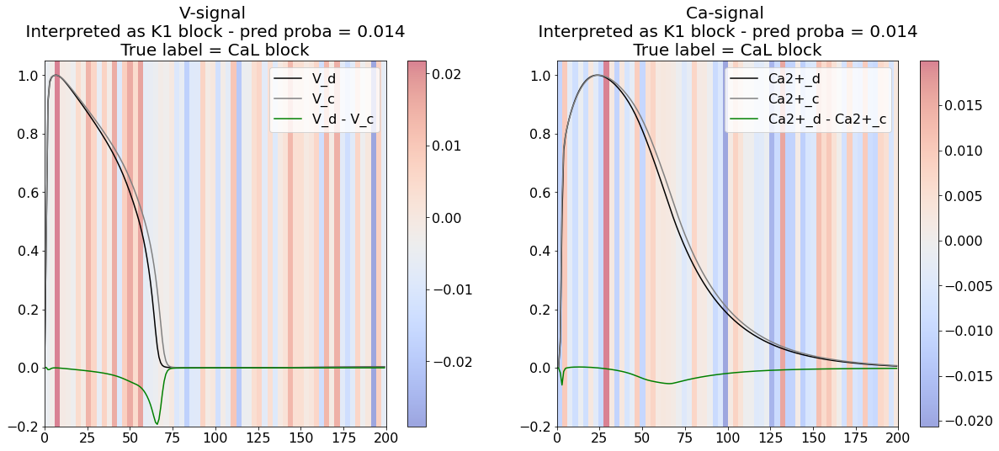

Explainaing with model_Kr
Plotting explanation from model_Kr


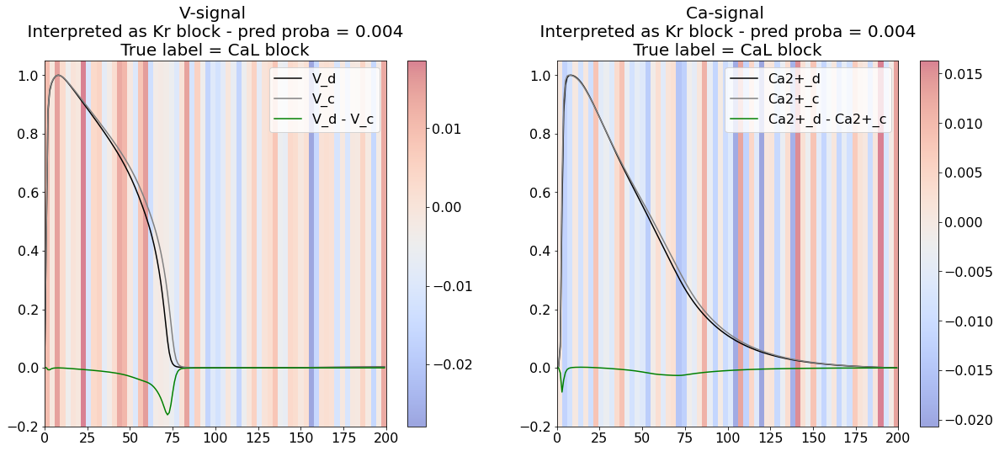

Explainaing with model_CaL
Plotting explanation from model_CaL


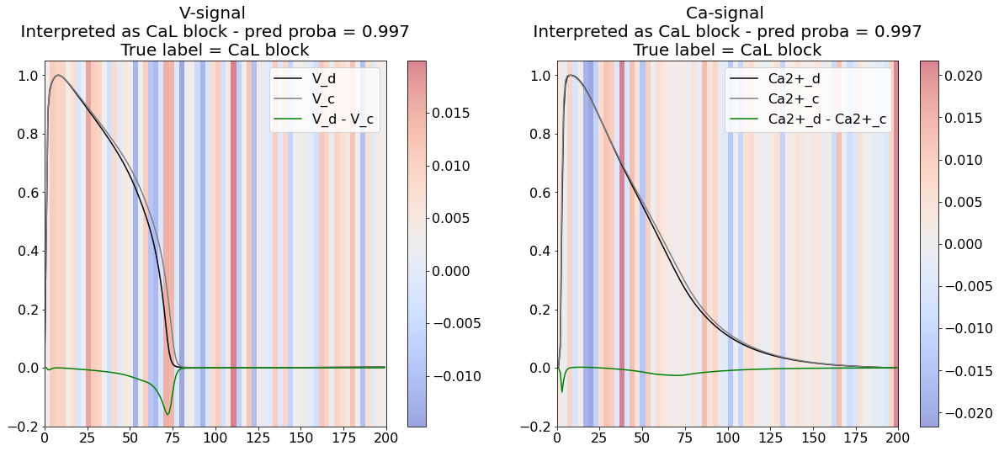

Explainaing with model_Na
Plotting explanation from model_Na


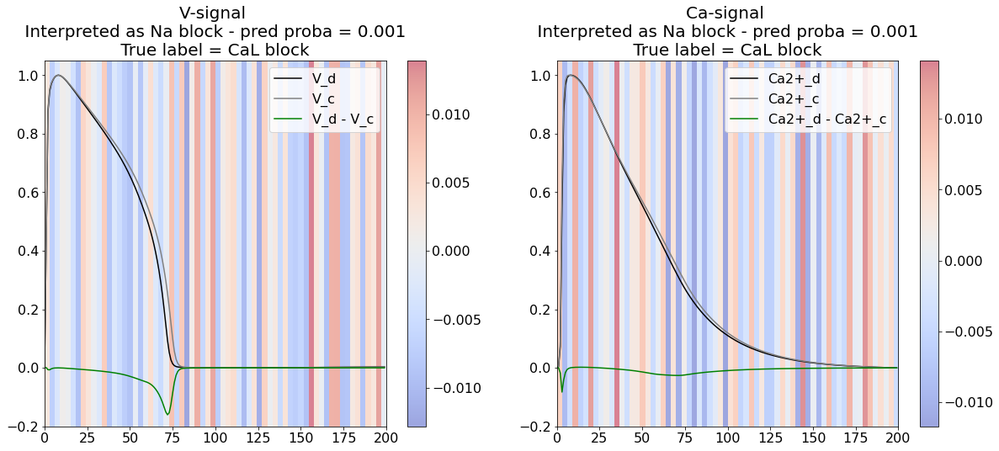

Explainaing with model_NaL
Plotting explanation from model_NaL


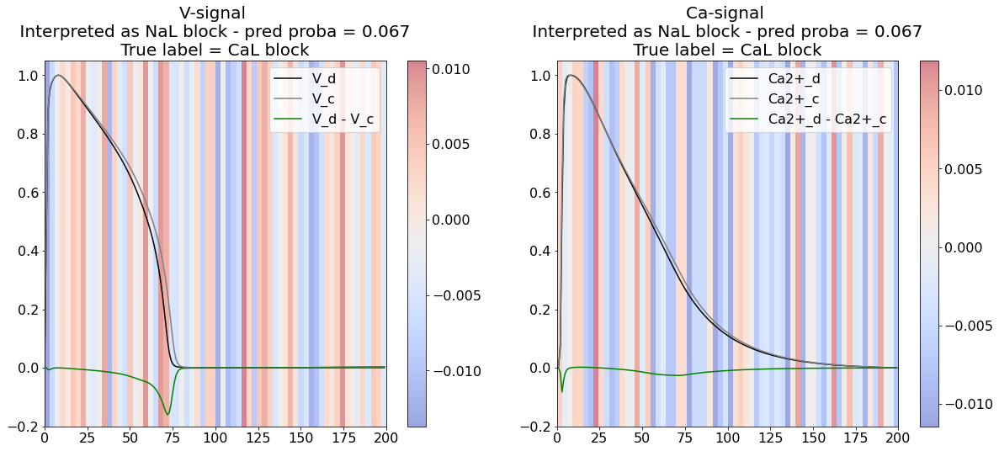

Explainaing with model_to
Plotting explanation from model_to


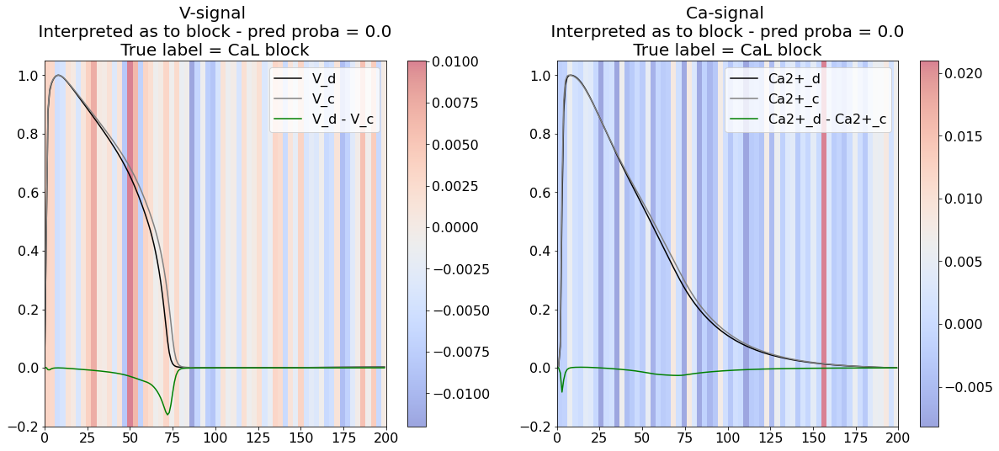

Explainaing with model_Ks
Plotting explanation from model_Ks


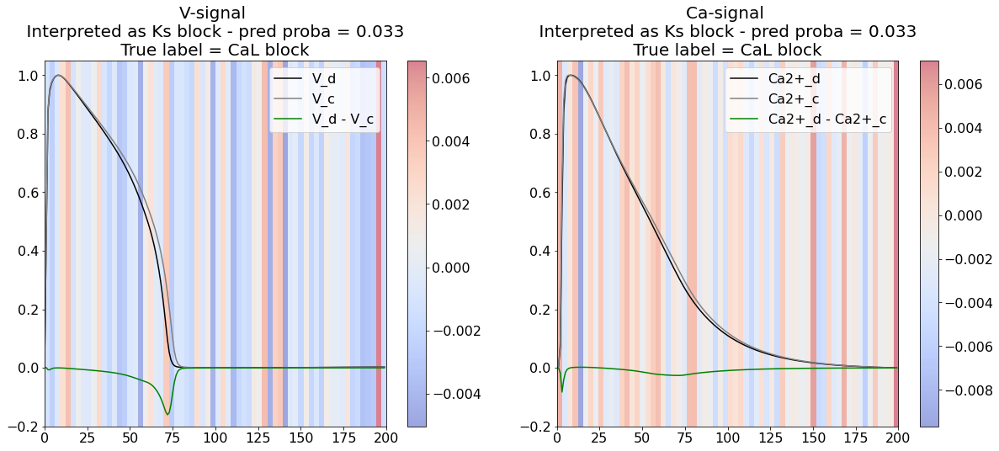

Explainaing with model_K1
Plotting explanation from model_K1


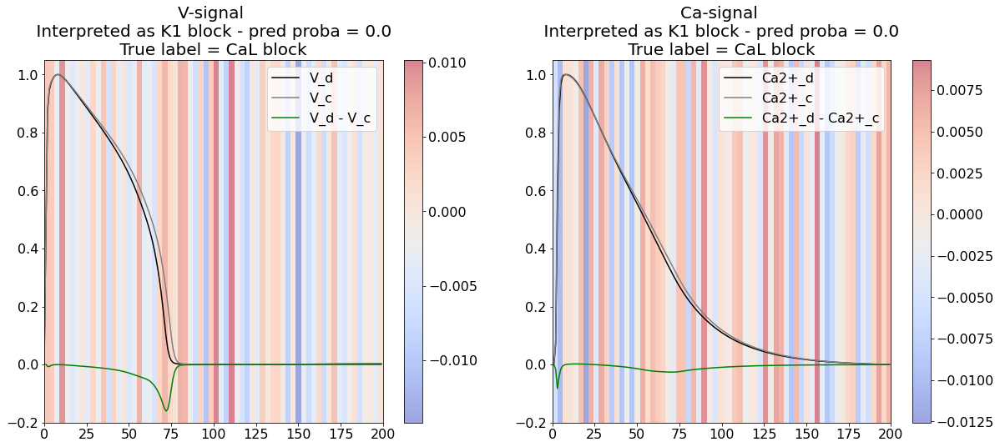

Explainaing with model_Kr
Plotting explanation from model_Kr


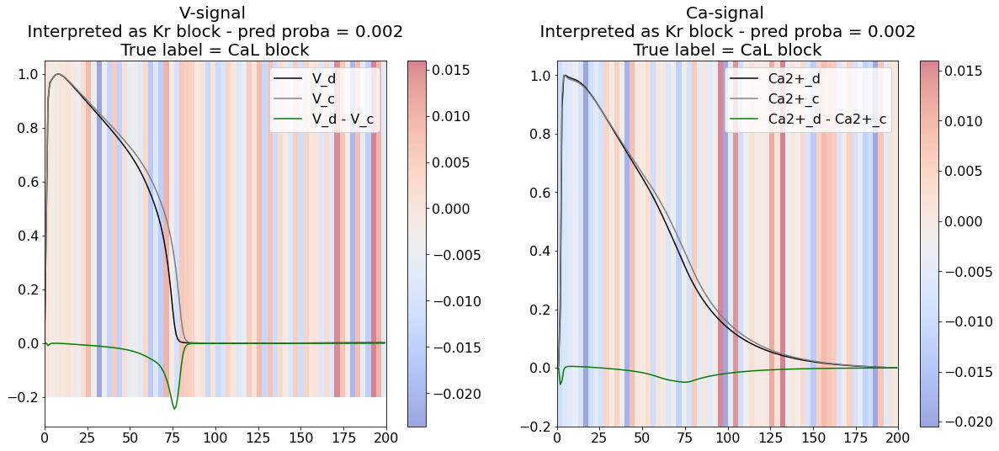

Explainaing with model_CaL
Plotting explanation from model_CaL


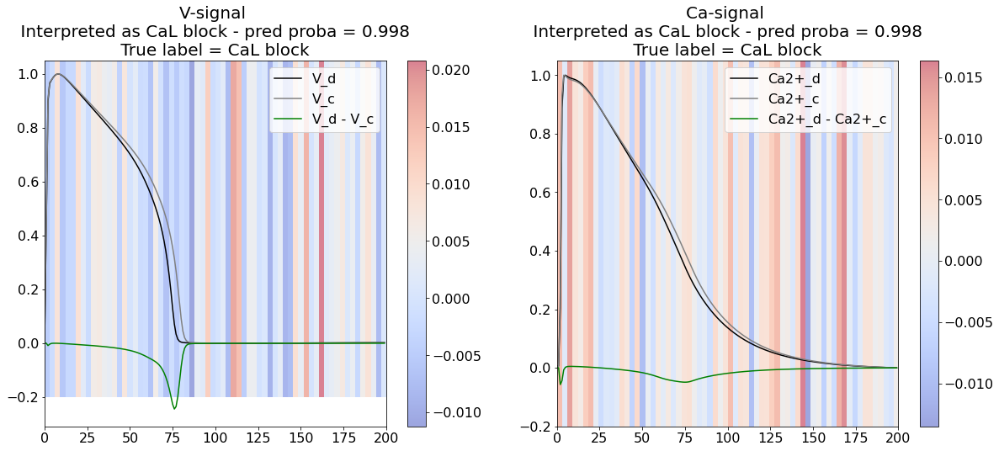

Explainaing with model_Na
Plotting explanation from model_Na


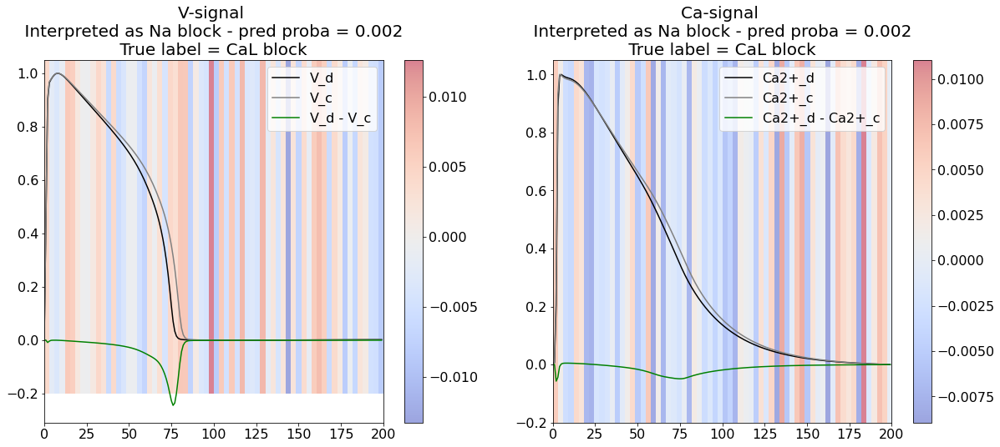

Explainaing with model_NaL
Plotting explanation from model_NaL


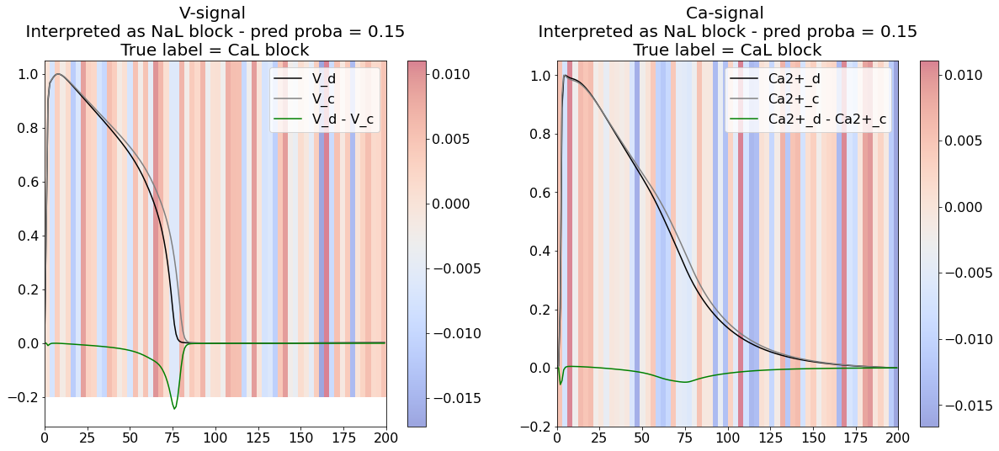

Explainaing with model_to
Plotting explanation from model_to


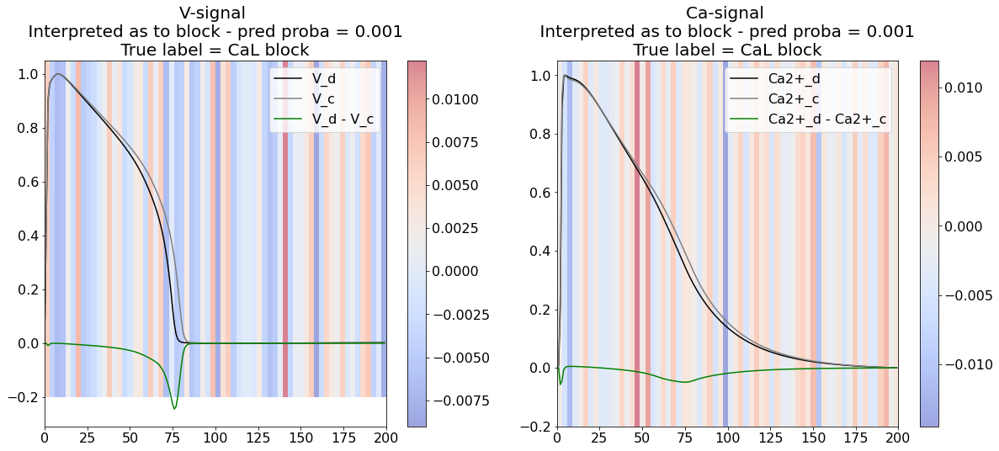

Explainaing with model_Ks
Plotting explanation from model_Ks


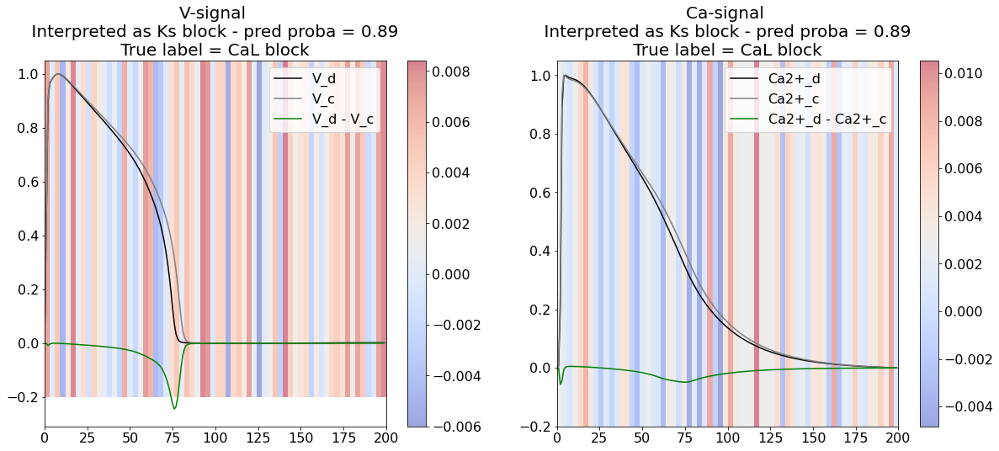

Explainaing with model_K1
Plotting explanation from model_K1


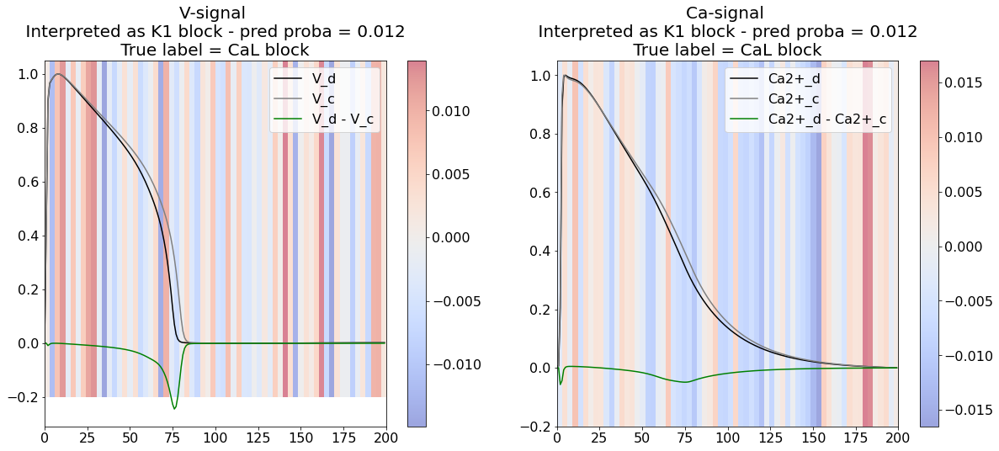

Explainaing with model_Kr
Plotting explanation from model_Kr


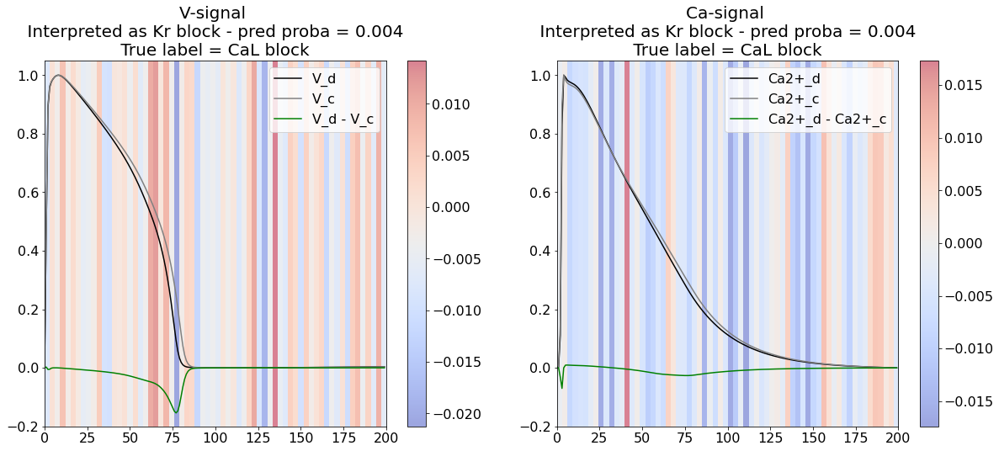

Explainaing with model_CaL
Plotting explanation from model_CaL


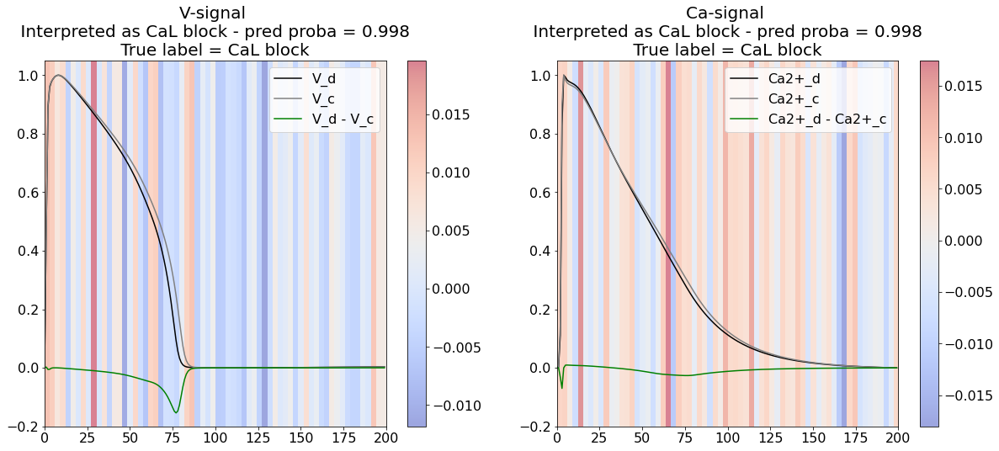

Explainaing with model_Na
Plotting explanation from model_Na


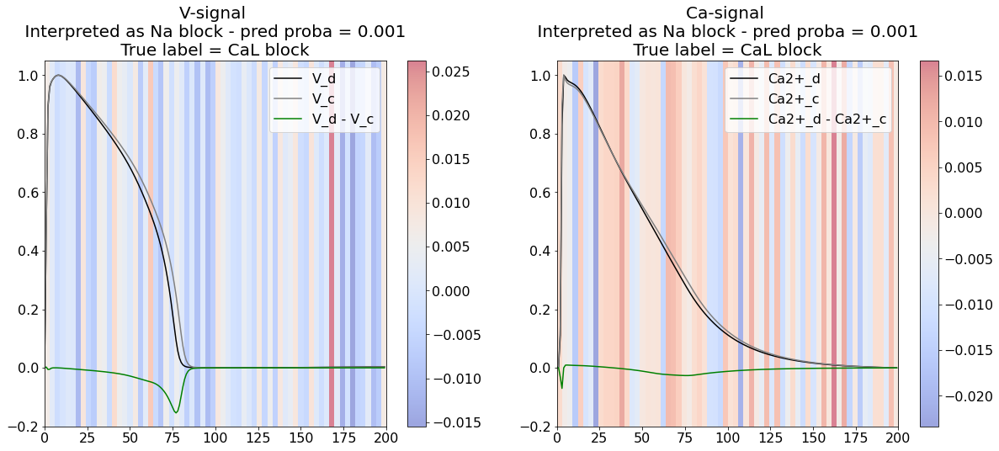

Explainaing with model_NaL
Plotting explanation from model_NaL


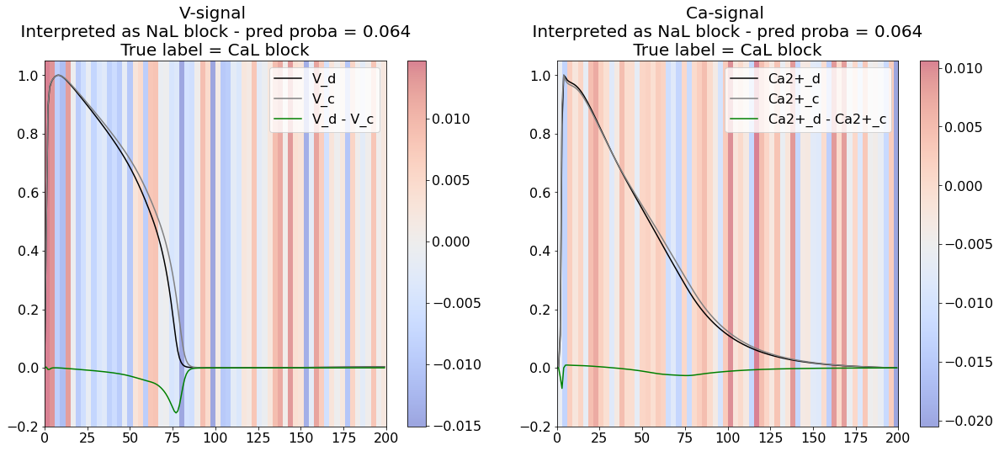

Explainaing with model_to
Plotting explanation from model_to


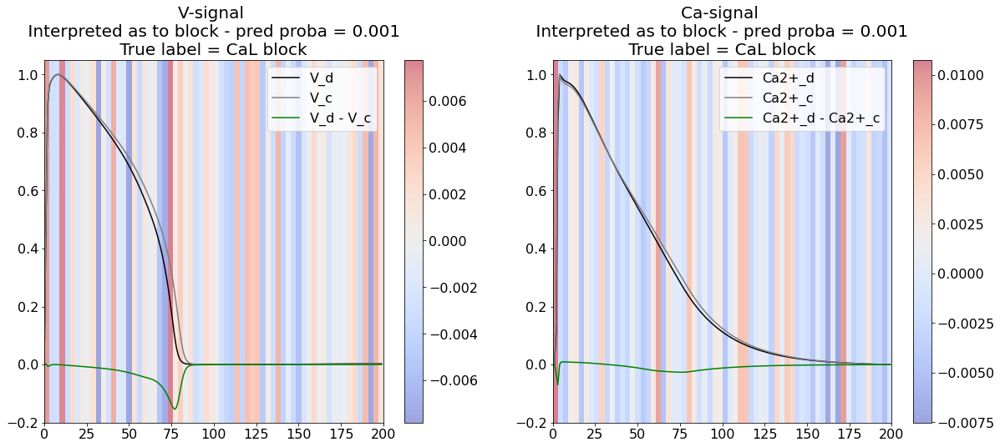

Explainaing with model_Ks
Plotting explanation from model_Ks


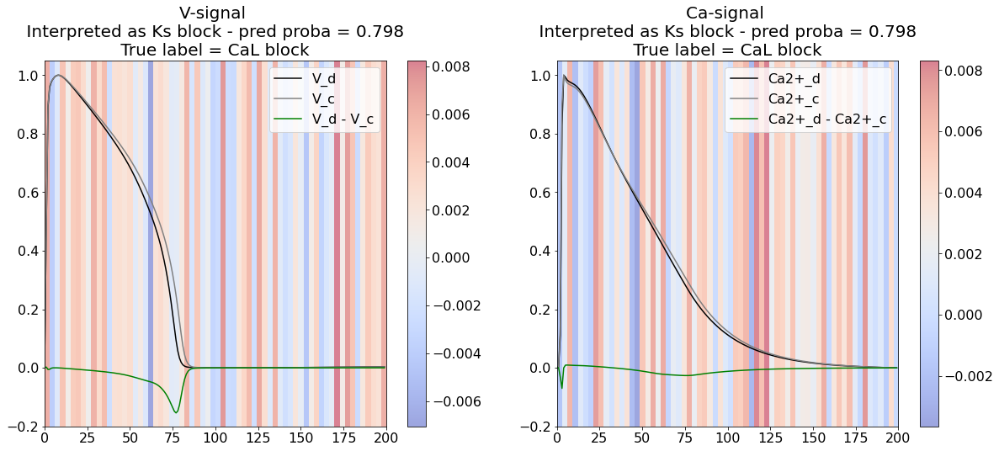

Explainaing with model_K1
Plotting explanation from model_K1


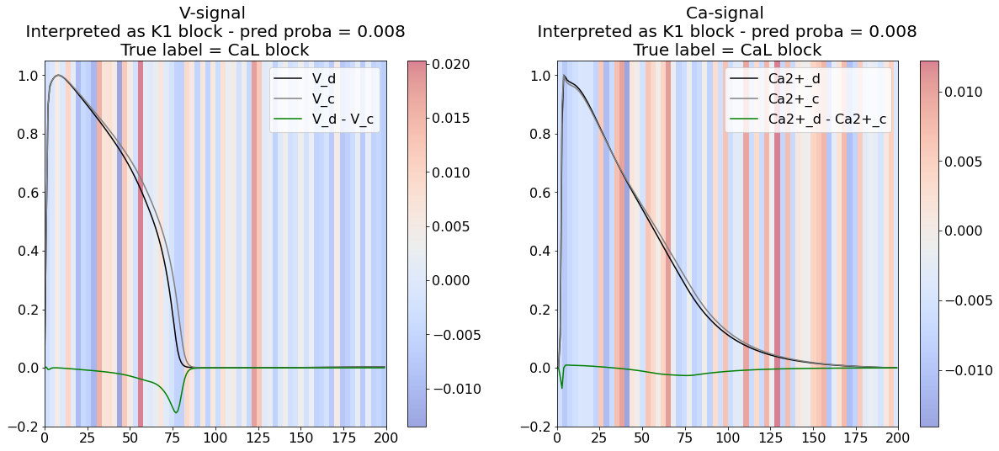

####################################
####################################
Looking at class Na
####################################
####################################
[0 0 1 0 0 0 0]
Explainaing with model_Kr
Plotting explanation from model_Kr


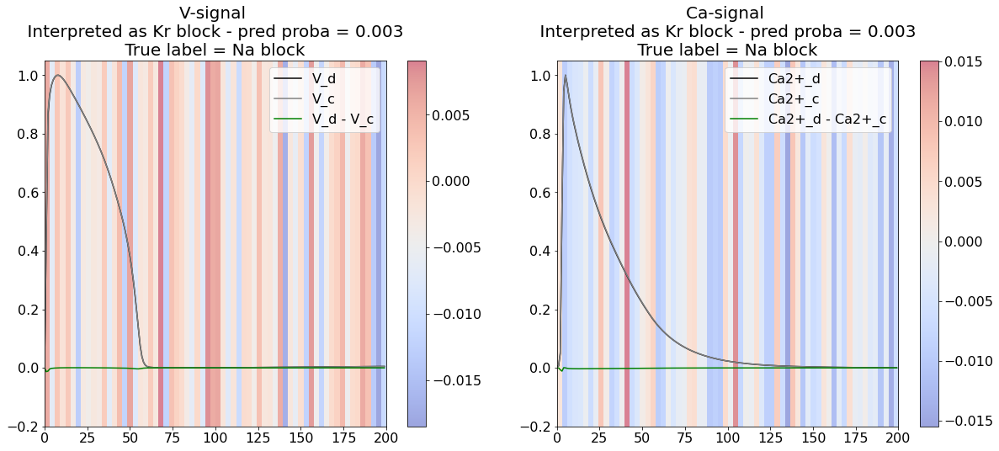

Explainaing with model_CaL
Plotting explanation from model_CaL


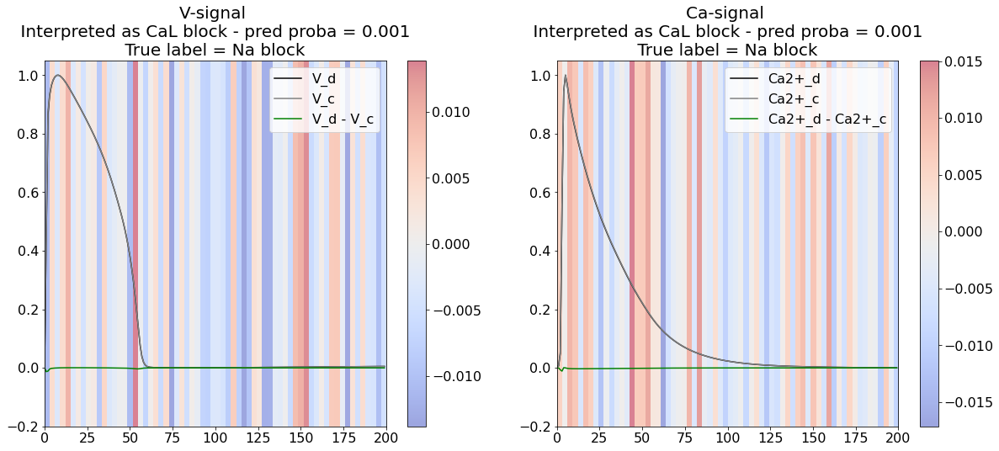

Explainaing with model_Na
Plotting explanation from model_Na


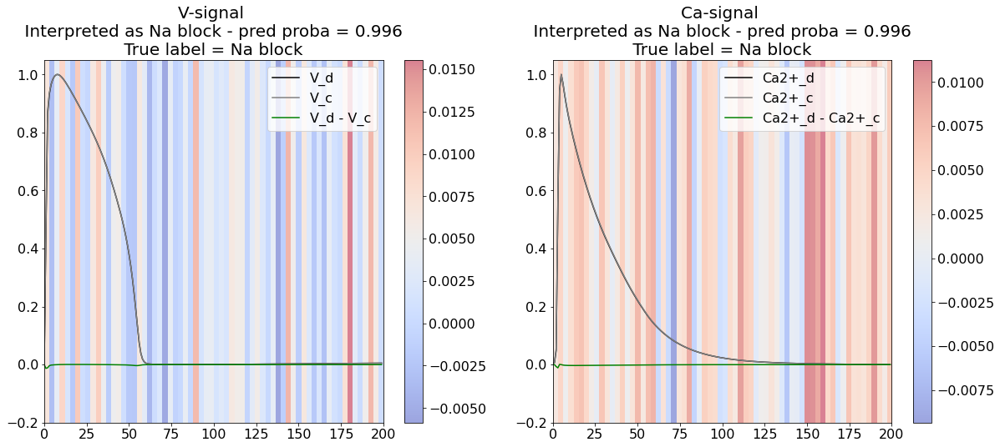

Explainaing with model_NaL
Plotting explanation from model_NaL


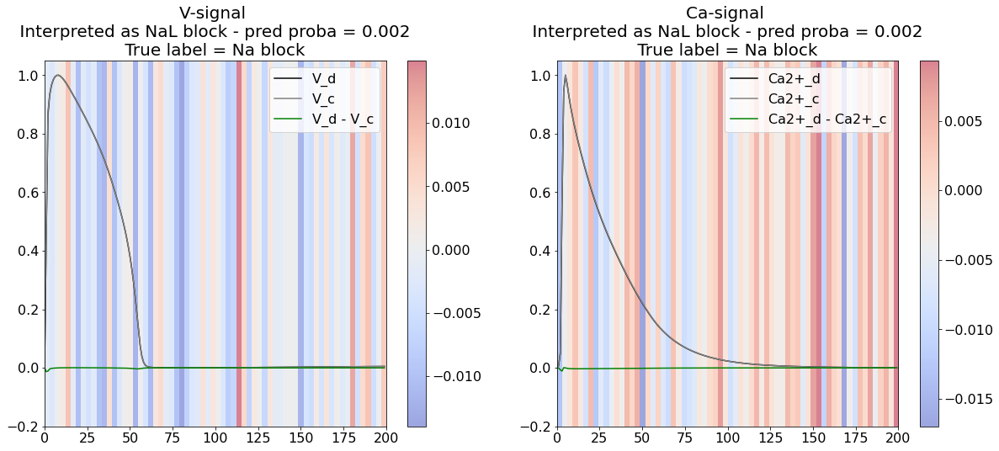

Explainaing with model_to
Plotting explanation from model_to


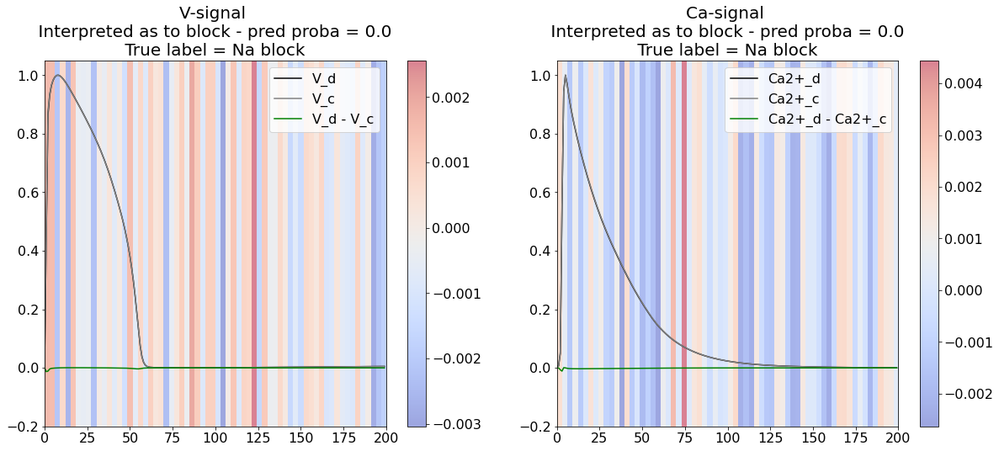

Explainaing with model_Ks
Plotting explanation from model_Ks


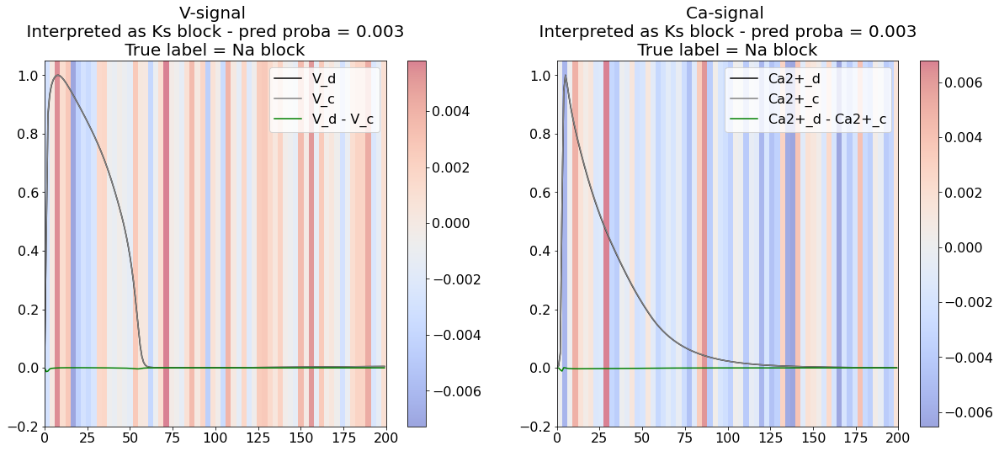

Explainaing with model_K1
Plotting explanation from model_K1


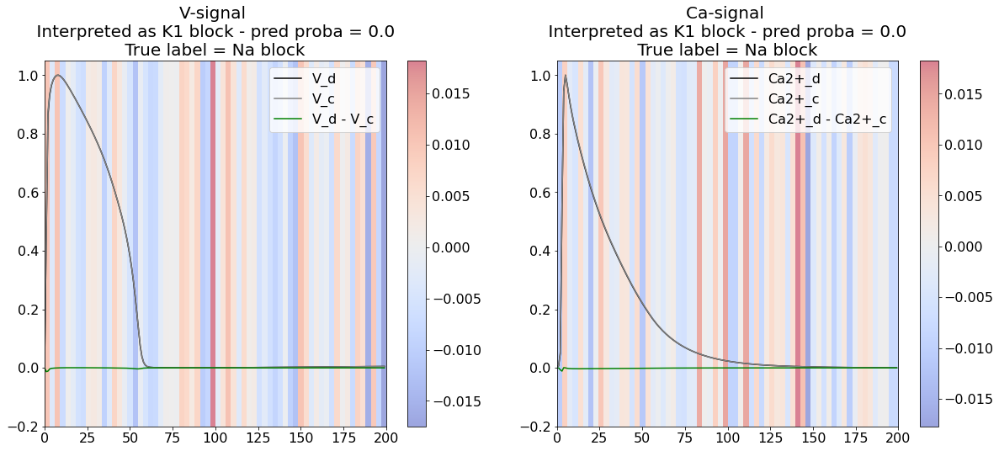

Explainaing with model_Kr
Plotting explanation from model_Kr


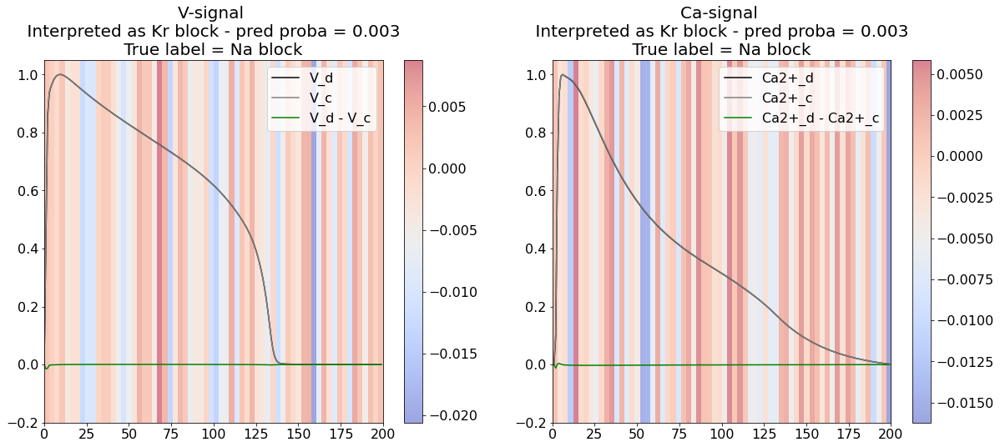

Explainaing with model_CaL
Plotting explanation from model_CaL


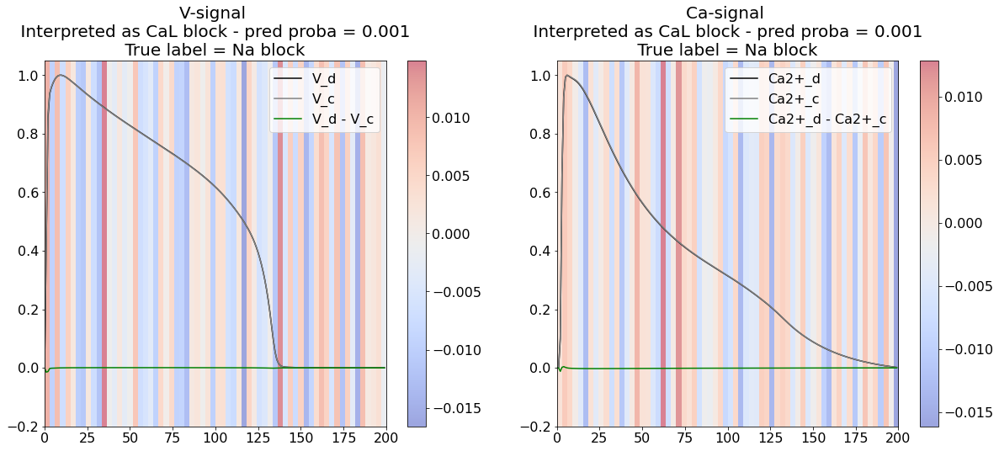

Explainaing with model_Na
Plotting explanation from model_Na


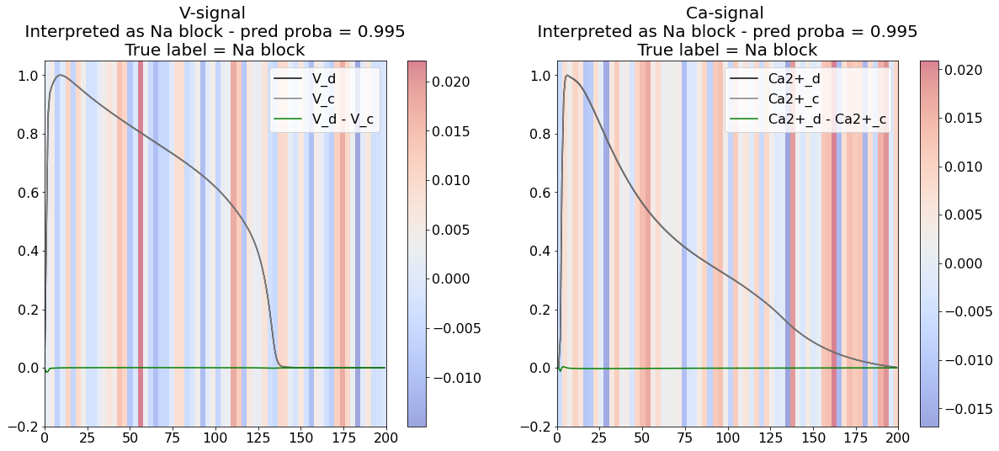

Explainaing with model_NaL
Plotting explanation from model_NaL


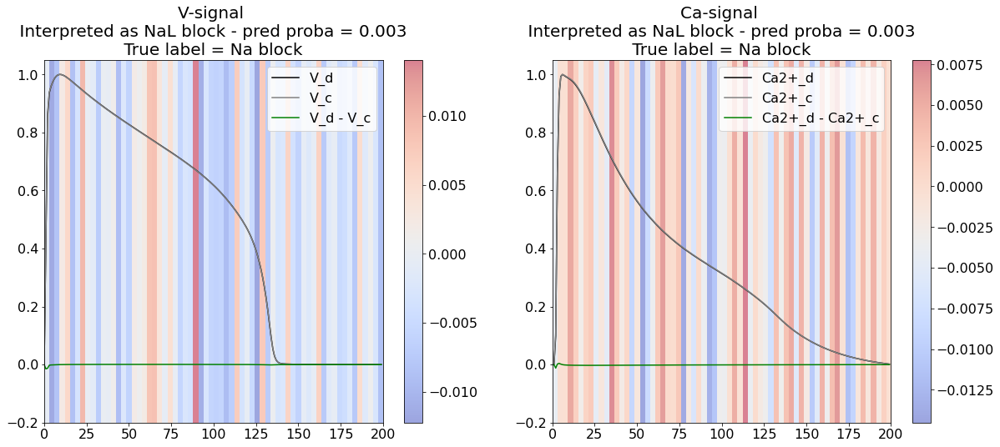

Explainaing with model_to
Plotting explanation from model_to


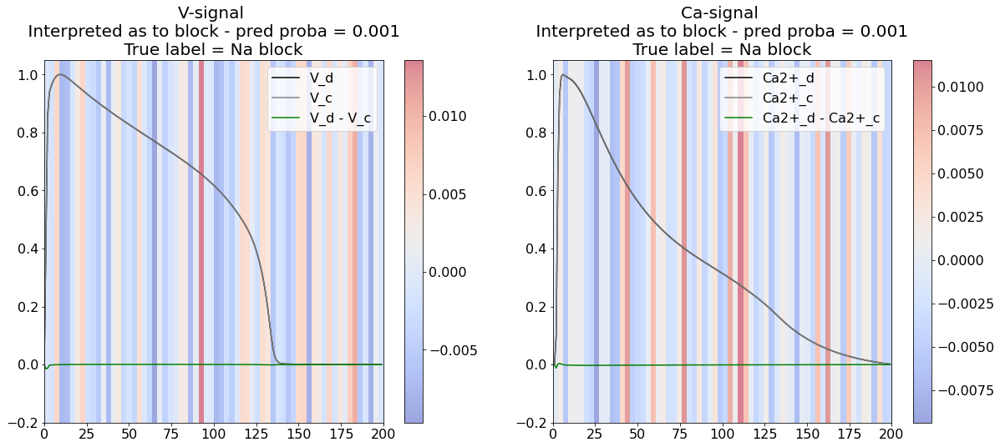

Explainaing with model_Ks
Plotting explanation from model_Ks


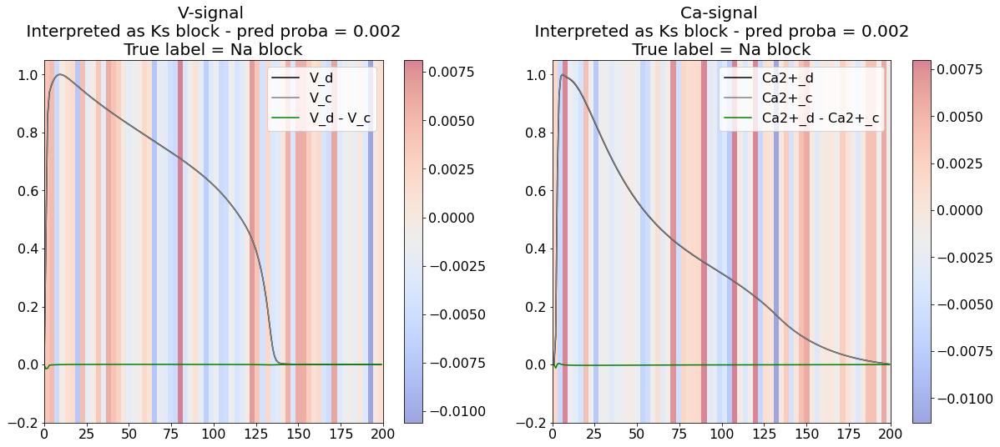

Explainaing with model_K1
Plotting explanation from model_K1


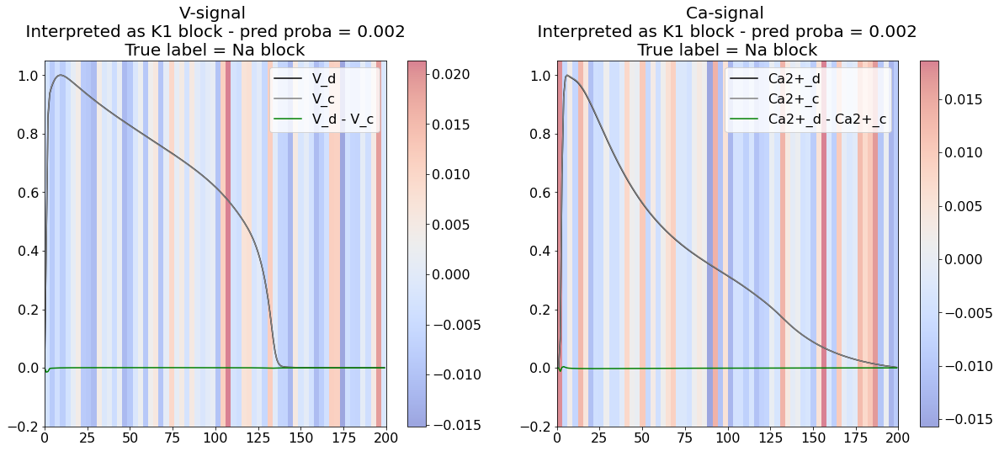

Explainaing with model_Kr
Plotting explanation from model_Kr


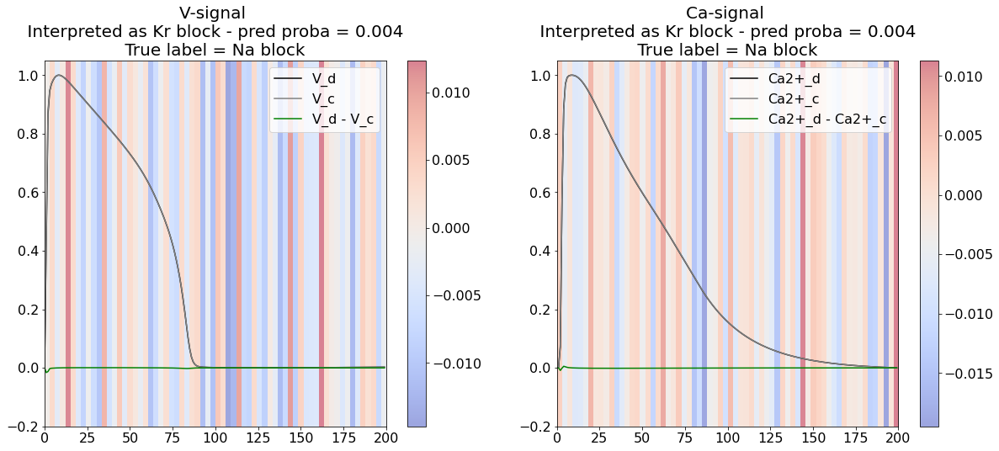

Explainaing with model_CaL
Plotting explanation from model_CaL


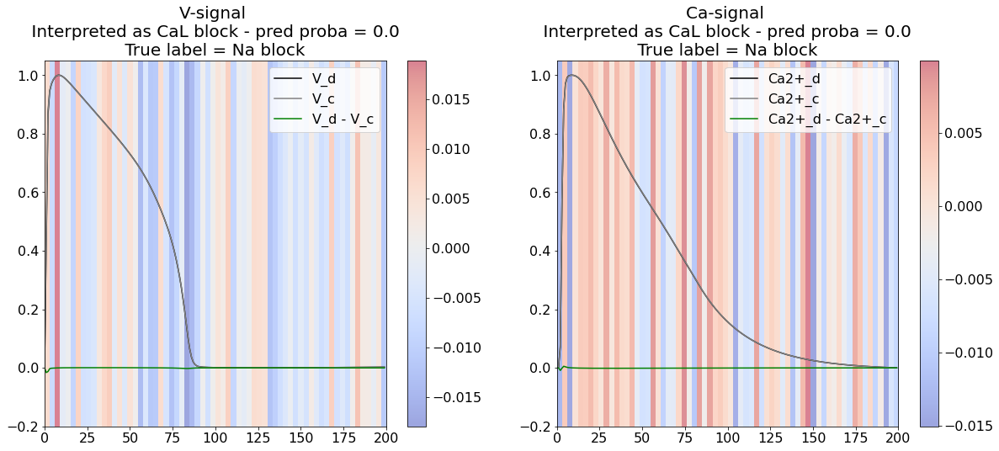

Explainaing with model_Na
Plotting explanation from model_Na


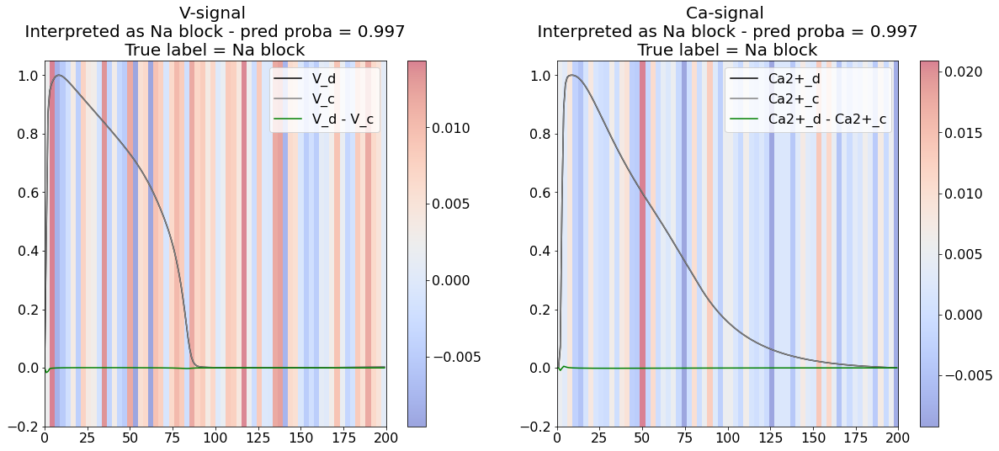

Explainaing with model_NaL
Plotting explanation from model_NaL


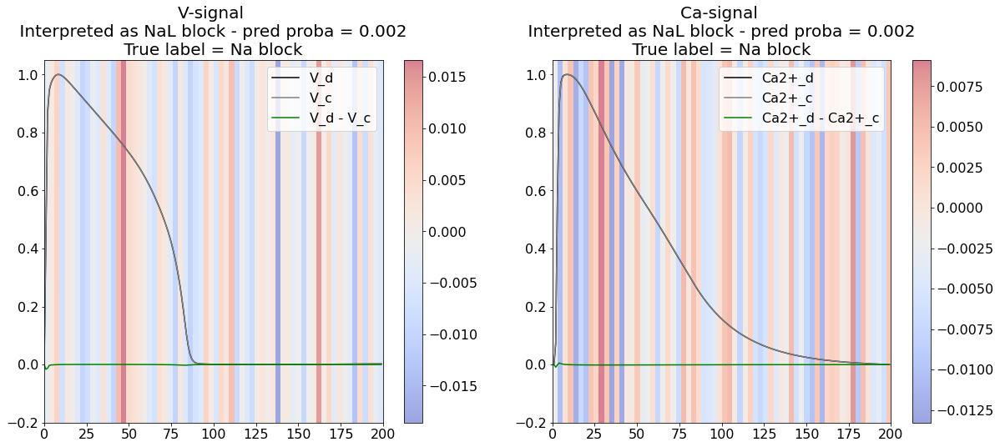

Explainaing with model_to
Plotting explanation from model_to


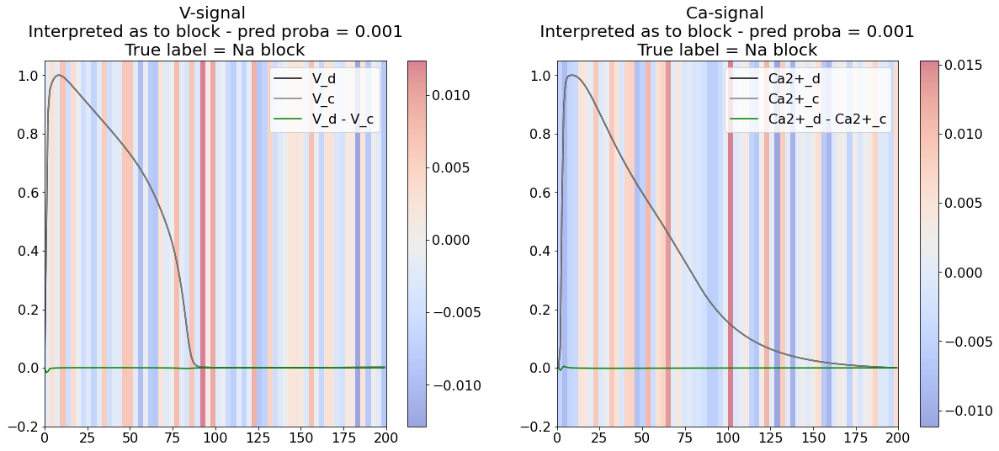

Explainaing with model_Ks
Plotting explanation from model_Ks


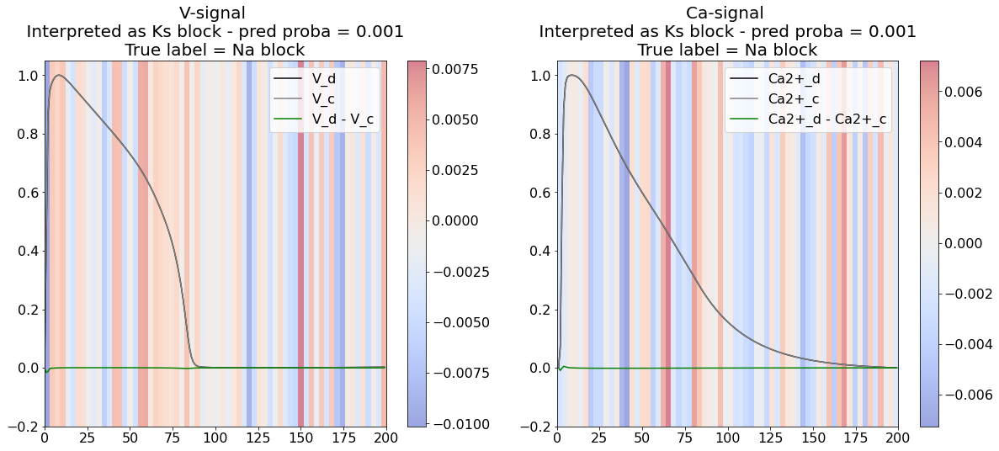

Explainaing with model_K1
Plotting explanation from model_K1


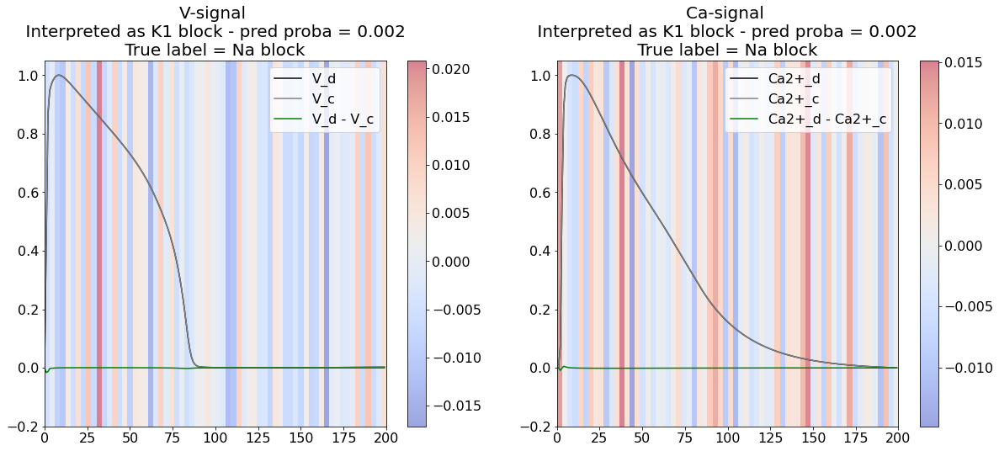

####################################
####################################
Looking at class NaL
####################################
####################################
[0 0 0 1 0 0 0]
Explainaing with model_Kr
Plotting explanation from model_Kr


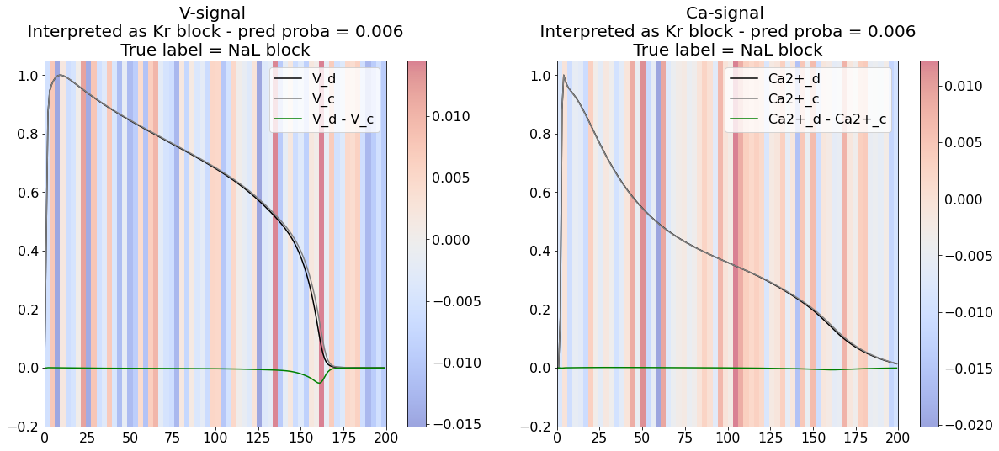

Explainaing with model_CaL
Plotting explanation from model_CaL


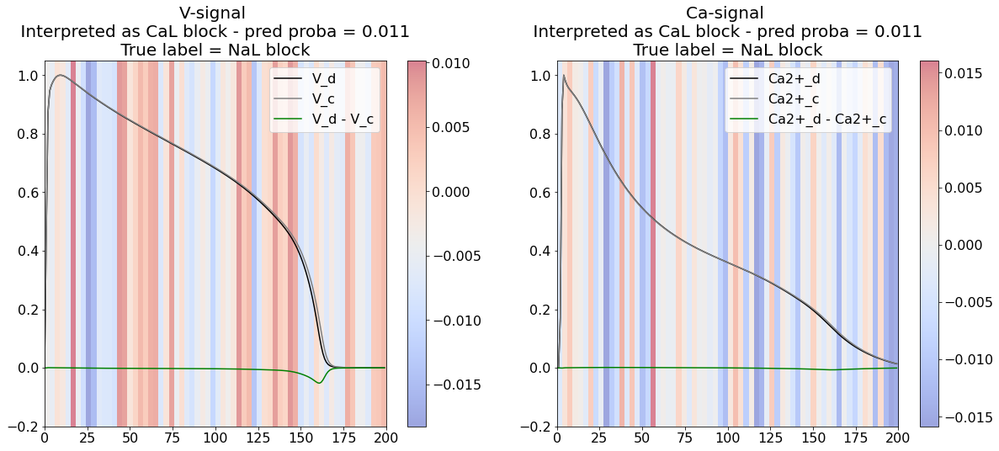

Explainaing with model_Na
Plotting explanation from model_Na


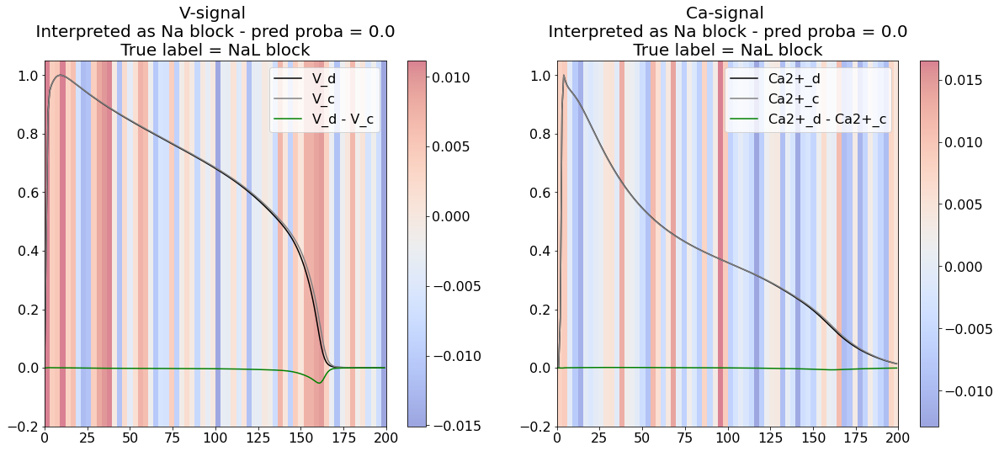

Explainaing with model_NaL
Plotting explanation from model_NaL


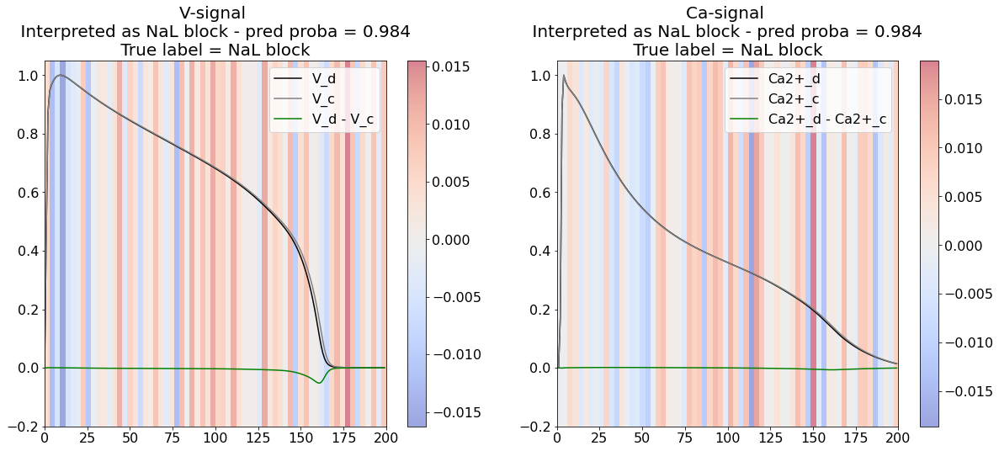

Explainaing with model_to
Plotting explanation from model_to


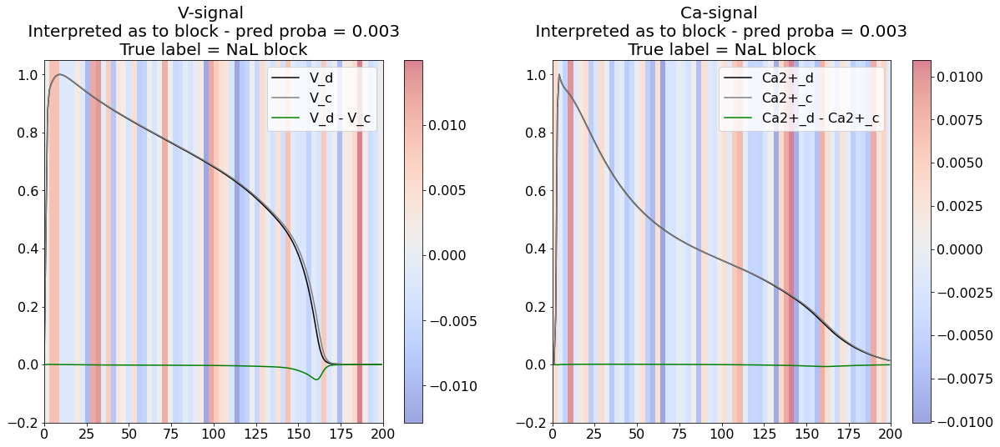

Explainaing with model_Ks
Plotting explanation from model_Ks


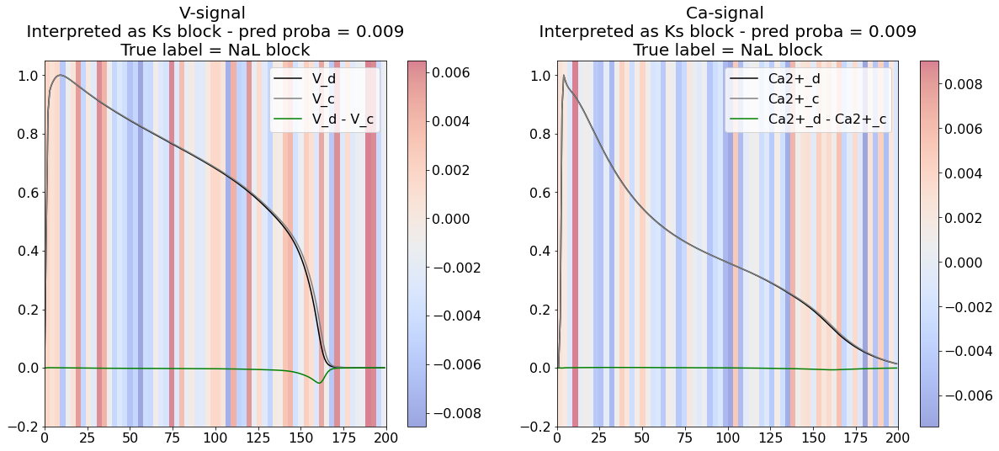

Explainaing with model_K1
Plotting explanation from model_K1


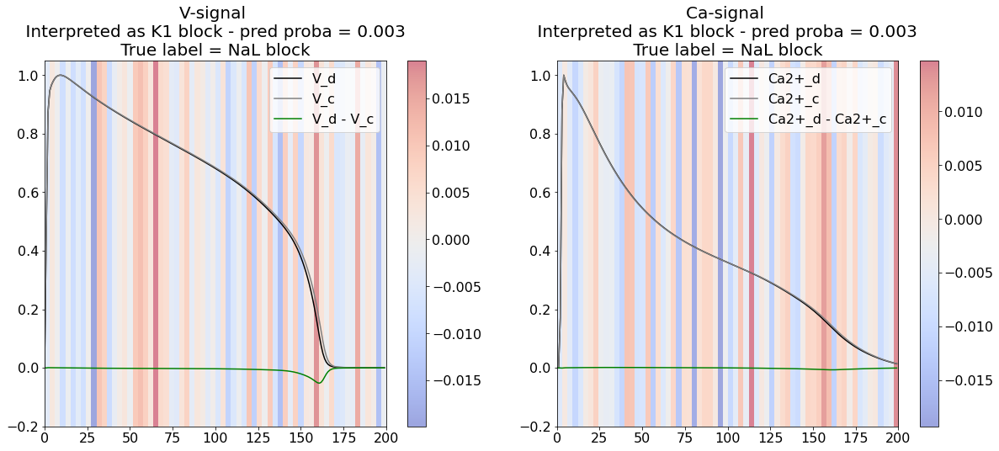

Explainaing with model_Kr
Plotting explanation from model_Kr


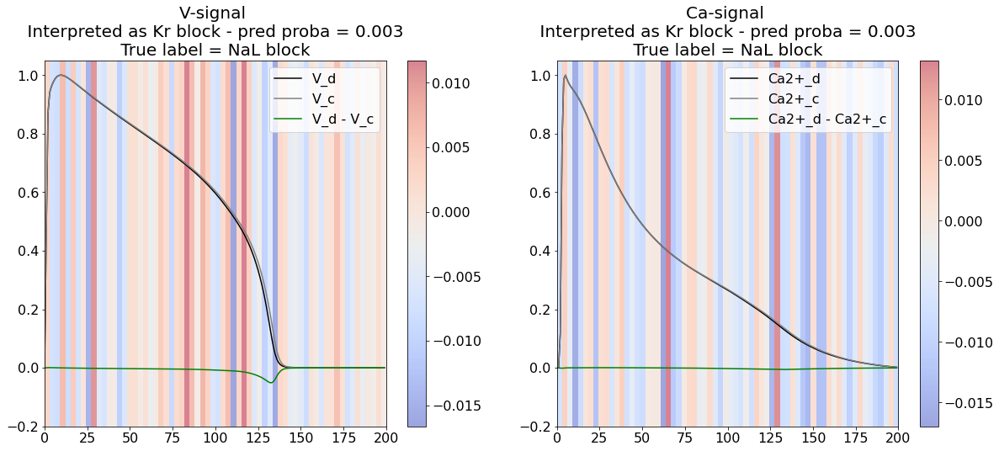

Explainaing with model_CaL
Plotting explanation from model_CaL


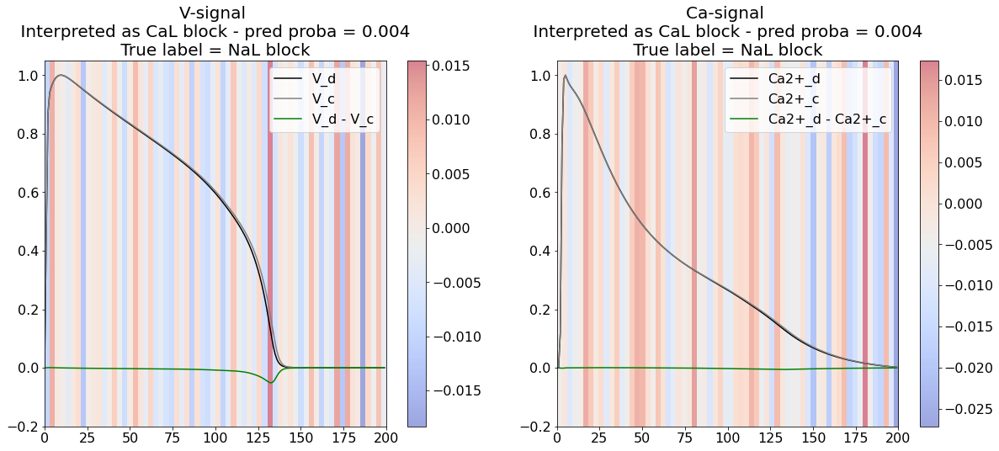

Explainaing with model_Na
Plotting explanation from model_Na


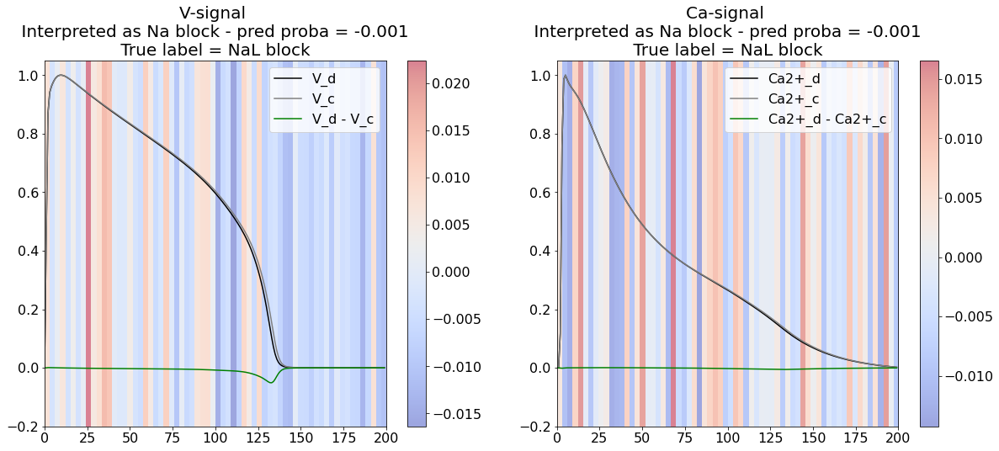

Explainaing with model_NaL
Plotting explanation from model_NaL


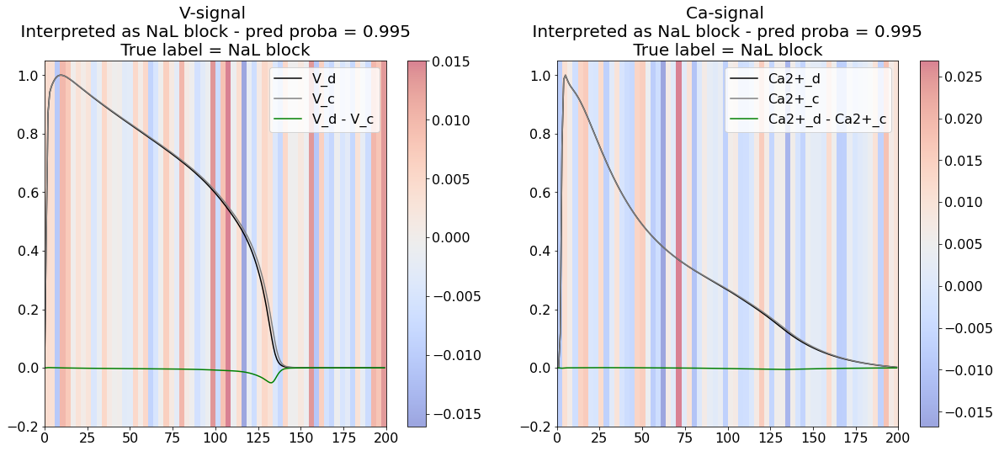

Explainaing with model_to
Plotting explanation from model_to


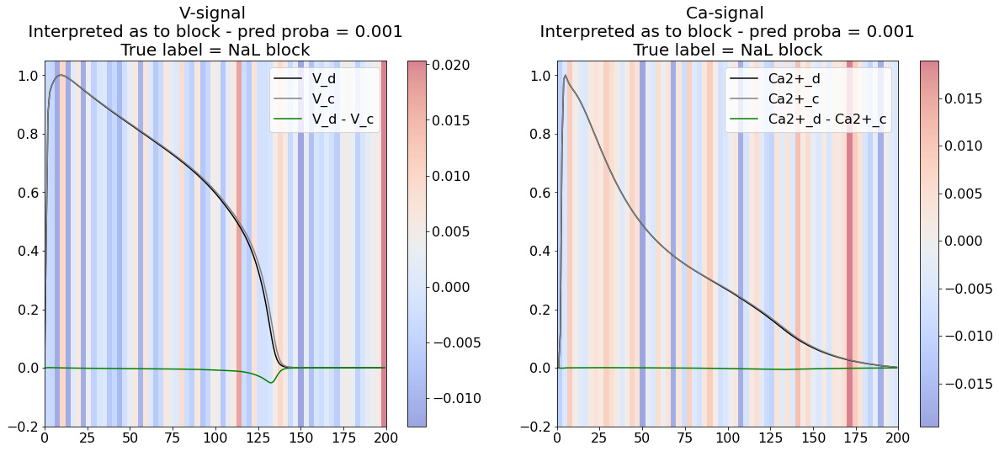

Explainaing with model_Ks
Plotting explanation from model_Ks


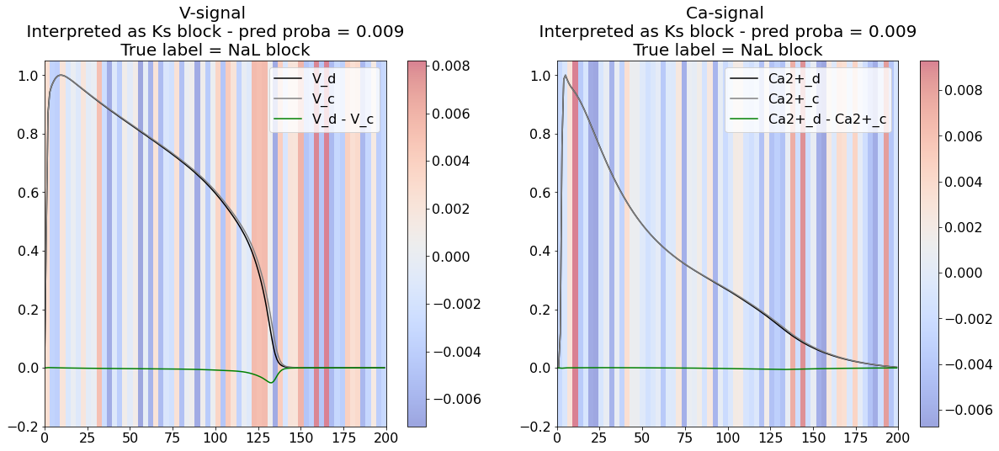

Explainaing with model_K1
Plotting explanation from model_K1


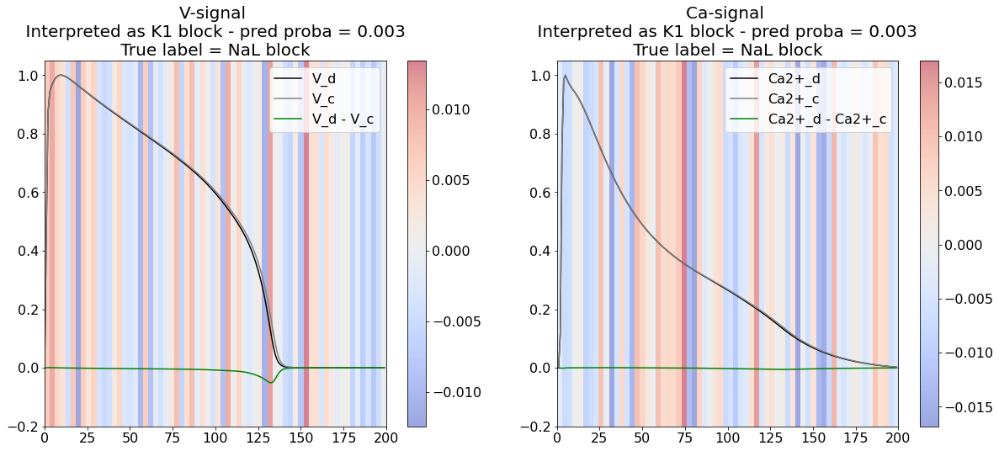

Explainaing with model_Kr
Plotting explanation from model_Kr


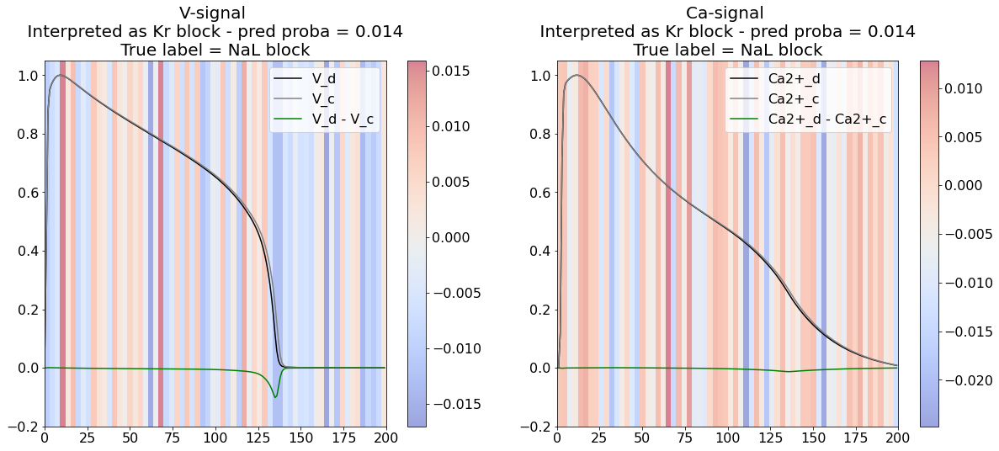

Explainaing with model_CaL
Plotting explanation from model_CaL


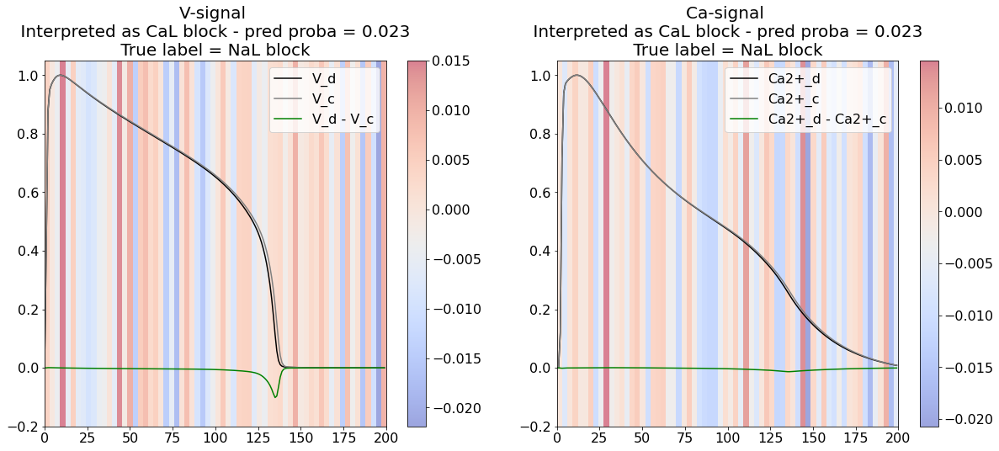

Explainaing with model_Na
Plotting explanation from model_Na


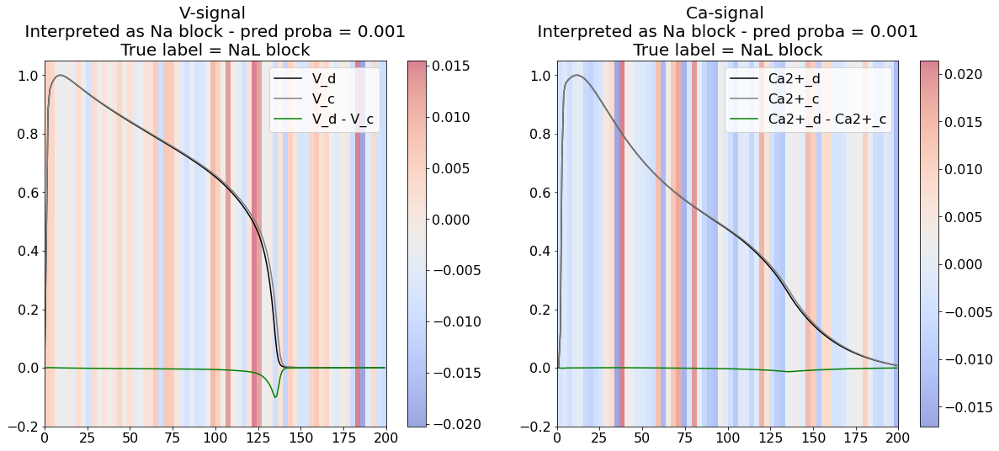

Explainaing with model_NaL
Plotting explanation from model_NaL


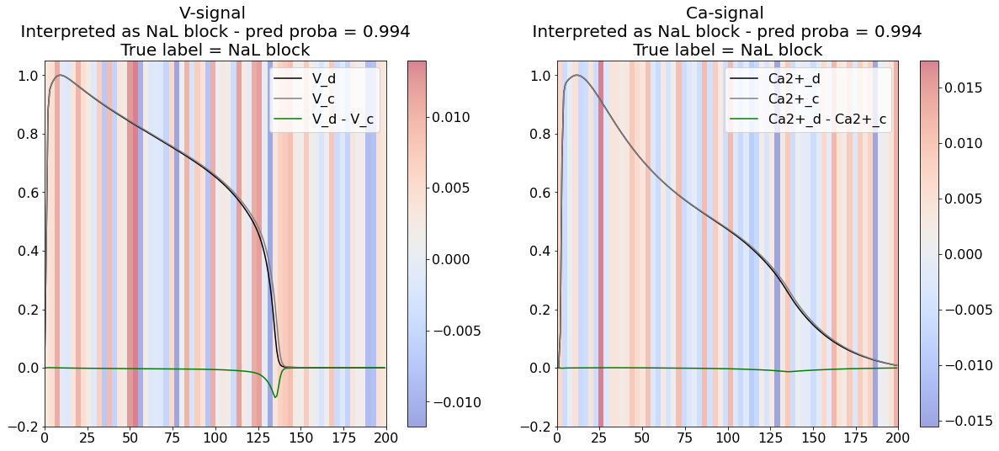

Explainaing with model_to
Plotting explanation from model_to


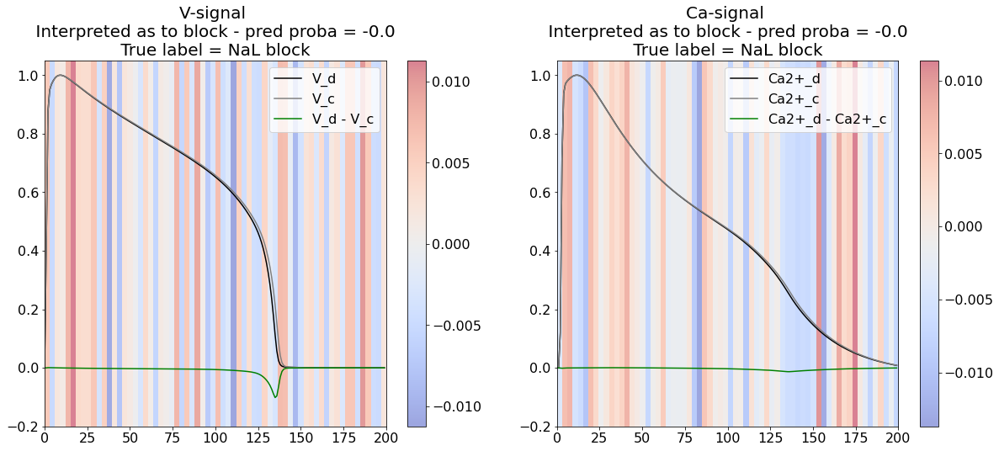

Explainaing with model_Ks
Plotting explanation from model_Ks


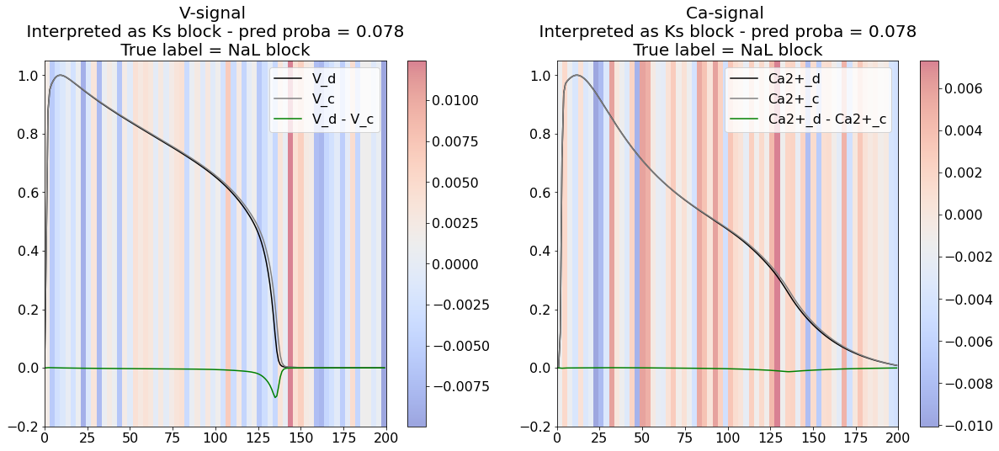

Explainaing with model_K1
Plotting explanation from model_K1


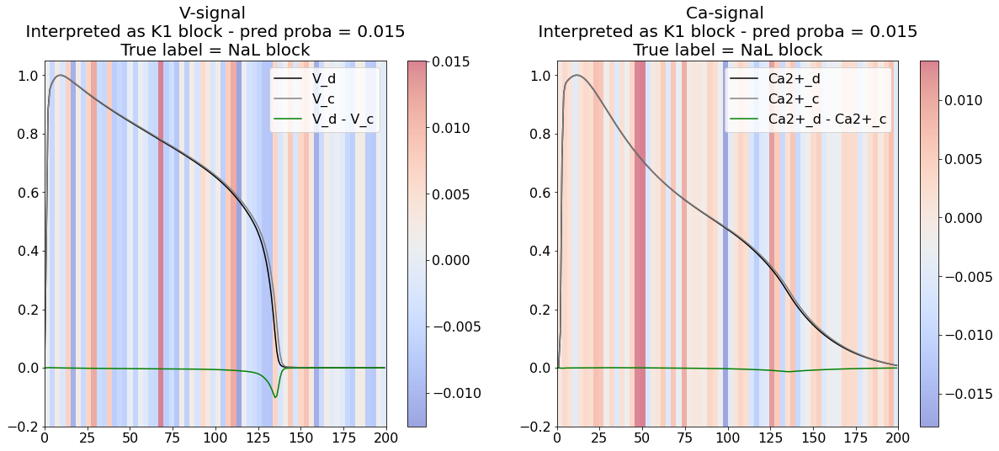

Explainaing with model_Kr
Plotting explanation from model_Kr


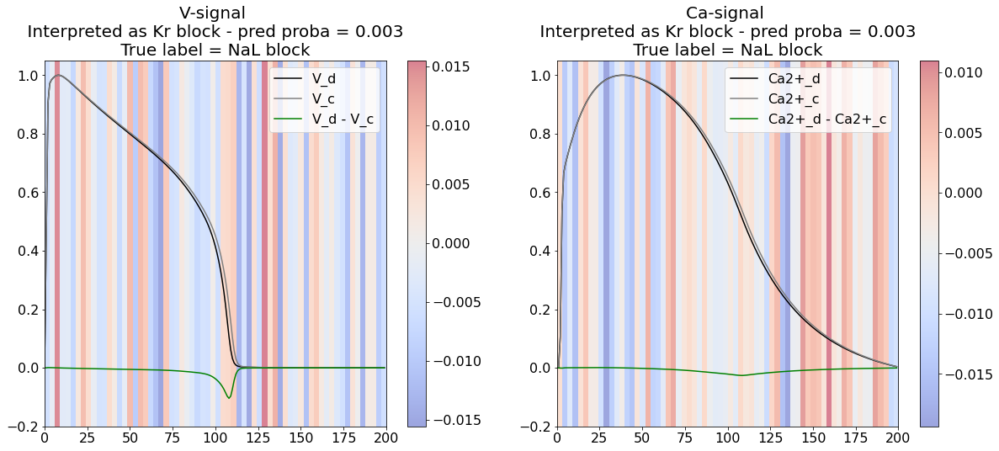

Explainaing with model_CaL
Plotting explanation from model_CaL


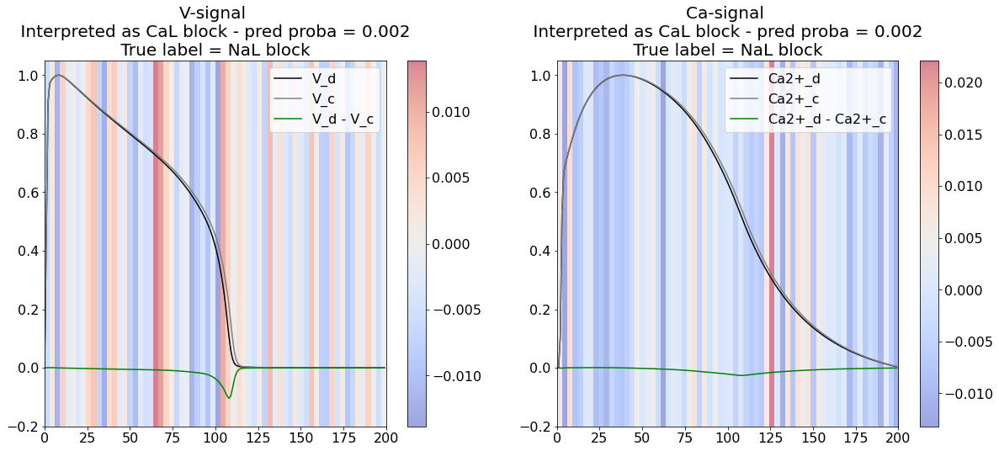

Explainaing with model_Na
Plotting explanation from model_Na


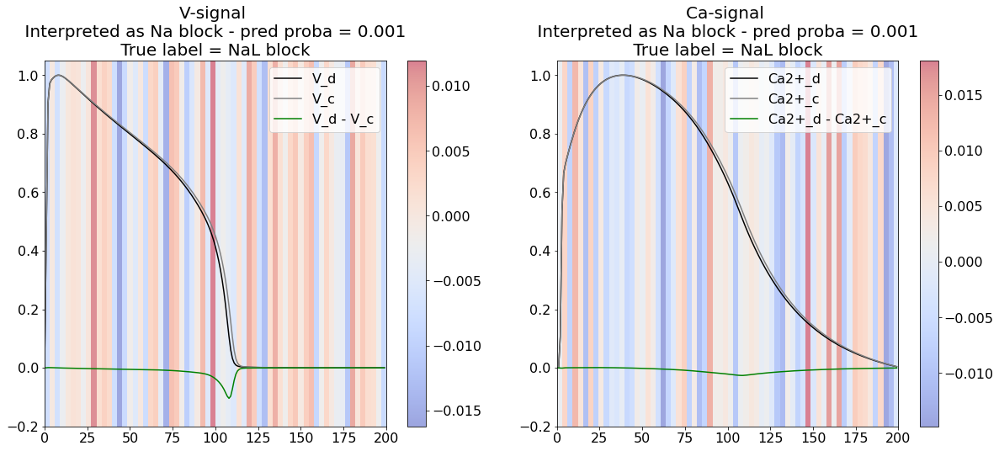

Explainaing with model_NaL
Plotting explanation from model_NaL


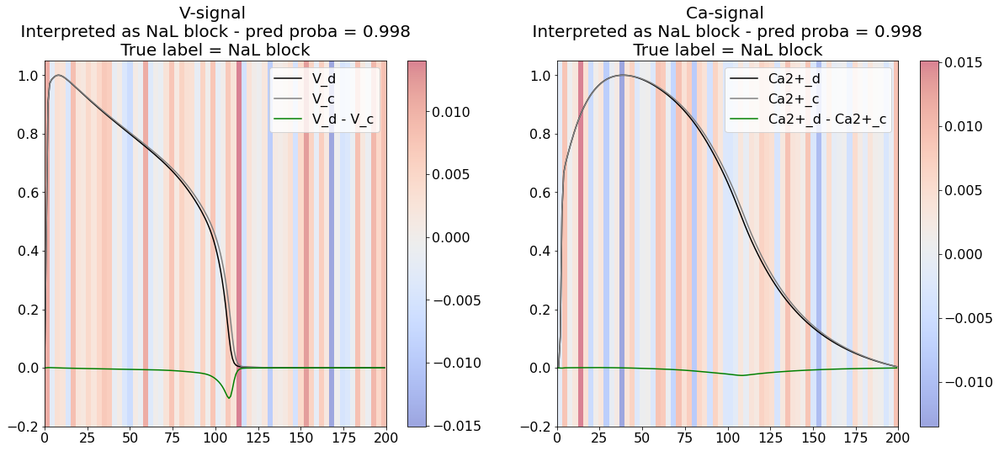

Explainaing with model_to
Plotting explanation from model_to


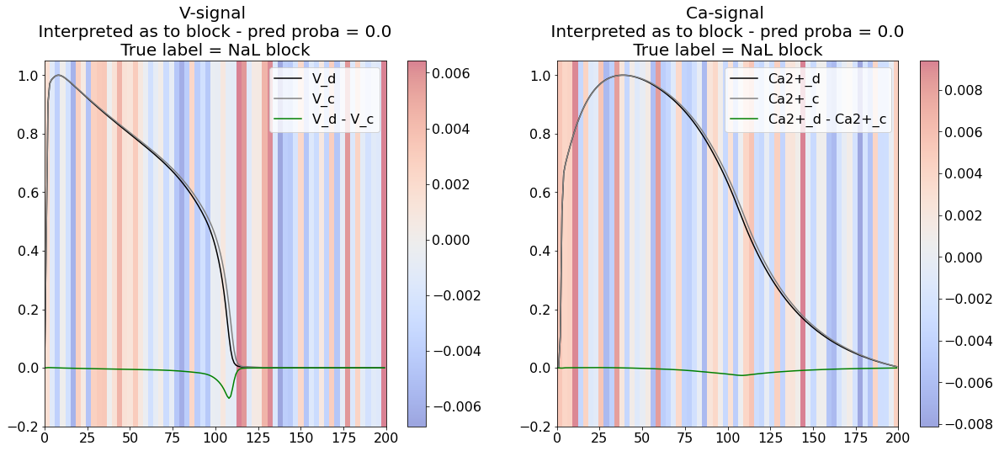

Explainaing with model_Ks
Plotting explanation from model_Ks


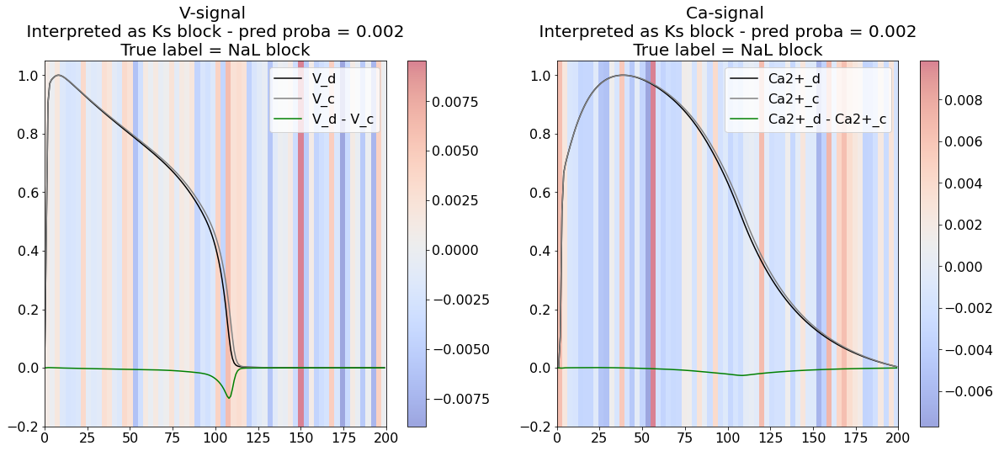

Explainaing with model_K1
Plotting explanation from model_K1


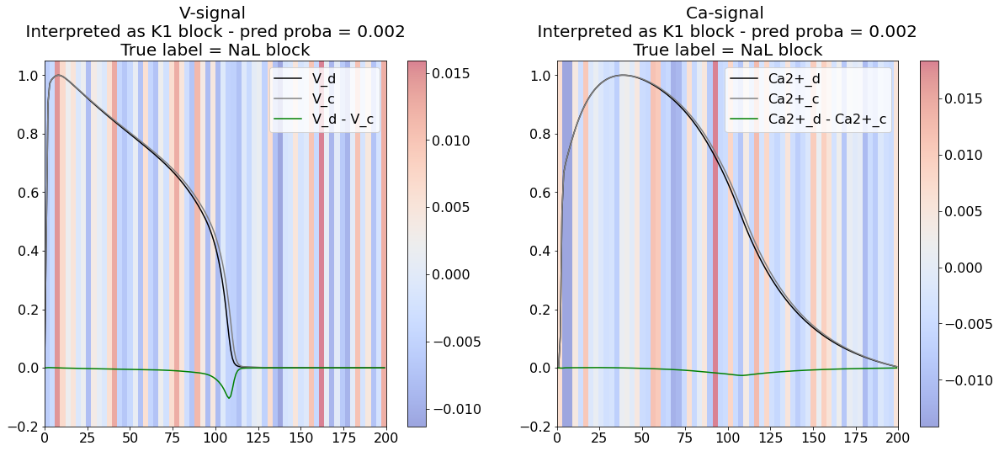

####################################
####################################
Looking at class to
####################################
####################################
[0 0 0 0 1 0 0]
Explainaing with model_Kr
Plotting explanation from model_Kr


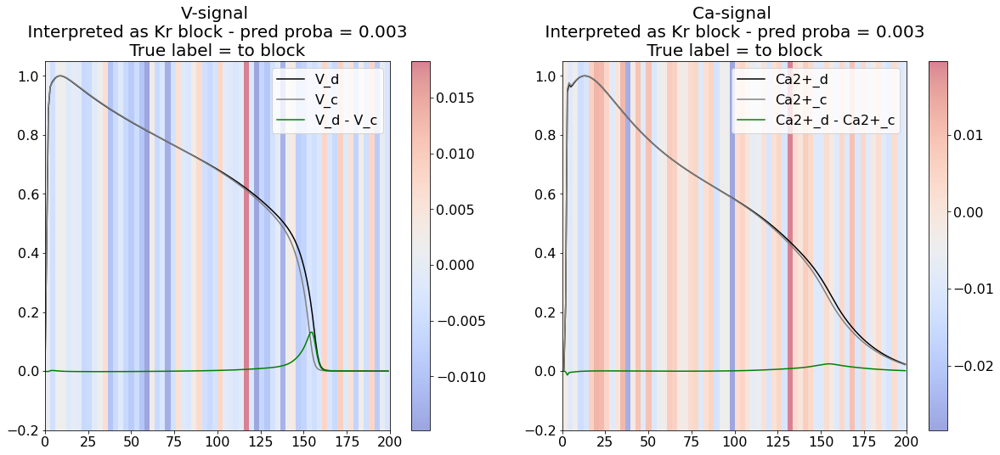

Explainaing with model_CaL
Plotting explanation from model_CaL


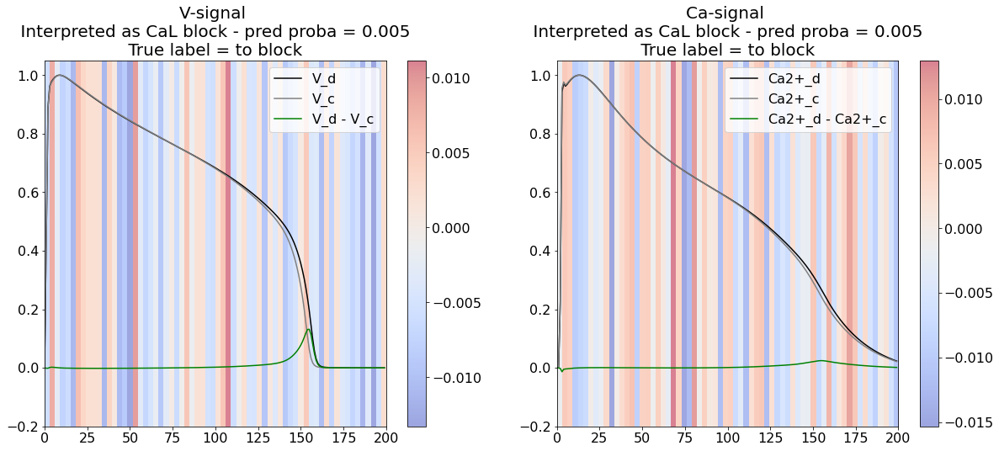

Explainaing with model_Na
Plotting explanation from model_Na


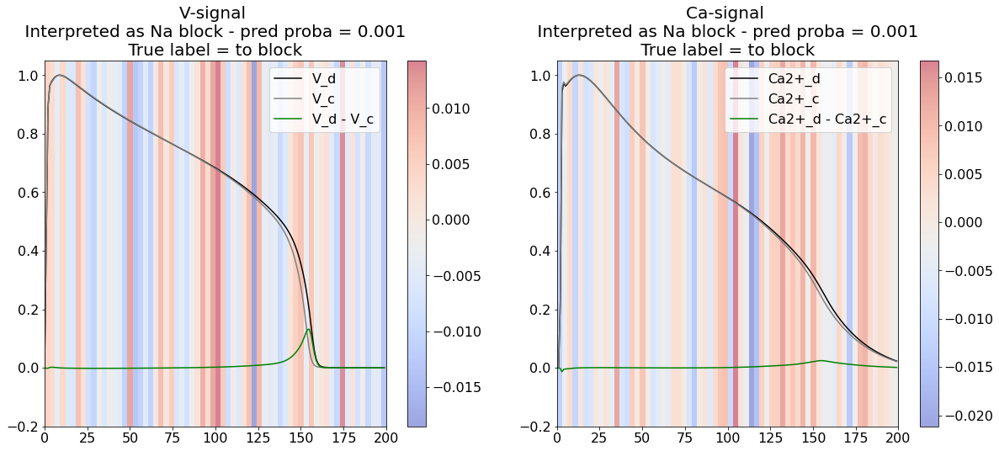

Explainaing with model_NaL
Plotting explanation from model_NaL


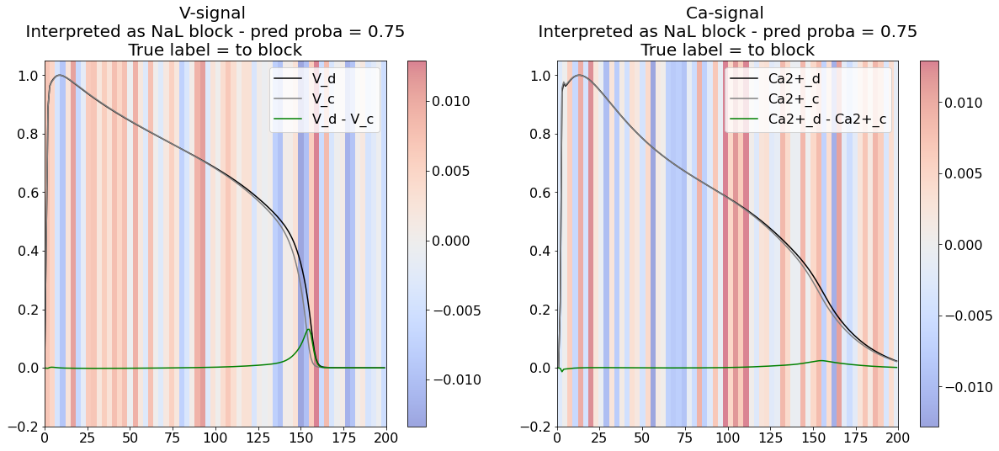

Explainaing with model_to
Plotting explanation from model_to


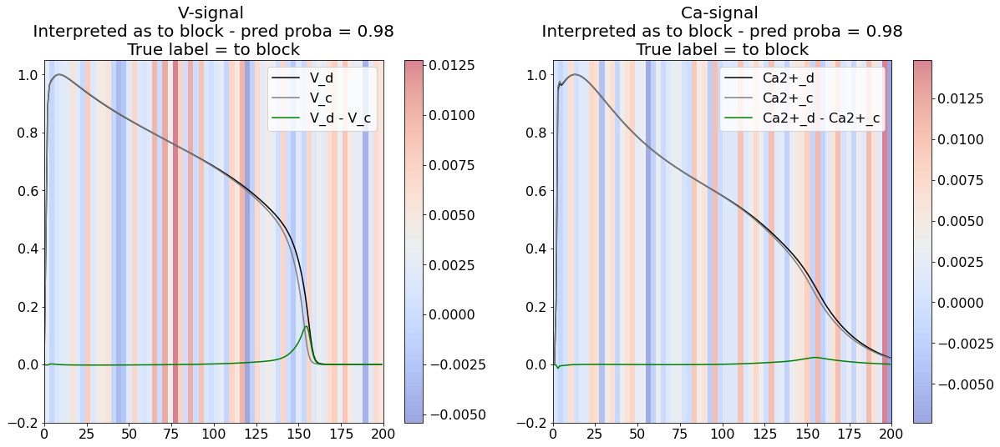

Explainaing with model_Ks
Plotting explanation from model_Ks


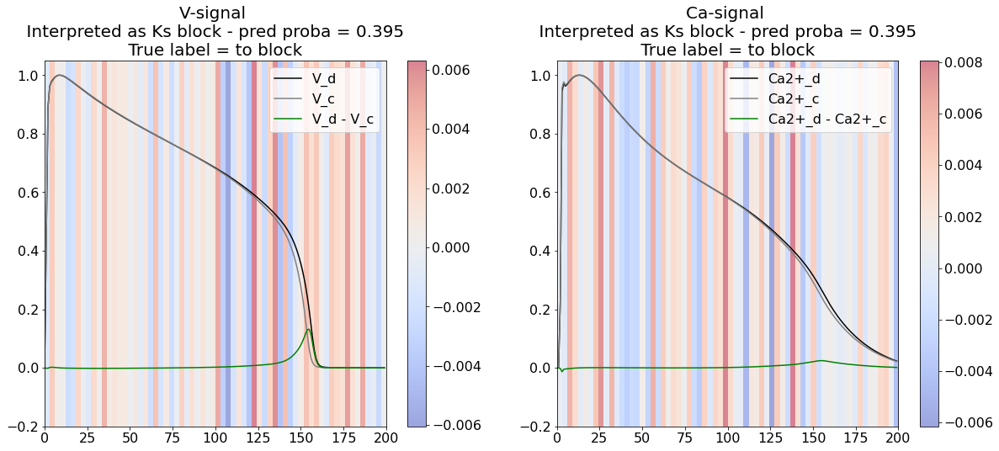

Explainaing with model_K1
Plotting explanation from model_K1


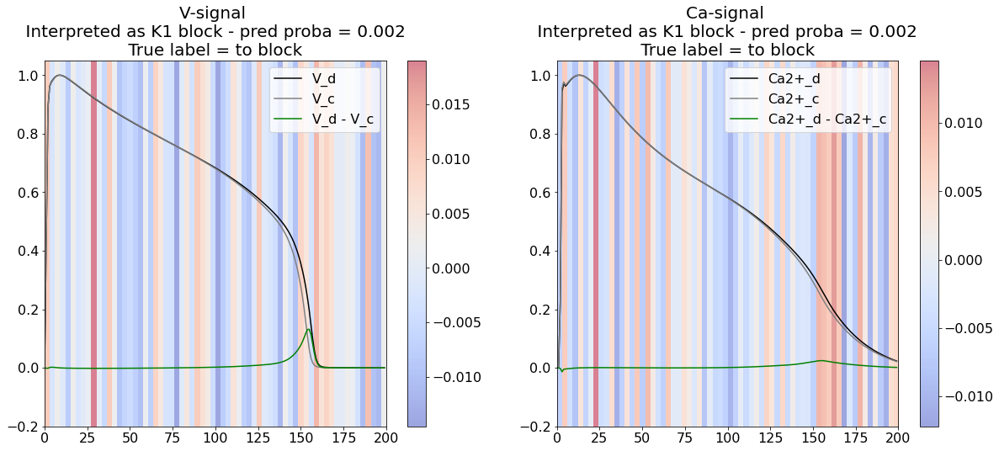

Explainaing with model_Kr
Plotting explanation from model_Kr


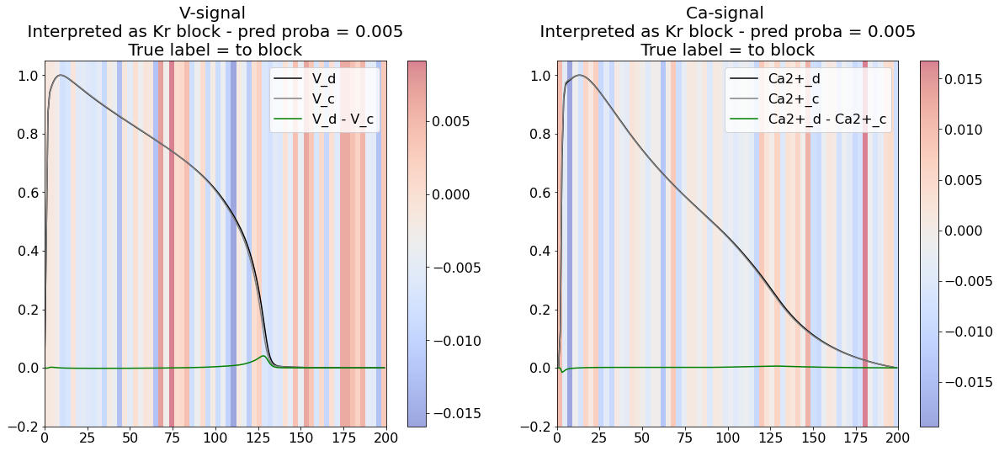

Explainaing with model_CaL
Plotting explanation from model_CaL


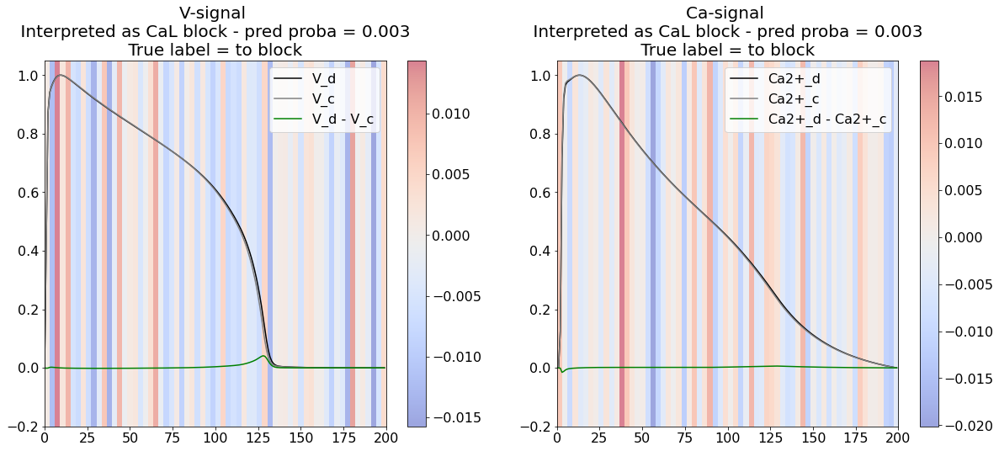

Explainaing with model_Na
Plotting explanation from model_Na


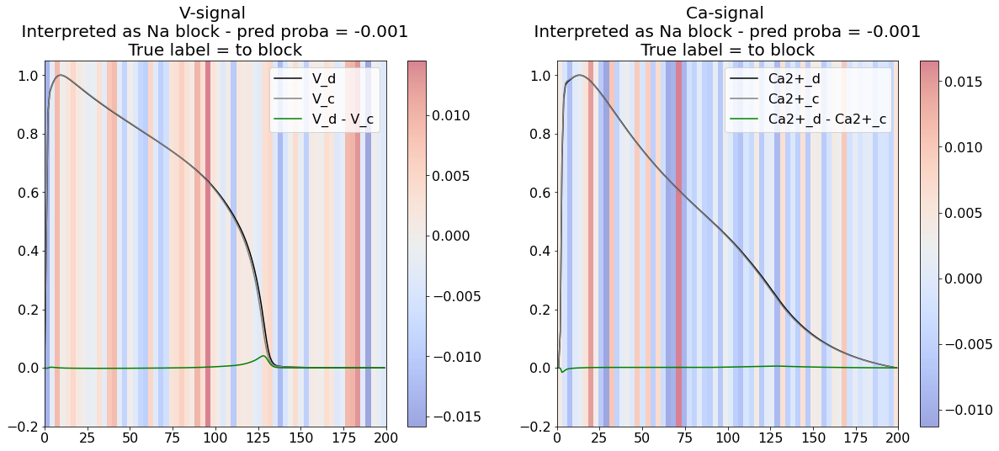

Explainaing with model_NaL
Plotting explanation from model_NaL


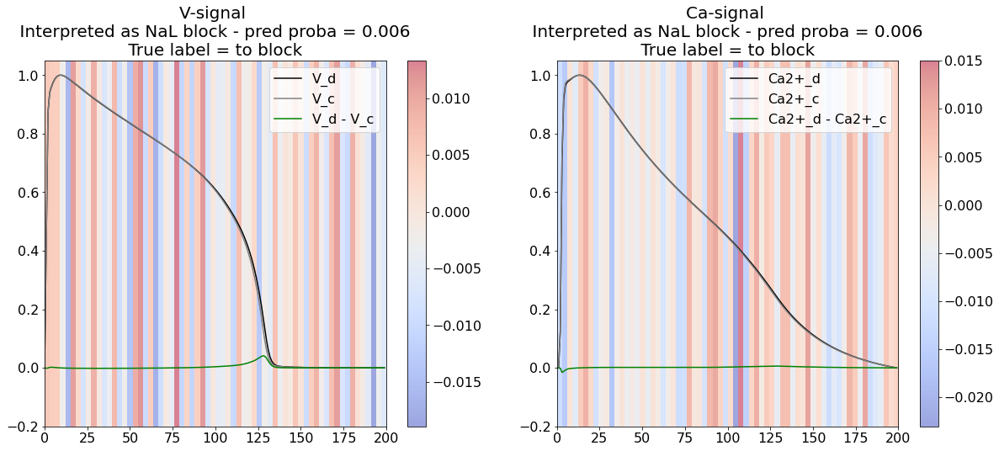

Explainaing with model_to
Plotting explanation from model_to


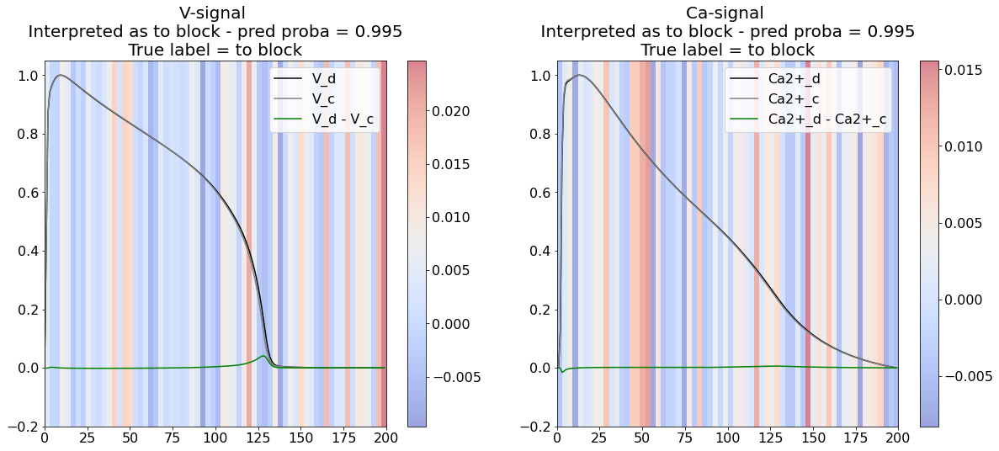

Explainaing with model_Ks
Plotting explanation from model_Ks


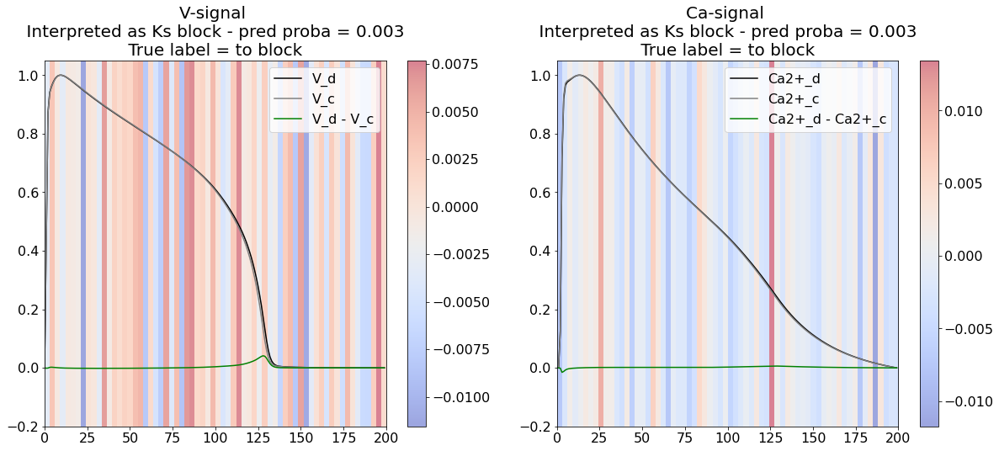

Explainaing with model_K1
Plotting explanation from model_K1


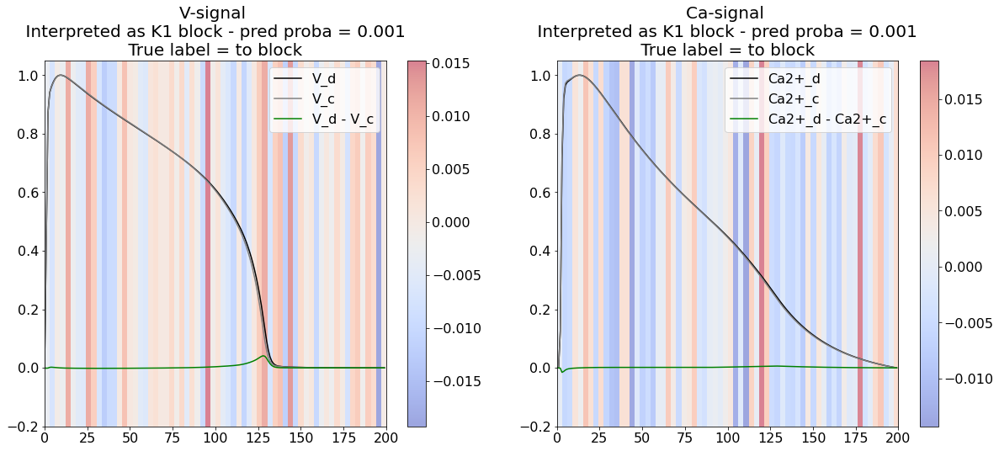

Explainaing with model_Kr
Plotting explanation from model_Kr


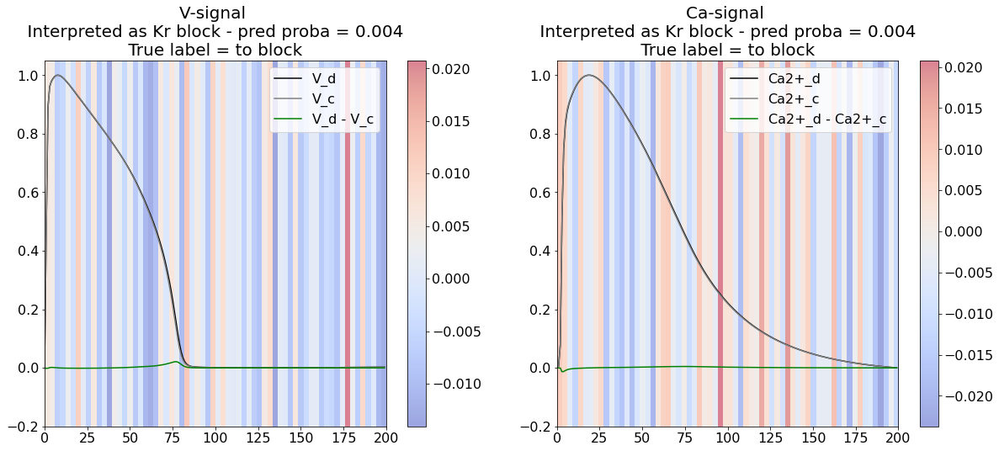

Explainaing with model_CaL
Plotting explanation from model_CaL


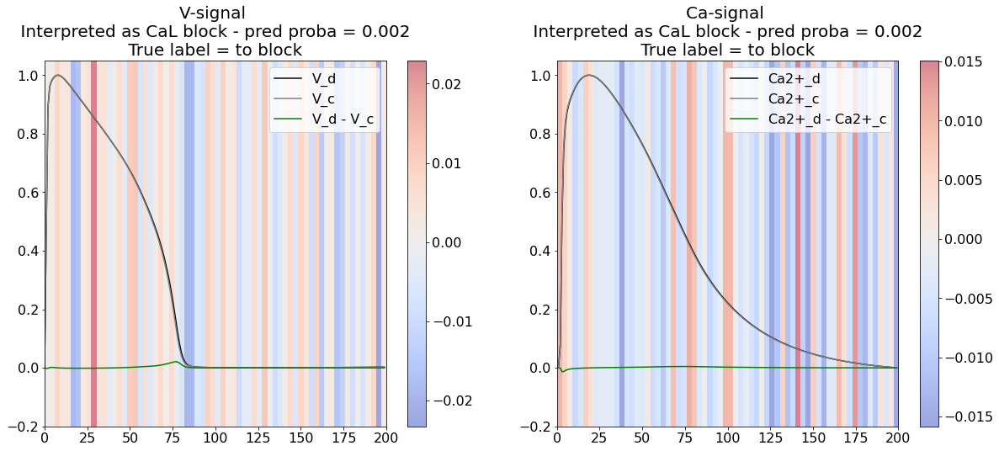

Explainaing with model_Na
Plotting explanation from model_Na


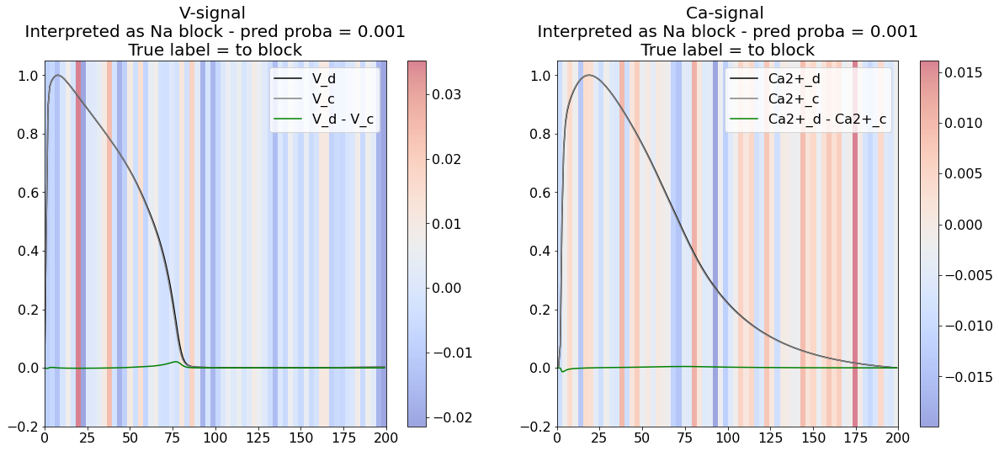

Explainaing with model_NaL
Plotting explanation from model_NaL


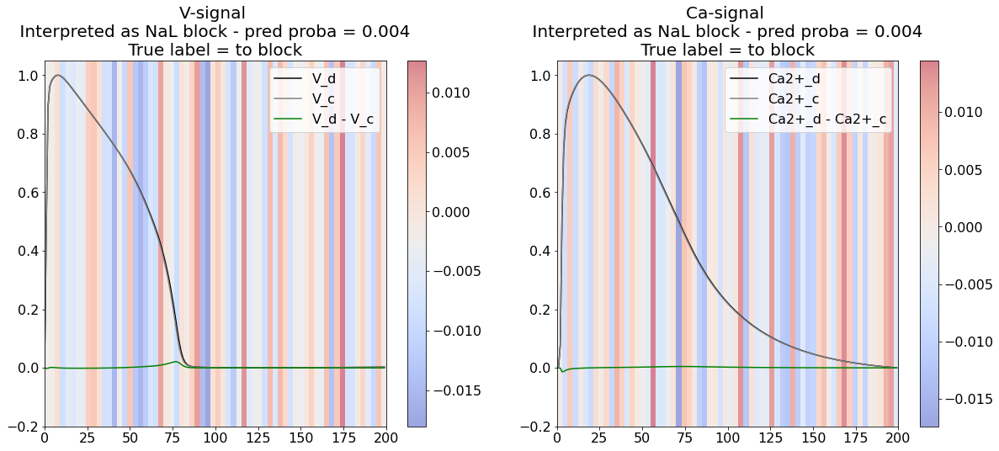

Explainaing with model_to
Plotting explanation from model_to


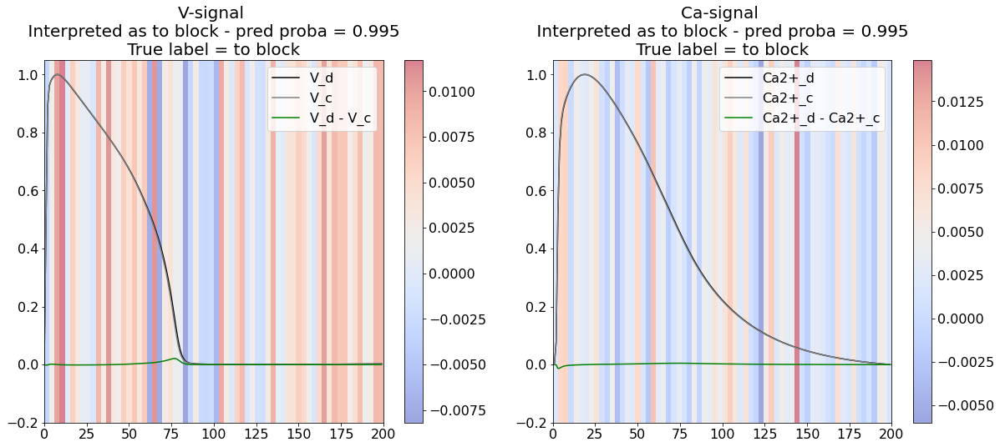

Explainaing with model_Ks
Plotting explanation from model_Ks


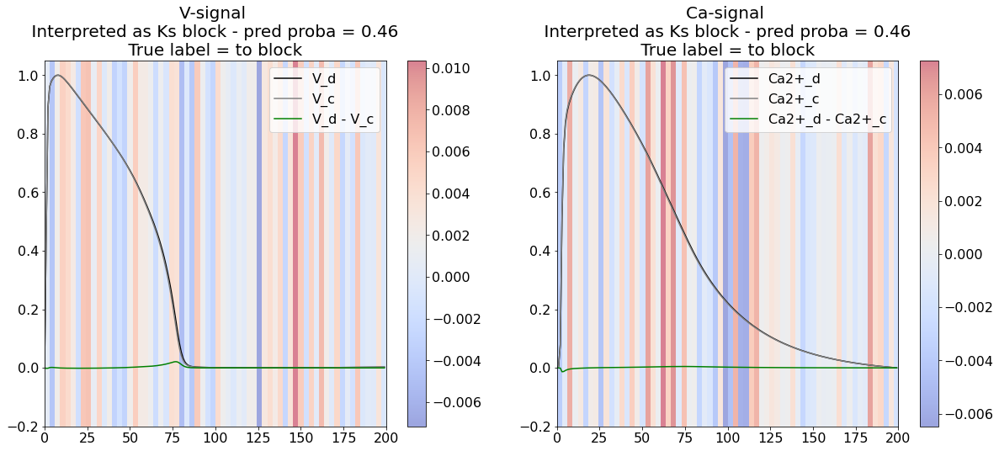

Explainaing with model_K1
Plotting explanation from model_K1


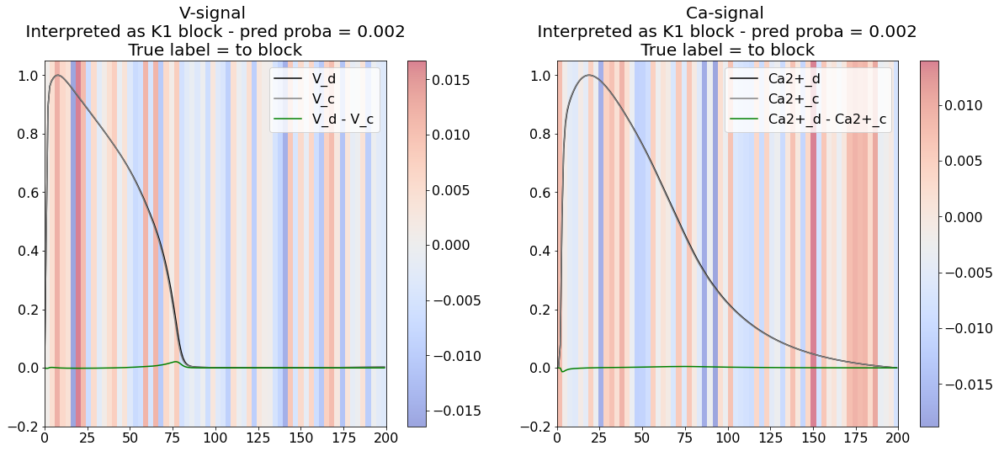

####################################
####################################
Looking at class Ks
####################################
####################################
[0 0 0 0 0 1 0]
Explainaing with model_Kr
Plotting explanation from model_Kr


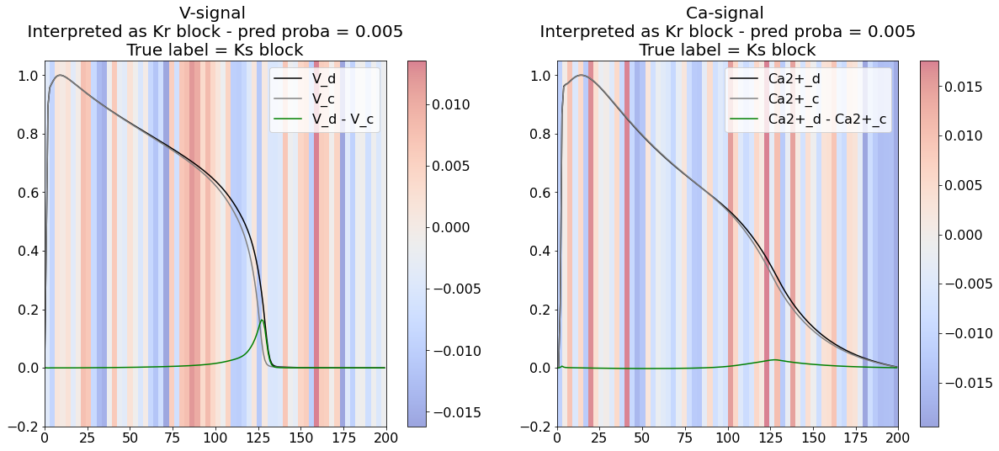

Explainaing with model_CaL
Plotting explanation from model_CaL


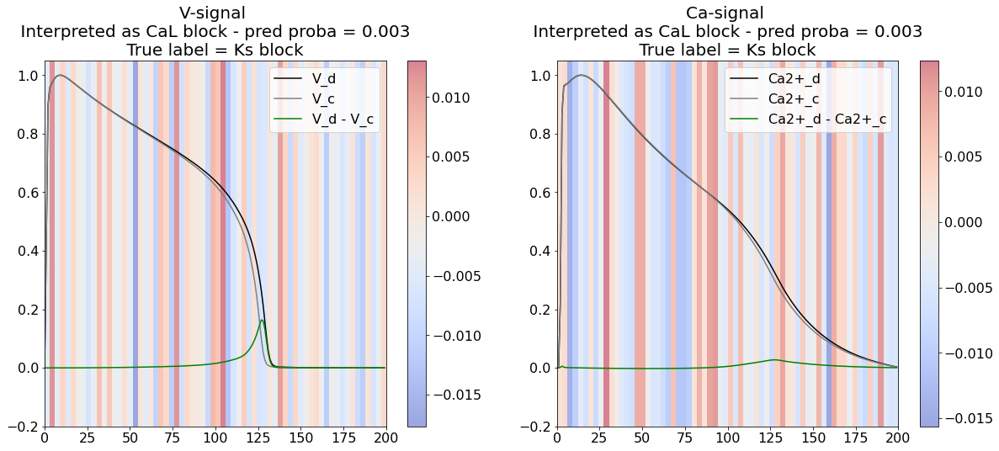

Explainaing with model_Na
Plotting explanation from model_Na


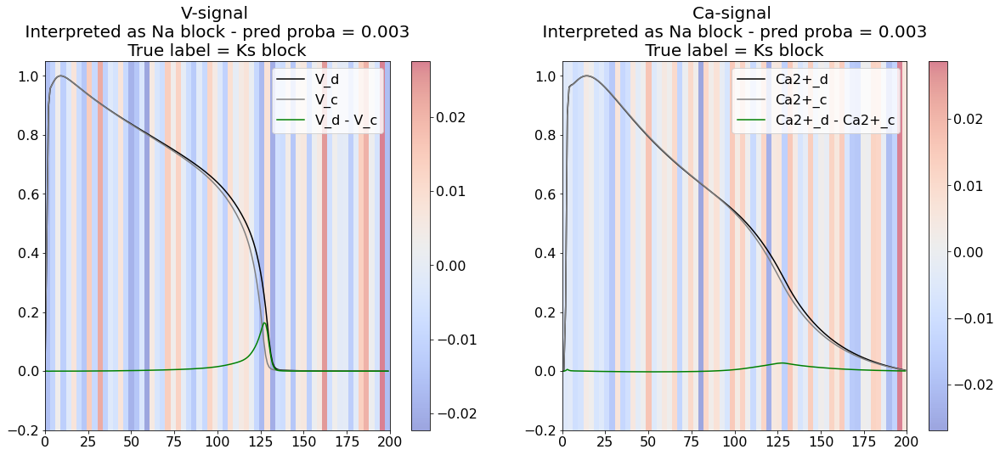

Explainaing with model_NaL
Plotting explanation from model_NaL


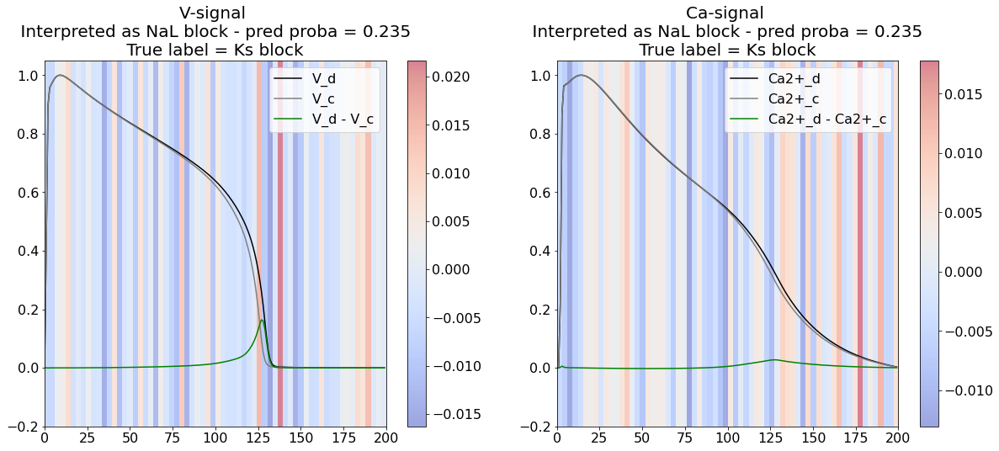

Explainaing with model_to
Plotting explanation from model_to


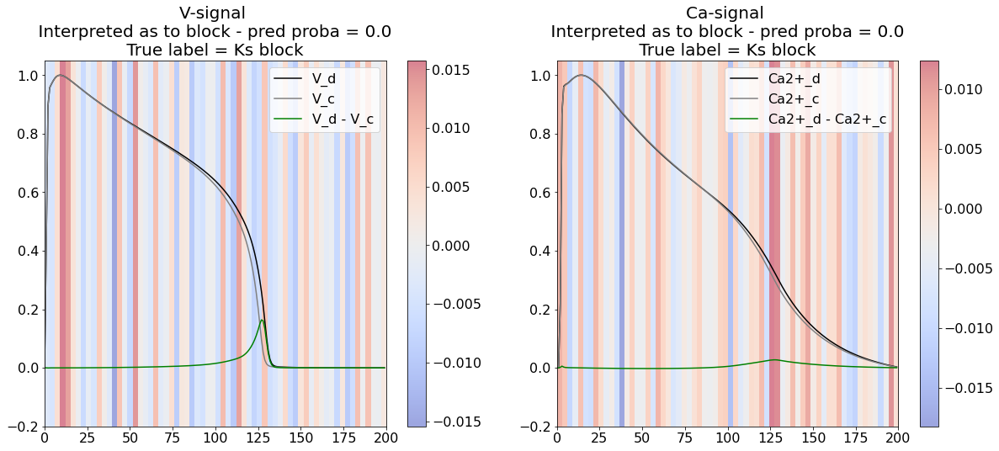

Explainaing with model_Ks
Plotting explanation from model_Ks


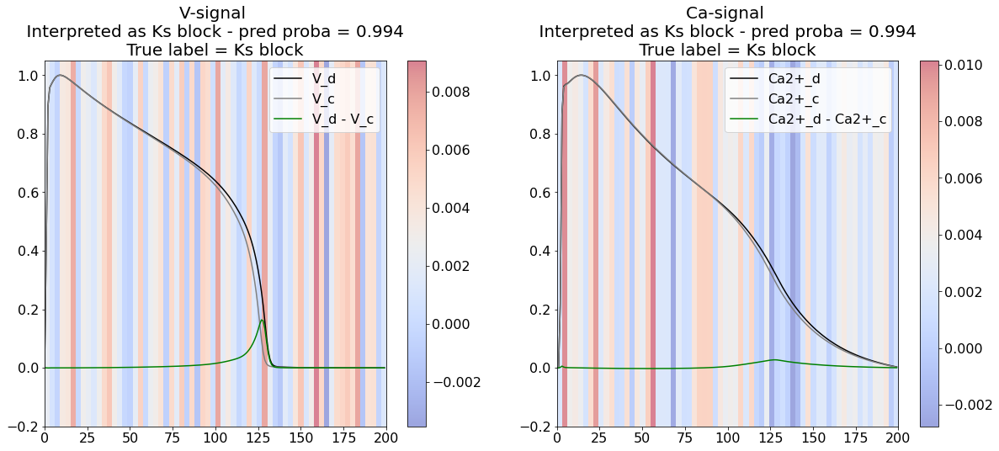

Explainaing with model_K1
Plotting explanation from model_K1


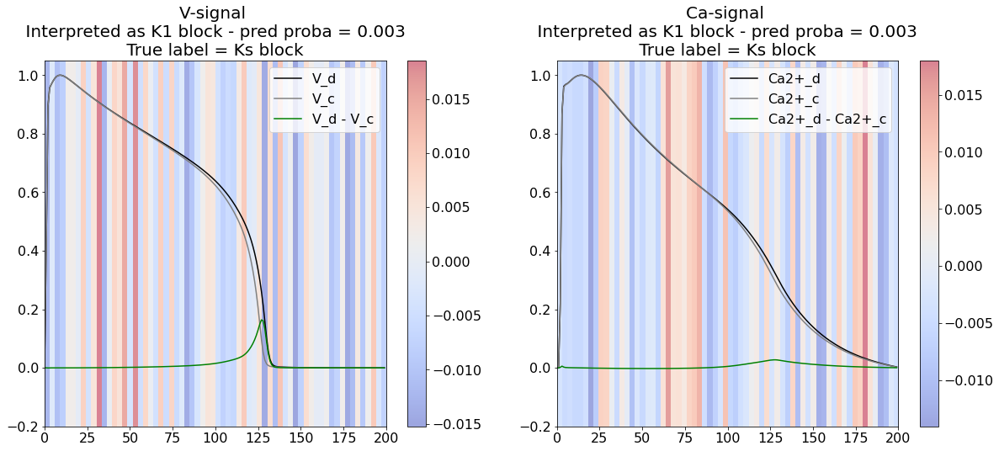

Explainaing with model_Kr
Plotting explanation from model_Kr


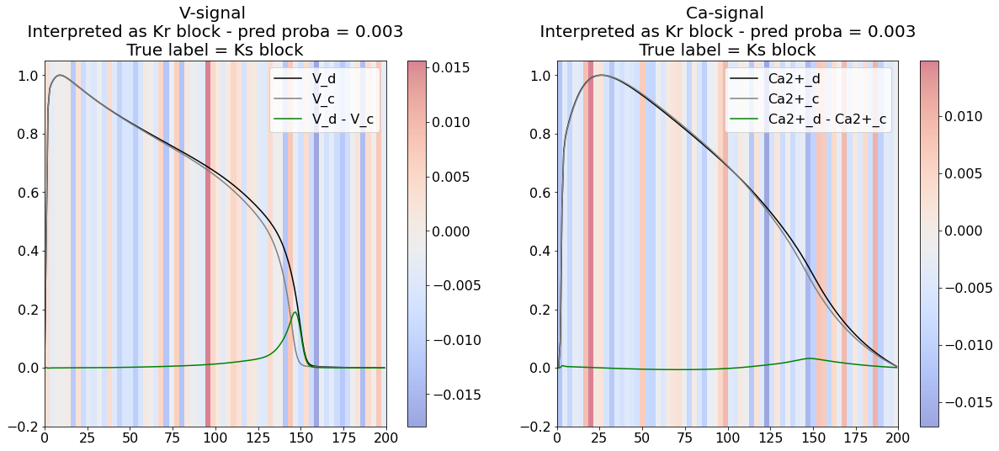

Explainaing with model_CaL
Plotting explanation from model_CaL


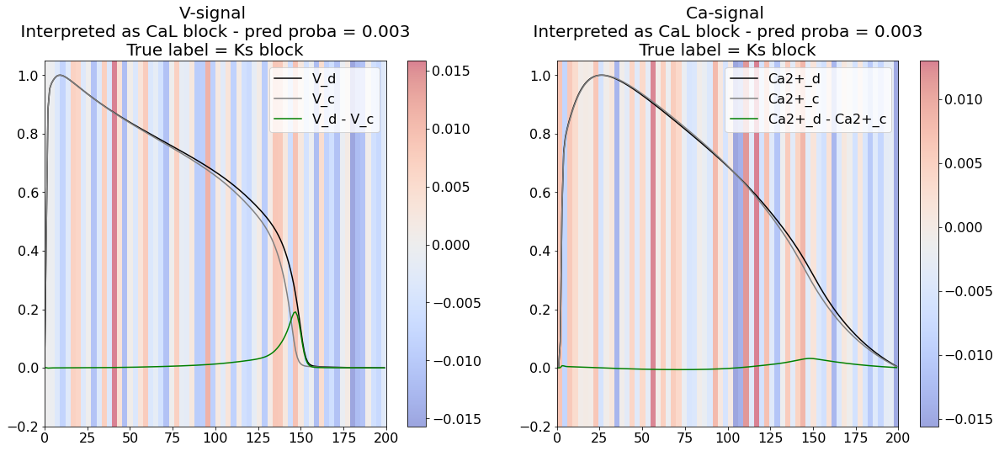

Explainaing with model_Na
Plotting explanation from model_Na


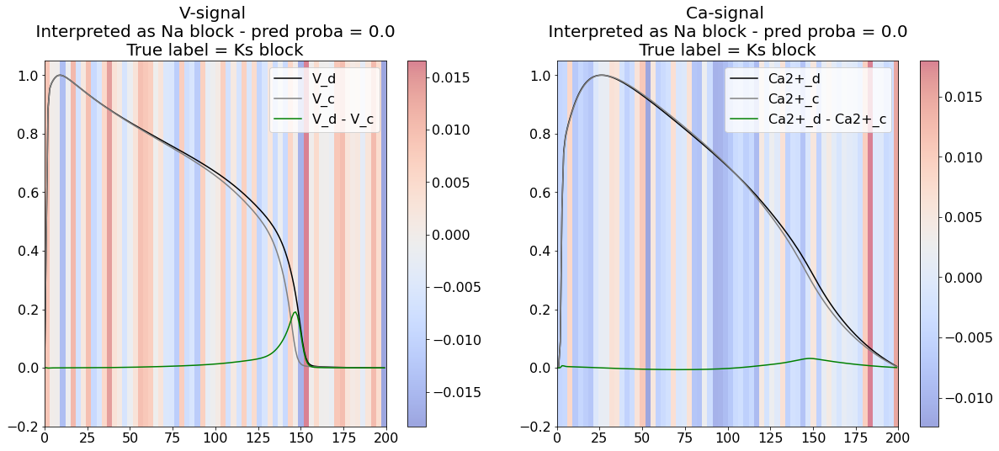

Explainaing with model_NaL
Plotting explanation from model_NaL


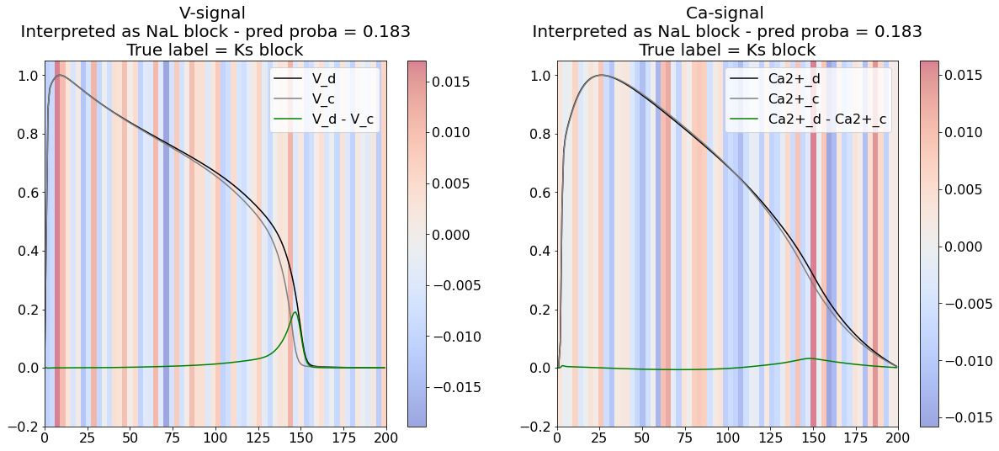

Explainaing with model_to
Plotting explanation from model_to


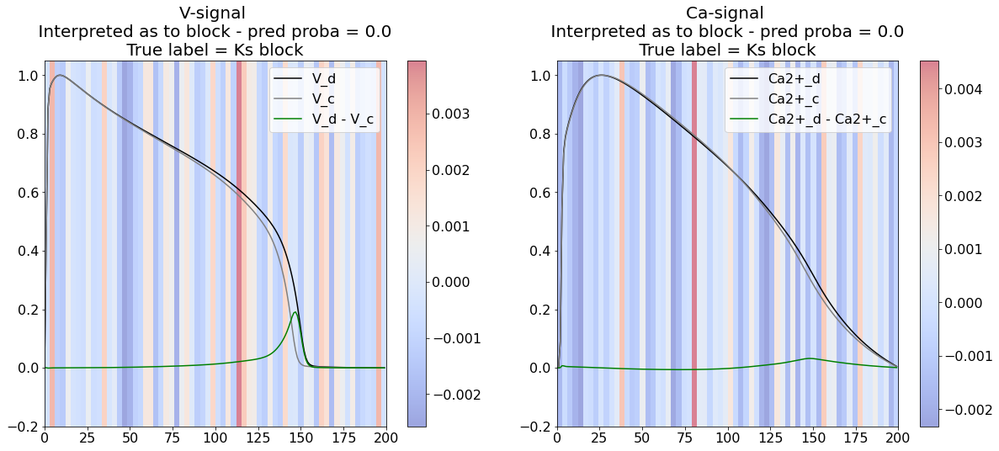

Explainaing with model_Ks
Plotting explanation from model_Ks


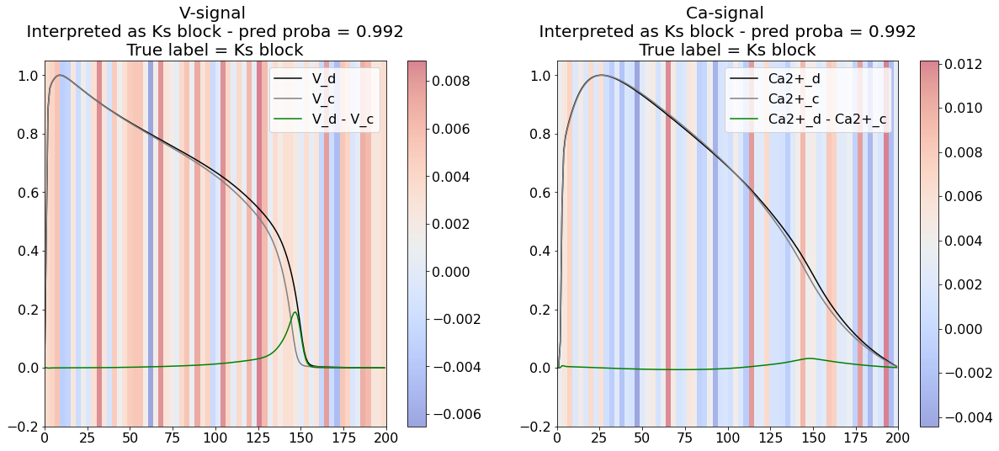

Explainaing with model_K1
Plotting explanation from model_K1


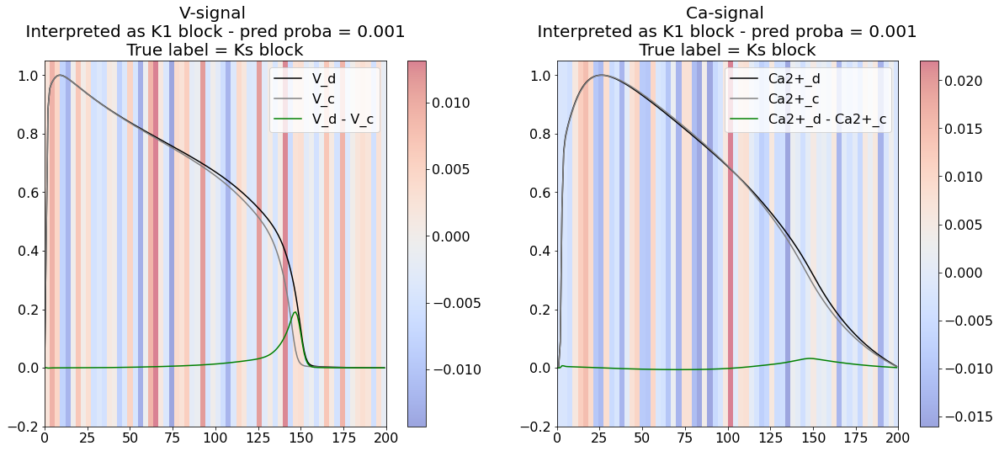

Explainaing with model_Kr
Plotting explanation from model_Kr


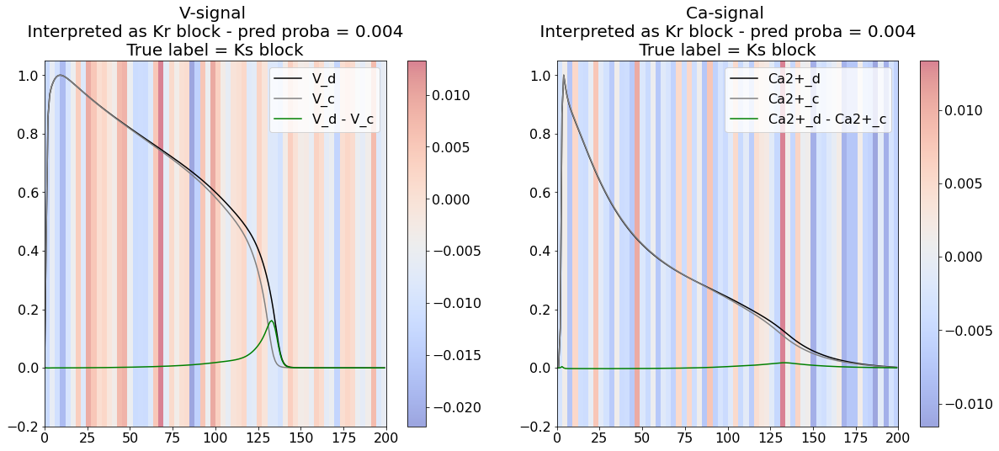

Explainaing with model_CaL
Plotting explanation from model_CaL


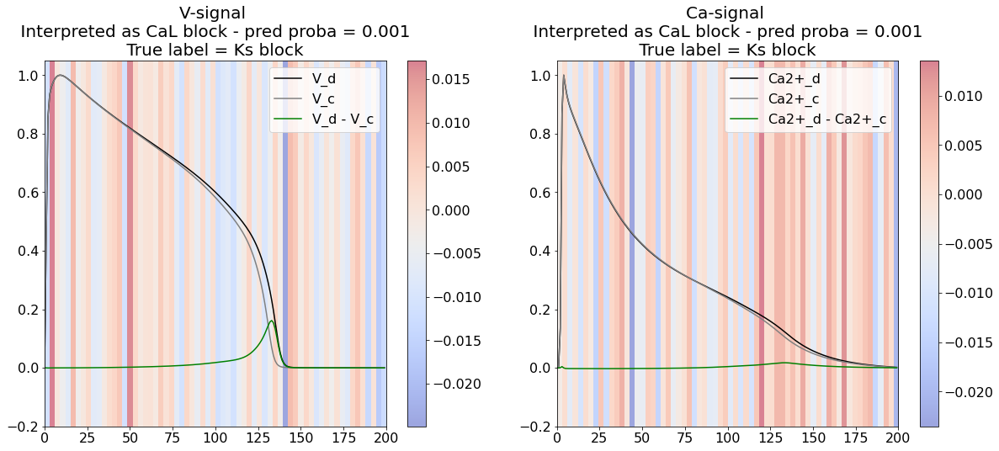

Explainaing with model_Na
Plotting explanation from model_Na


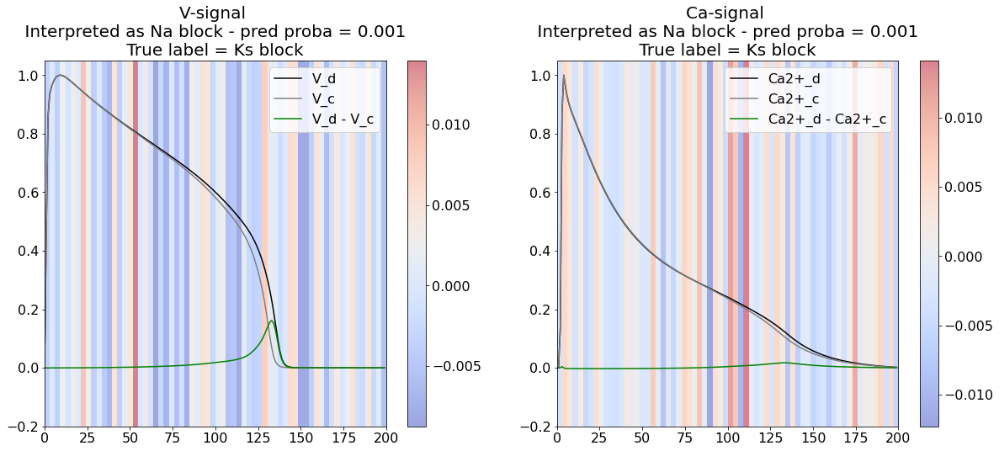

Explainaing with model_NaL
Plotting explanation from model_NaL


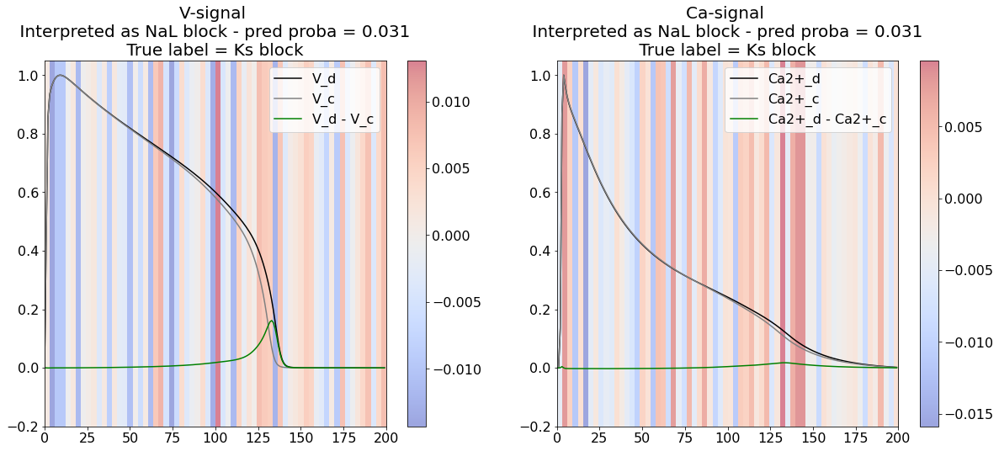

Explainaing with model_to
Plotting explanation from model_to


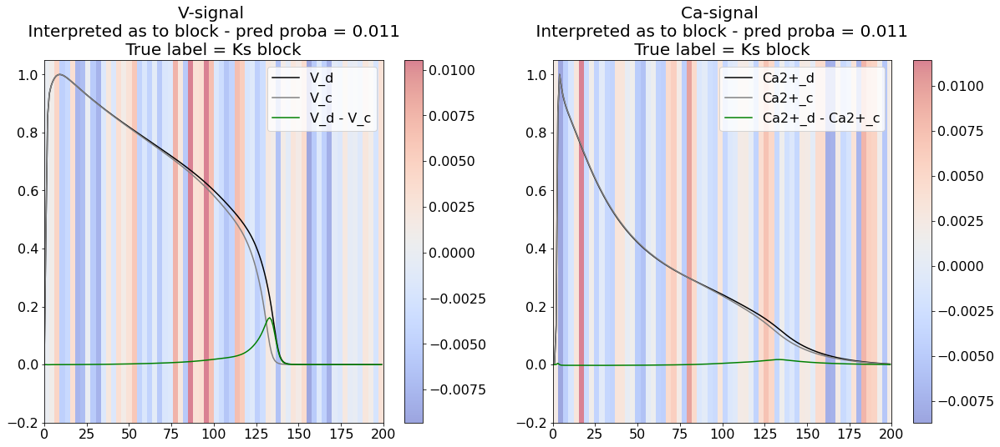

Explainaing with model_Ks
Plotting explanation from model_Ks


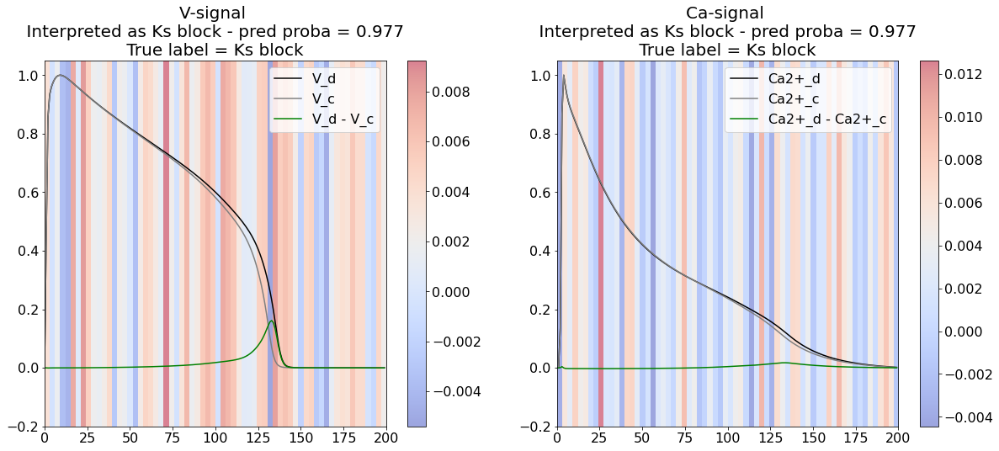

Explainaing with model_K1
Plotting explanation from model_K1


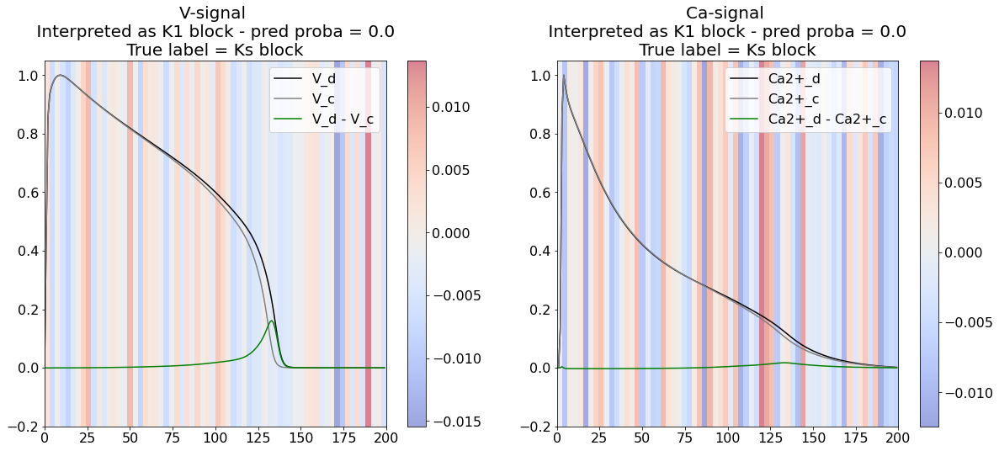

Explainaing with model_Kr
Plotting explanation from model_Kr


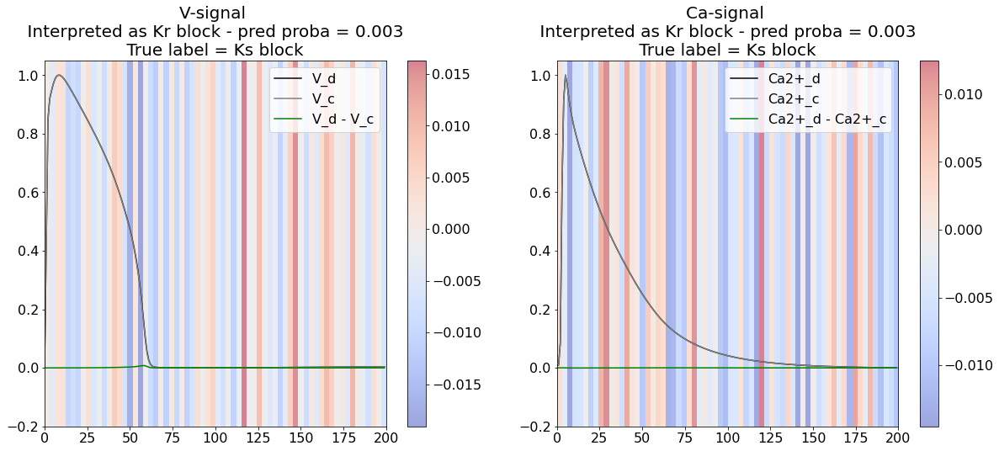

Explainaing with model_CaL
Plotting explanation from model_CaL


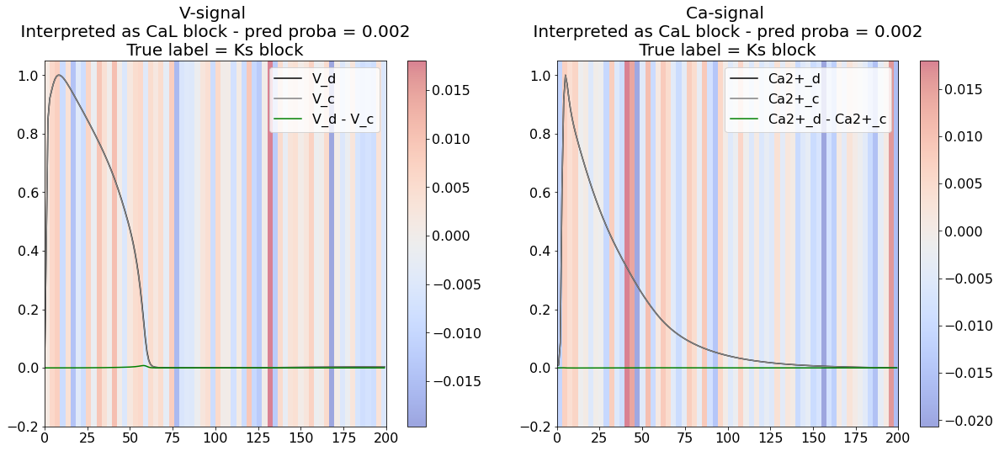

Explainaing with model_Na
Plotting explanation from model_Na


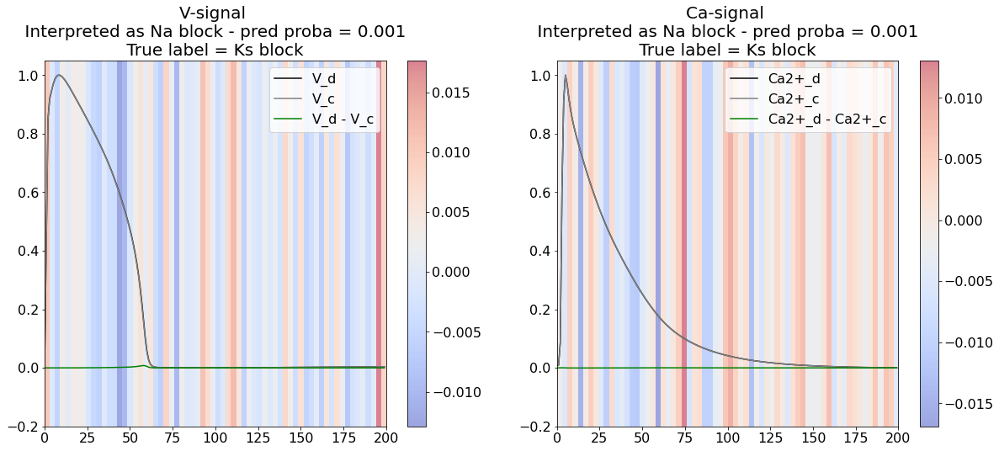

Explainaing with model_NaL
Plotting explanation from model_NaL


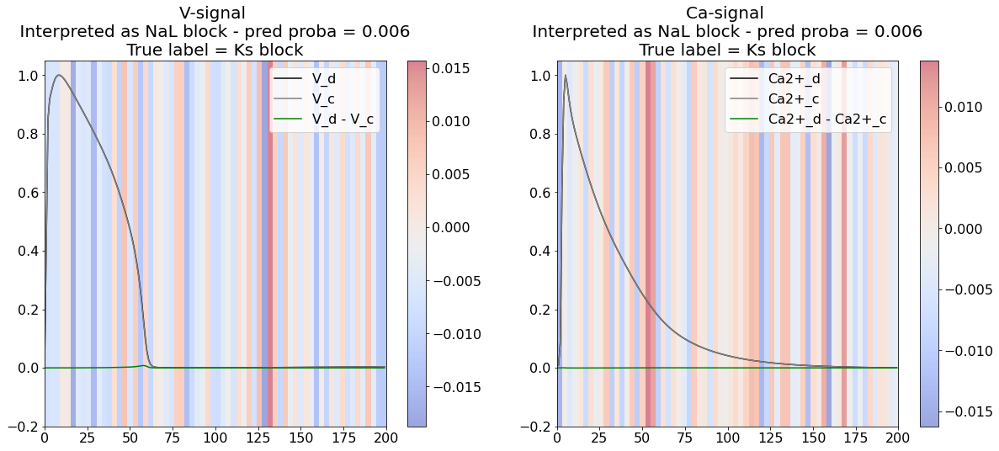

Explainaing with model_to
Plotting explanation from model_to


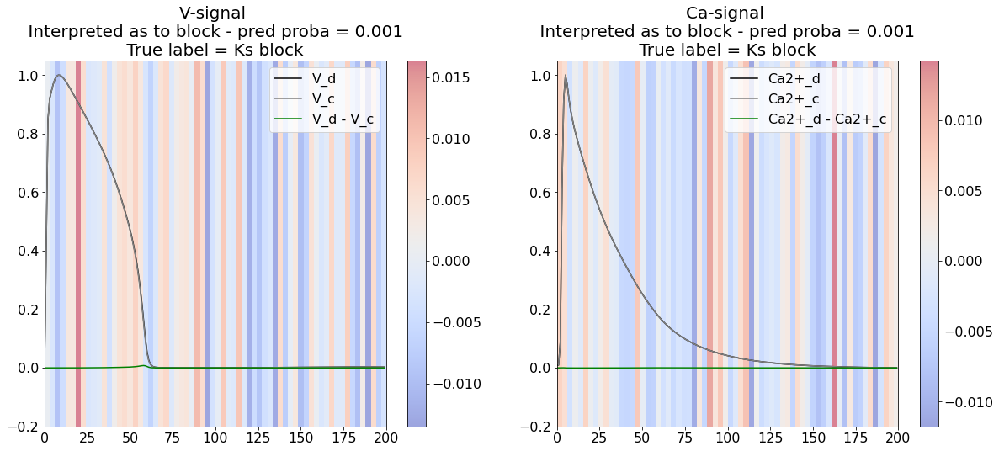

Explainaing with model_Ks
Plotting explanation from model_Ks


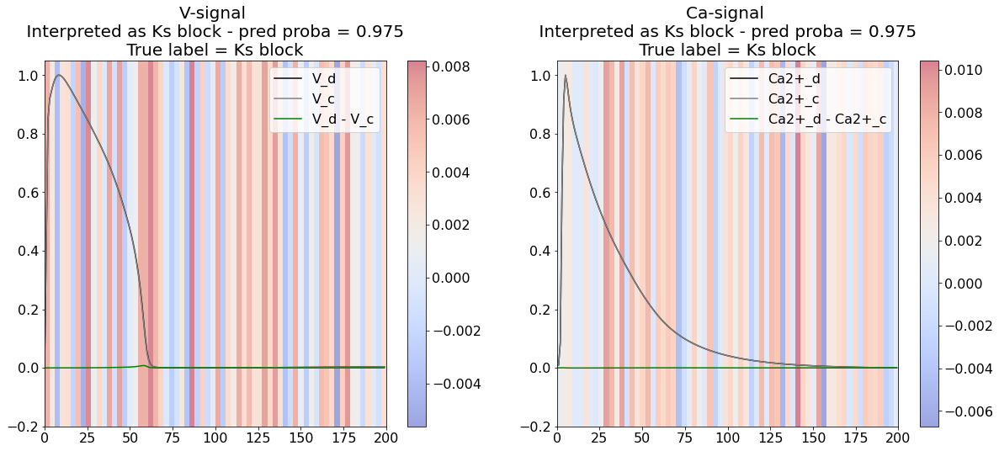

Explainaing with model_K1
Plotting explanation from model_K1


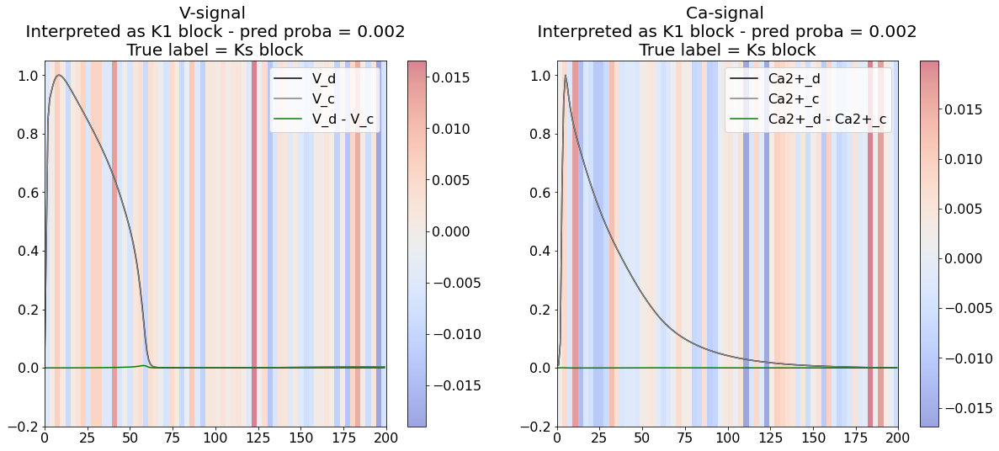

####################################
####################################
Looking at class K1
####################################
####################################
[0 0 0 0 0 0 1]
Explainaing with model_Kr
Plotting explanation from model_Kr


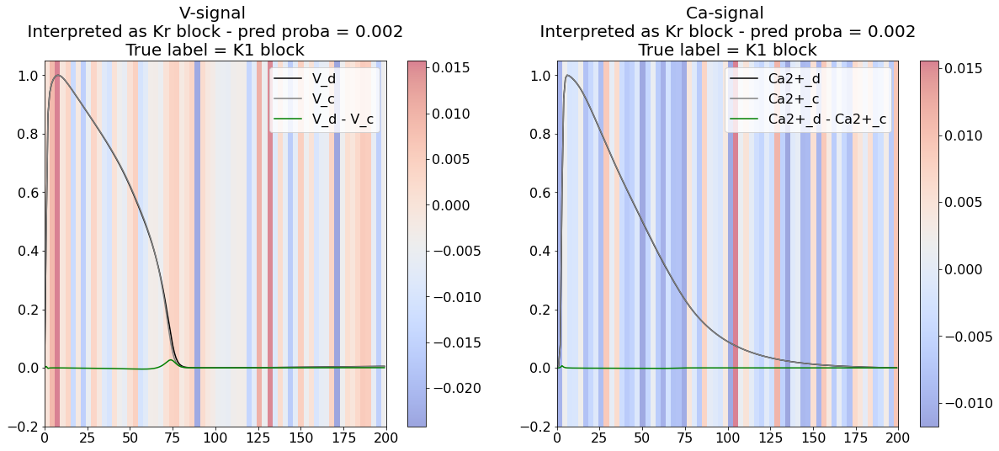

Explainaing with model_CaL
Plotting explanation from model_CaL


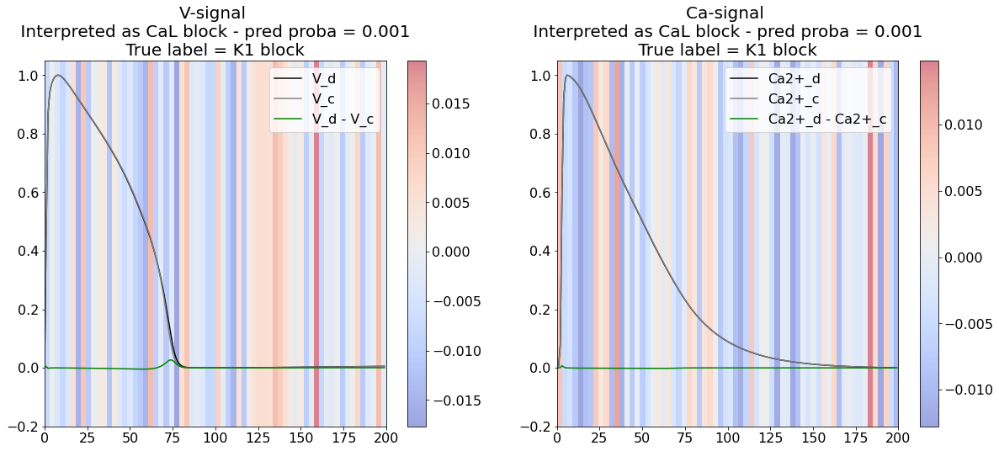

Explainaing with model_Na
Plotting explanation from model_Na


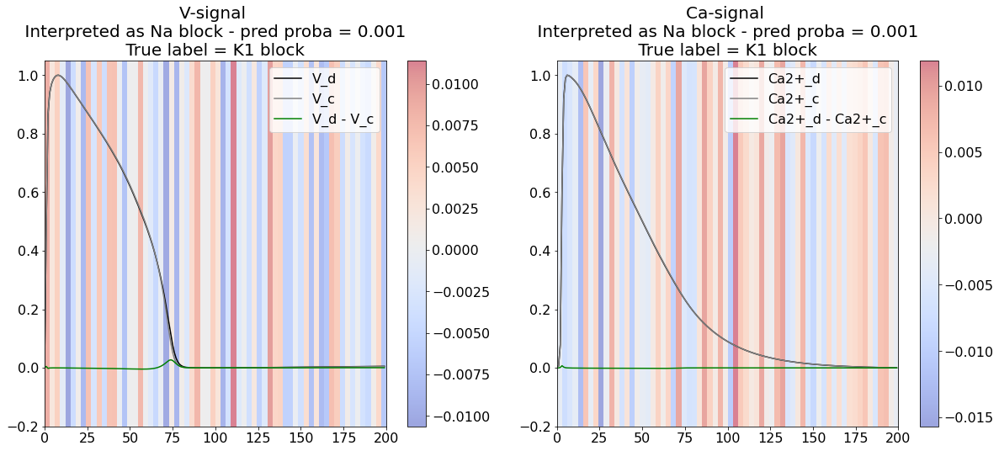

Explainaing with model_NaL
Plotting explanation from model_NaL


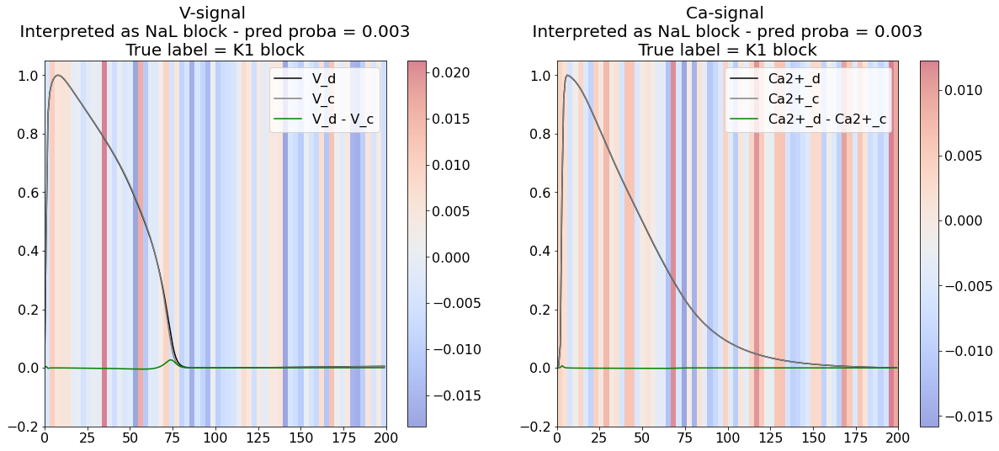

Explainaing with model_to
Plotting explanation from model_to


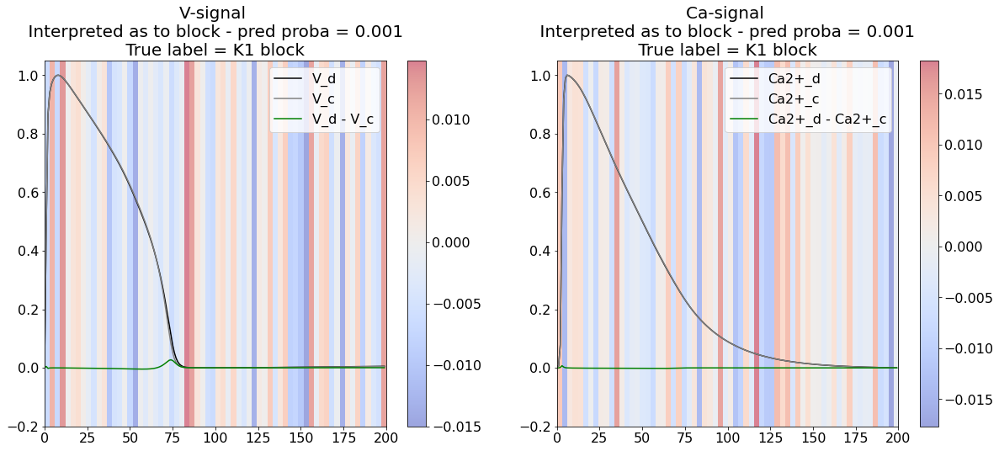

Explainaing with model_Ks
Plotting explanation from model_Ks


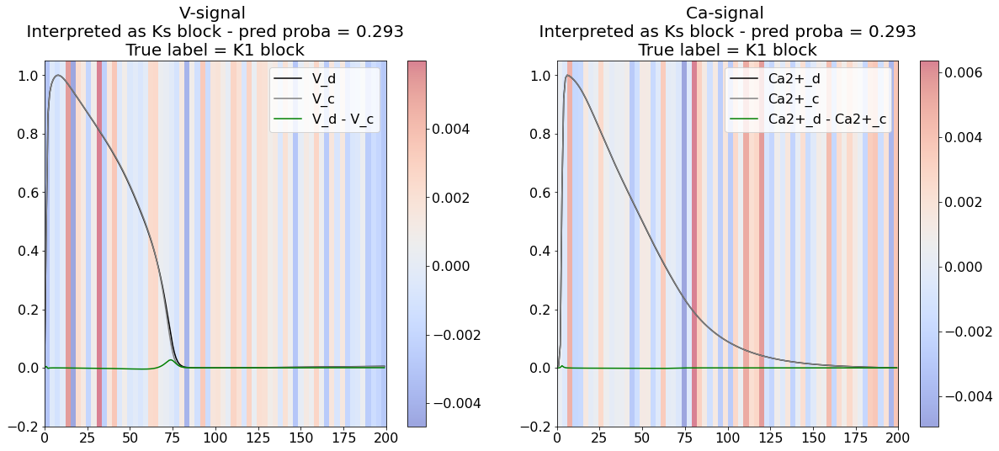

Explainaing with model_K1
Plotting explanation from model_K1


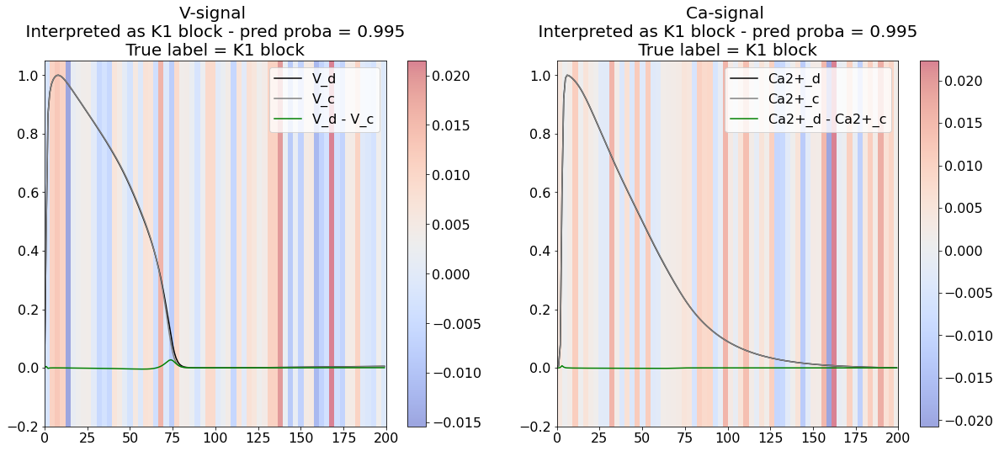

Explainaing with model_Kr
Plotting explanation from model_Kr


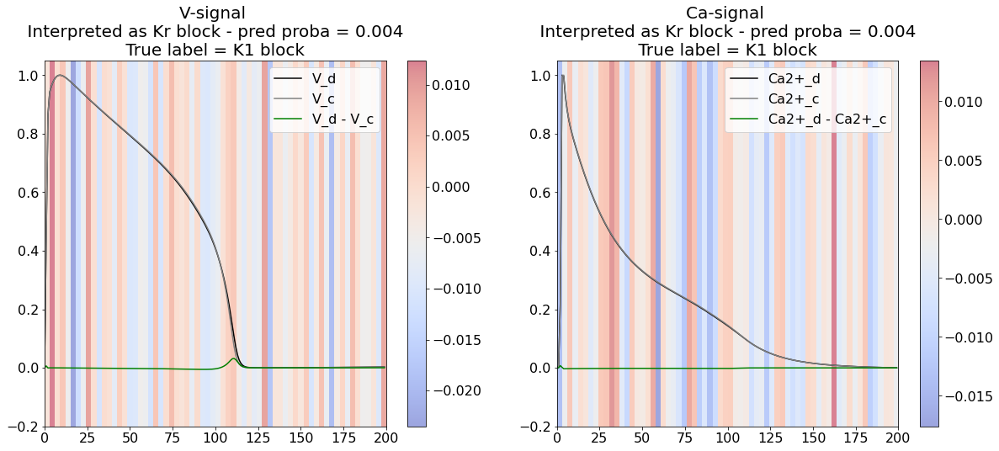

Explainaing with model_CaL
Plotting explanation from model_CaL


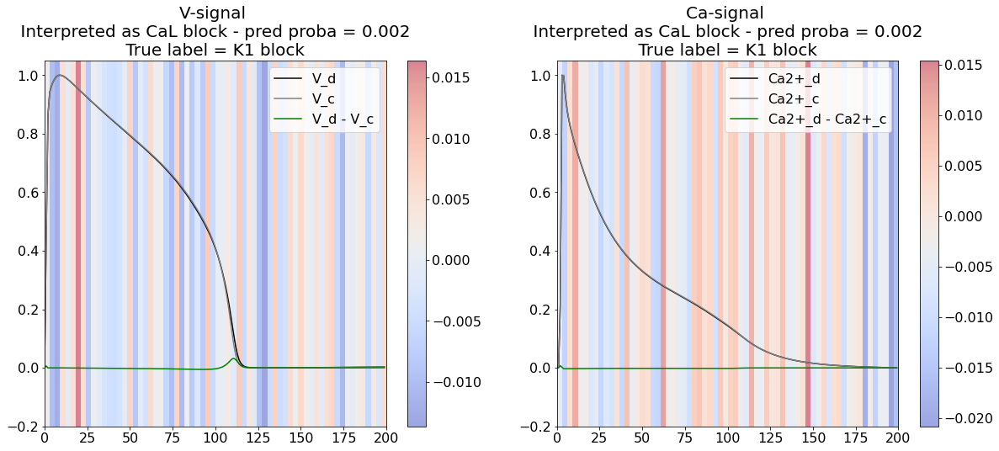

Explainaing with model_Na
Plotting explanation from model_Na


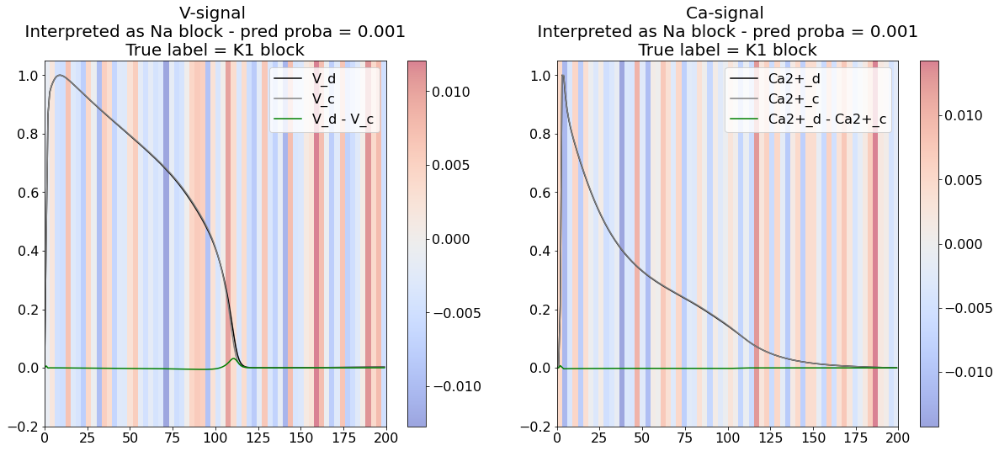

Explainaing with model_NaL
Plotting explanation from model_NaL


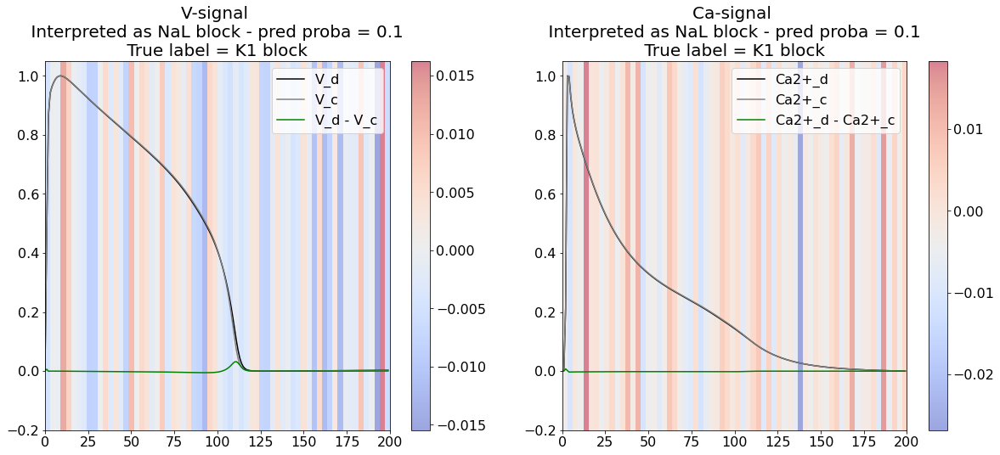

Explainaing with model_to
Plotting explanation from model_to


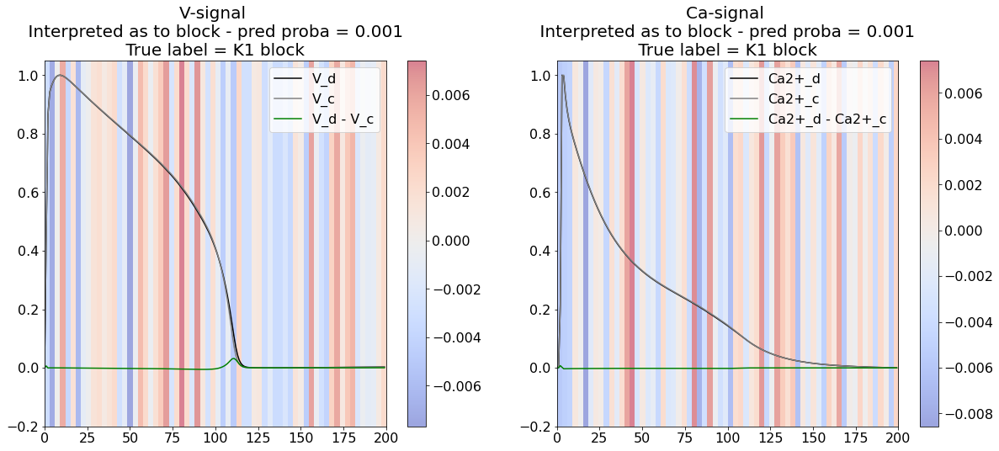

Explainaing with model_Ks
Plotting explanation from model_Ks


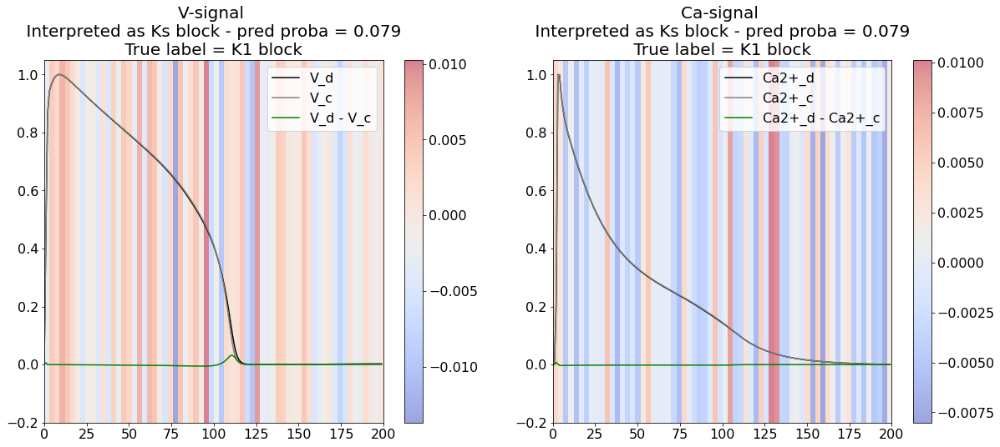

Explainaing with model_K1
Plotting explanation from model_K1


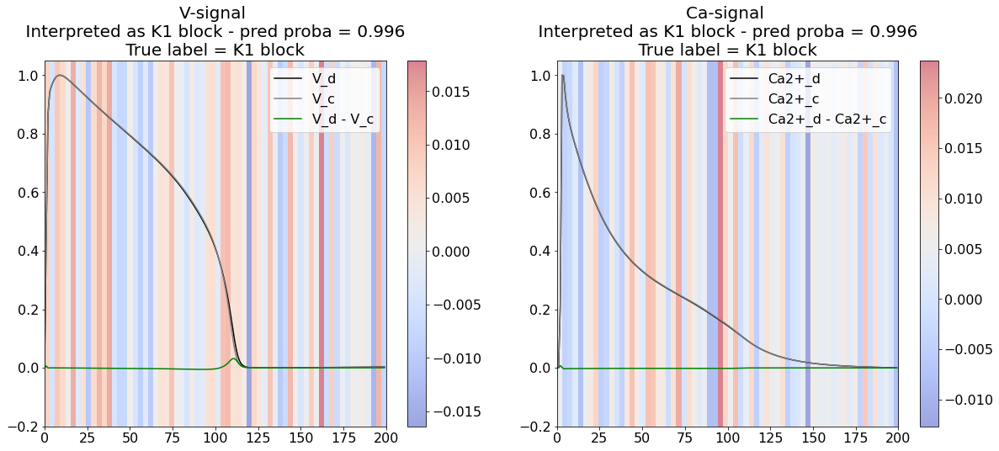

Explainaing with model_Kr
Plotting explanation from model_Kr


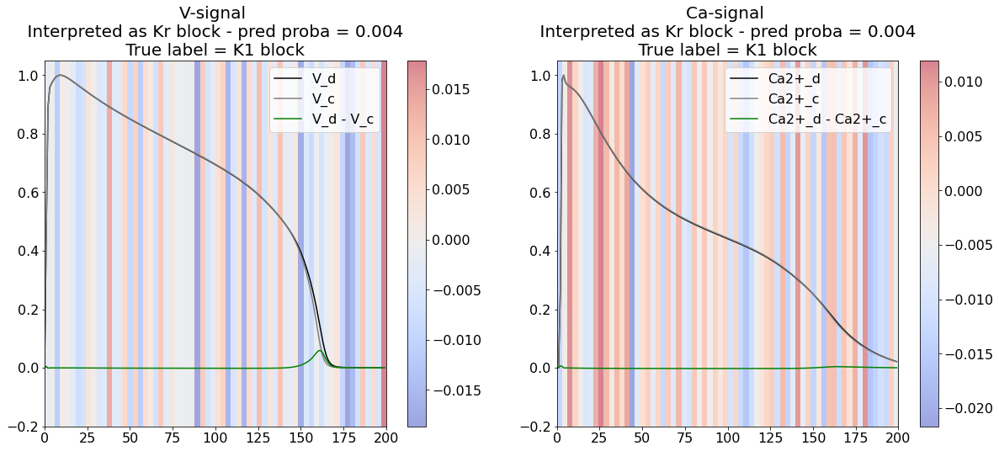

Explainaing with model_CaL
Plotting explanation from model_CaL


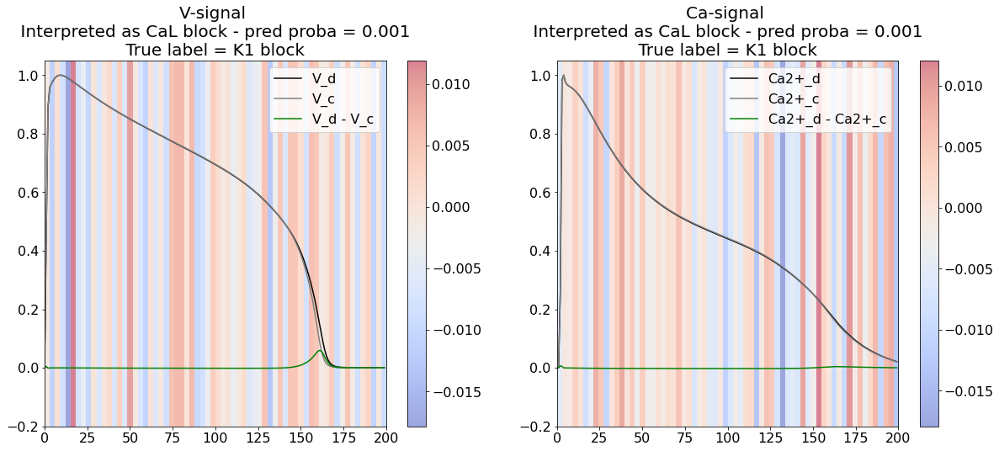

Explainaing with model_Na
Plotting explanation from model_Na


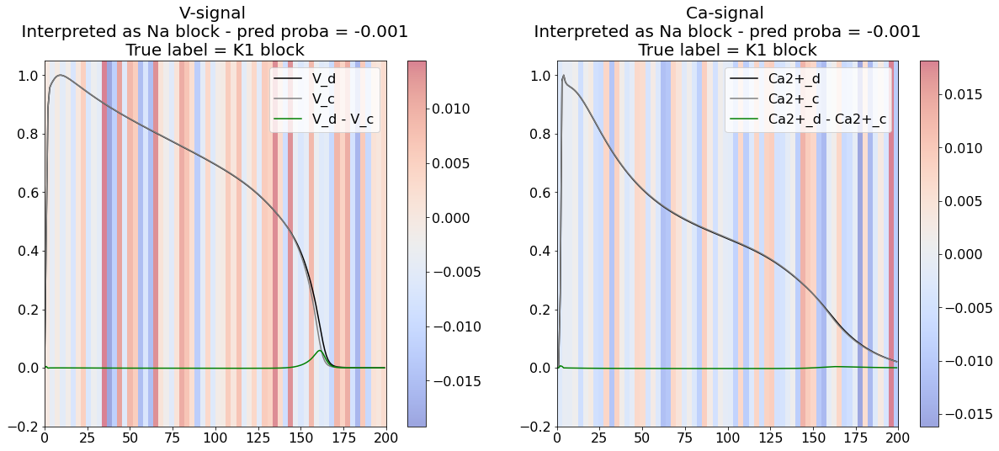

Explainaing with model_NaL
Plotting explanation from model_NaL


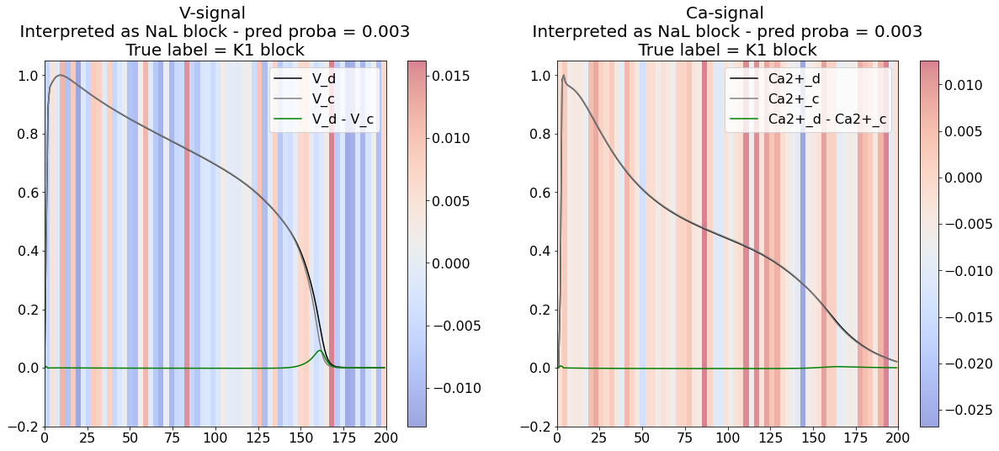

Explainaing with model_to
Plotting explanation from model_to


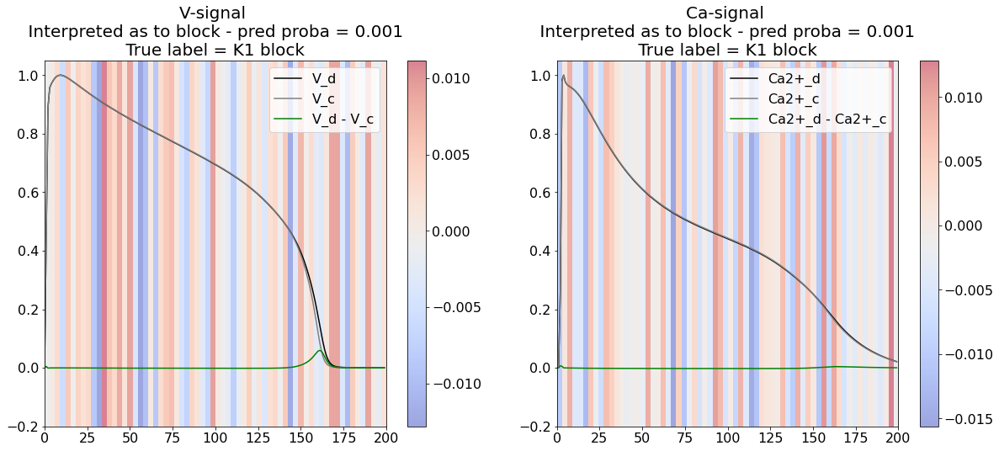

Explainaing with model_Ks
Plotting explanation from model_Ks


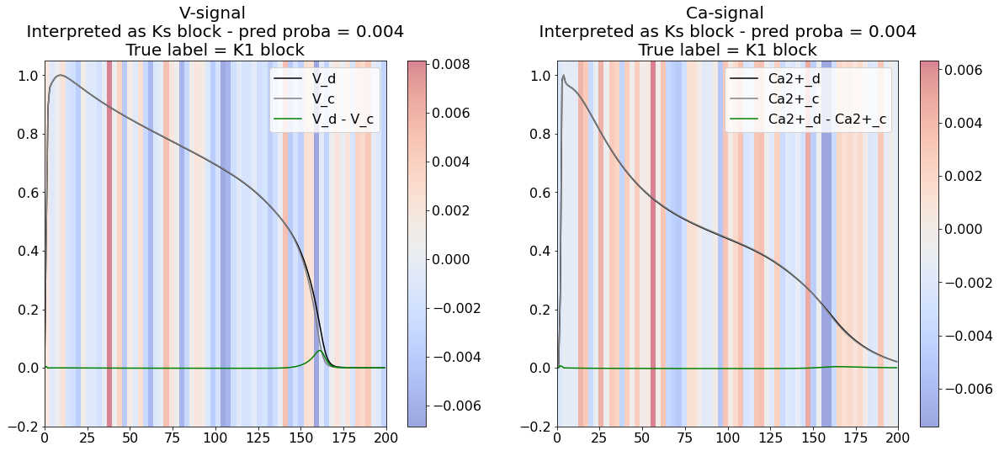

Explainaing with model_K1
Plotting explanation from model_K1


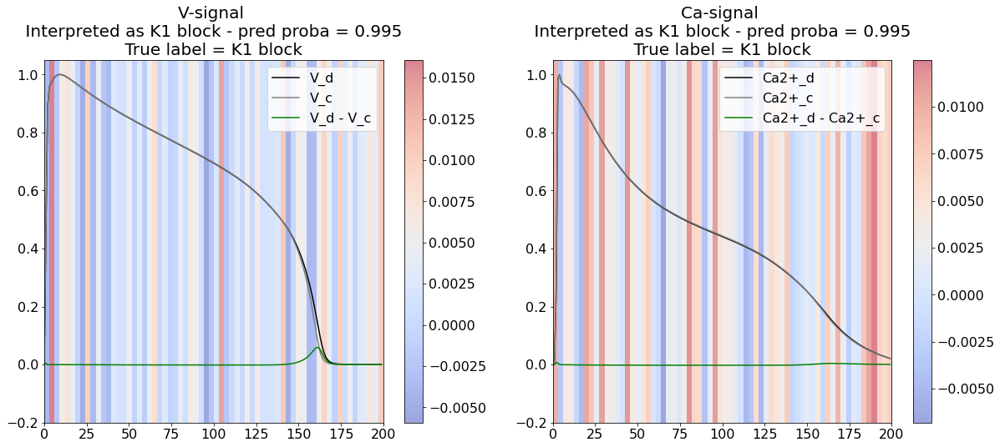

In [38]:
num_class = 7
features = ["V","Ca"]
print(f"Training exp.model")


for n in range(num_class):
    explainer = lime_tabular.RecurrentTabularExplainer(X_train,training_labels=tf.keras.utils.to_categorical(y_test[0:100,n]), feature_names=["V","Ca"],
                                                class_names=['open','blocked'])
    print("####################################")
    print("####################################")
    print(f"Looking at class " + label_order[n])
    print("####################################")
    print("####################################")
    class_arr = np.zeros(7).astype(int)
    class_arr[n] = 1
    indx = []
    print(class_arr)
    for o in range(y_test.shape[0]):
        if (y_test[o] == class_arr).all():
            indx.append(o)
    for p in indx:
        for m in range(num_class):
            wrapped_mod = model_wrapper(best_model.model,num_class= m)
            print(f"Explainaing with model_"+ label_order[m])
            exp = explainer.explain_instance(X_test[p],wrapped_mod.predict, num_features=400, num_samples=50)
            explanations = exp.as_list()
            #exp.show_in_notebook()
            #print(explanations)
            heatmap = np.zeros([2,200])

            for k in explanations:
                if k[0].split("_")[0].split(" ")[-1]=='V':
                    heatmap[0][int(re.split(r"V_t-|Ca_t-", k[0])[1].split(" ")[0])]=k[1]
                elif k[0].split("_")[0].split(" ")[-1]=='Ca':
                    heatmap[1][int(re.split(r"V_t-|Ca_t-", k[0])[1].split(" ")[0])]=k[1]
            print(f"Plotting explanation from model_" + label_order[m])        
            plt.figure(figsize=(20, 8))
            for l in range(2):
                plt.subplot(1, 2, l + 1)
                plt.title("{}-signal \n Interpreted as {} block - pred proba = {} \n True label = {} block ".format(features[l],label_order[m],round(float(exp.local_pred),3),label_order[n]), fontsize=20)

                #plt.imshow(np.expand_dims(average_and_rebin(heatmap[l],5),axis=0),cmap='coolwarm', aspect="auto", interpolation='nearest',extent=[0,200,X_test[p][:,l].min()*1.05,X_test[p][:,l].max()*1.05], alpha=0.5)
                plt.imshow(np.expand_dims(average_and_rebin(heatmap[l],3),axis=0),cmap='coolwarm', aspect="auto", interpolation='nearest',extent=[0,200,-0.2,1.05], alpha=0.5)
                #plt.imshow(np.expand_dims(heatmap[l],axis=0),cmap='coolwarm', aspect="auto", interpolation='bilinear',extent=[0,200,-0.2,1.05], alpha=0.5)
                #plt.plot(X_test[p][:,l],'k')
                
                if l == 0:
                    
                    v_d, =plt.plot(V_d_new[p],'k', label="V_d")
                    v_c, = plt.plot(V_c_new[p],c="0.5", label="V_c")
                    v_dc, = plt.plot(X_test[p][:,l],'green', label="V_d - V_c")
                    plt.legend(handles=[v_d, v_c, v_dc])
                    plt.colorbar()
                    
                elif l == 1:
                    ca_d, = plt.plot(Ca_d_new[p],'k', label="Ca2+_d")
                    ca_c, = plt.plot(Ca_c_new[p],c="0.5", label="Ca2+_c")
                    ca_cd, = plt.plot(X_test[p][:,l],'green', label="Ca2+_d - Ca2+_c")
                    plt.legend(handles=[ca_d, ca_c, ca_cd])
                    plt.colorbar()
            plt.savefig("{}-signal_interpreted_as_{}_block__pred proba_{}__Truelabel_{}_block.png".format(features[l],label_order[m],round(float(exp.local_pred),3),label_order[n]), dpi=100)    
            plt.show()


In [39]:
import os
from zipfile import ZipFile

In [40]:
zipObj = ZipFile('sample.zip', 'w')

In [41]:
for filename in os.listdir("/kaggle/working"):
    if filename.endswith(".png"):
        zipObj.write(filename)
zipObj.close()